In [1]:
import xarray as xr
import matplotlib.pyplot as plt 
import seaborn as sns
import cartopy.crs as ccrs
import seaborn.objects as so
import numpy as np
from dask.distributed import LocalCluster, Client
import flox.xarray
import xesmf as xe
from tqdm.notebook import tqdm
import dask.bag as db
from pyproj import Proj, Transformer, CRS

import pandas as pd
plt.style.use('robin')
proj = ccrs.NorthPolarStereo(0,70)

def sigmoid(x):
    return 1/(1+np.exp(-x))

In [2]:
cluster = LocalCluster(n_workers=8, memory_limit='12GiB')
client = Client(cluster)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 8
Total threads: 64,Total memory: 96.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:34643,Workers: 0
Dashboard: http://127.0.0.1:8787/status,Total threads: 0
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:39713,Total threads: 8
Dashboard: http://127.0.0.1:42763/status,Memory: 12.00 GiB
Nanny: tcp://127.0.0.1:40687,


In [118]:
# run_id = '3w874ud3'
# run_id = '0obl1joe'

run_id = '75kakckt'

# ds_attrs = xr.open_dataset(f'/Data/gfi/users/rogui7909/data/NN_outputs/attributions/newproj/{run_id}_attributions.nc', chunks = dict(time_of_event=20)).load()
ds_attrs = xr.open_dataset(f'/Data/gfi/users/rogui7909/data/NN_outputs/attributions/newproj/{run_id}_ALL_attributions_v2.nc', chunks = dict(time_of_event=20)).load().transpose('y','x',...)

grid = ds_attrs.isel(time_of_event=0, timestep_past=0, var_name=0).features
lrp_normed = ds_attrs.attributions_lrp 
lrp_normed = lrp_normed.sum('var_name')/lrp_normed.sum('var_name').clip(0).sum(['x','y'])
ds_attrs['lrp_normed'] = lrp_normed
ig_normed = ds_attrs.attributions_ig 
ig_normed = ig_normed/ig_normed.sum('var_name').max(['x','y'])
# cycs = cycs.query("msl<100000")
ds_attrs

<xarray.Dataset> Size: 6GB
Dimensions:           (time_of_event: 937, y: 128, x: 128, timestep_past: 7,
                       var_name: 4)
Coordinates:
    quantile          float64 8B 0.95
  * y                 (y) float64 1kB -1e+07 -9.882e+06 ... 4.824e+06 4.941e+06
  * x                 (x) float64 1kB -1e+07 -9.882e+06 ... 4.824e+06 4.941e+06
  * var_name          (var_name) <U4 64B 'u850' 'v850' 'msl' 'z500'
    lat               (y, x) float32 66kB -7.882 -7.546 -7.21 ... 31.67 31.09
    lon               (y, x) float32 66kB -45.0 -44.66 -44.32 ... 135.7 135.0
  * timestep_past     (timestep_past) int64 56B -6 -5 -4 -3 -2 -1 0
  * time_of_event     (time_of_event) datetime64[ns] 7kB 1979-01-07 ... 2025-...
Data variables:
    rain              (time_of_event) float64 7kB 30.89 37.58 ... 23.69 27.42
    targets           (time_of_event) float64 7kB 1.0 1.0 1.0 ... 1.0 1.0 1.0
    features          (y, x, time_of_event, timestep_past, var_name) float32 2GB ...
    attributions_lrp  (y, x, time_of_event, timestep_past, var_name) float32 2GB ...
    predictions       (time_of_event, timestep_past) float32 26kB -0.5857 ......
    attributions_ig   (y, x, time_of_event, timestep_past, var_name) float32 2GB ...
    lrp_normed        (y, x, time_of_event, timestep_past) float32 430MB 0.0 ...

# Load cyclone data

In [6]:
all_df_dailys = []
import glob
files = glob.glob('/Data/gfi/share/Reanalyses/ERA-5/detected_features/cyclone_tracks_melbourne/*.pos.nc')
files = [f for f in files if f.endswith('.nc')]
for file in tqdm(files):
    with xr.open_dataset(file) as ds:
        df_ = ds[['track_id', 'lon','lat','msl','date']].to_dataframe()
        df_['date'] = pd.to_datetime(df_.date.dt.date)
        df_daily = df_.groupby(['date','track_id']).agg({'msl':'min','lon':'mean','lat':'mean'}).reset_index()   
        all_df_dailys.append(df_daily)
        del df_
daily_cycs = pd.concat(all_df_dailys)
proj_stereo = CRS(f"+proj=stere +lat_0=90 +lat_ts=70 +lon_0=0 +x_0=0 +y_0=0 +ellps=WGS84 +units=m")
transformer = Transformer.from_crs("EPSG:4326", proj_stereo, always_xy=True)
# x,y = lonlat_to_northpolarstereo(cycs['lon'].values, cycs['lat'].values, central_longitude=0, latitude_of_true_scale=70)
x,y = transformer.transform(daily_cycs['lon'].values, daily_cycs['lat'].values)
daily_cycs['x'] = x
daily_cycs['y'] = y
daily_cycs = daily_cycs.loc[(daily_cycs.x > -1e7)&(daily_cycs.x < 5e6)&(daily_cycs.y > -1e7)&(daily_cycs.y < 5e6)]

time_min = pd.to_datetime(ds_attrs.time_of_event.min().values - pd.Timedelta('7D'))
time_max = pd.to_datetime(ds_attrs.time_of_event.max().values)

daily_cycs = daily_cycs.loc[(daily_cycs.date>=time_min) & (daily_cycs.date<=time_max)]
daily_cycs = daily_cycs.set_index('date').sort_index()
daily_cycs['track_id']=daily_cycs['track_id'].astype(int).astype(float)

  0%|          | 0/552 [00:00<?, ?it/s]

In [8]:
grid_stack = grid.stack(space=['y','x'])

def get_distance_per_day(day):
    day_str = day.strftime('%Y-%m-%d')
    cyclones_day = daily_cycs.loc[day_str].to_xarray().rename(date='n_cyclone')
    cyclones_day = cyclones_day.assign_coords(n_cyclone=np.arange(cyclones_day.n_cyclone.size))
    distance = np.sqrt((grid_stack.x - cyclones_day.x)**2 + (grid_stack.y - cyclones_day.y)**2).unstack('space')
    distance = distance.assign_coords(track_id=cyclones_day.track_id, cyclone_lon=cyclones_day.lon, cyclone_lat=cyclones_day.lat)
    # per_quadrant_distance = distance.groupby(cyclones_day.poly_id).min()
    return distance

def get_distance_per_day_of_event(day):
    all_distances = []
    day0 = day 
    for k in range(7):
        distance_day = get_distance_per_day(day0 - np.timedelta64(k, 'D'))
        all_distances.append(distance_day.assign_coords(timestep_past=-k))
    return xr.concat(all_distances[::-1], dim='timestep_past',join='outer' ).assign_coords(time_of_event=day).rename('distance_to_cyclones')/1000
    
def get_important_cyclones(day):
    ds_dist = get_distance_per_day_of_event(day)
    attributions_per_distance = flox.xarray.xarray_reduce(
    lrp_normed.sel(time_of_event=day),
    ds_dist,
    ds_dist.n_cyclone,
    ds_dist.timestep_past,
    func="sum",
    expected_groups=(ds_dist.quantile(np.arange(0,1.0001,.01)),
                    None,
                    None,
                    ),
    isbin=[True, False, False,],
    method="map-reduce",
    keep_attrs=True
    )
    attributions_per_distance['distance_to_cyclones_bins'] = [k.mid for k in attributions_per_distance.distance_to_cyclones_bins.values]
    attributions_per_distance = attributions_per_distance.rename(distance_to_cyclones_bins='Distance_to_cyclone')
    important_cyclones_mask = attributions_per_distance.idxmax('Distance_to_cyclone')<2000

    # attributions_per_distance = attributions_per_distance.assign_coords(important = important_cyclones_mask)
    attributions_2000 = lrp_normed.sel(time_of_event=day).where(ds_dist<2000).sum(['x','y'])#.where(important_cyclones_mask)
    tracks = attributions_2000.to_dataframe().dropna().reset_index().groupby('timestep_past').track_id.apply(lambda x:pd.Series(x.values)).astype(int).astype(str).to_xarray()#.set_index()
    attribution_per_track = attributions_2000.to_dataframe().dropna().reset_index().groupby('timestep_past').attributions_lrp.apply(lambda x:pd.Series(x.values)).to_xarray()#.set_index()

    important_cyclones_out = xr.Dataset(dict(tracks = tracks, attributions2000 = attribution_per_track,important = important_cyclones_mask.rename(n_cyclone='level_1'))).rename(level_1 = 'n_cyclone')
    important_cyclones_out['min_dist'] = ds_dist.min('n_cyclone')
    
    return important_cyclones_out

In [9]:
list_times = pd.to_datetime([time for time in ds_attrs.time_of_event.values if time in daily_cycs.index.unique()])
bag = db.from_sequence(list_times, npartitions=100)
results = bag.map(get_important_cyclones)
important_cyclones = xr.concat(results, dim='time_of_event', join='outer')


/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/distributed/client.py:3363: UserWarning: Sending large graph of size 425.86 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/tmp/ipykernel_3009949/4226709182.py:18: FutureWarning: In a future version of xarray the default value for coords will change from coords='different' to coords='minimal'. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set coords explicitly.
/tmp/ipykernel_3009949/4226709182.py:18: FutureWarning: In a future version of xarray the default value for coords will change fr

In [30]:
ds_attrs.sel(y=slice(0,3e5)).features.sel(var_name='msl').min(['x','y']).to_series().sort_values()

time_of_event  timestep_past
1993-12-04     -5              -7.906513
1979-12-27     -5              -7.122635
1991-12-13     -4              -6.762764
1991-12-12     -3              -6.762764
1993-12-04     -4              -6.588330
                                  ...   
2007-03-10     -3               0.127167
2007-03-12     -5               0.127167
2004-02-03     -5               0.153968
2004-02-04     -6               0.153968
2007-12-05     -4               0.275804
Name: features, Length: 6559, dtype: float32

# Show that attribution are statistically closer to cyclone center

In [16]:
ds_ = xr.Dataset(dict(min_dist=important_cyclones.min_dist, lrp_normed=ds_attrs.lrp_normed))#.chunk(time_of_event=100, timestep_past=1)
ds_

<xarray.Dataset> Size: 1GB
Dimensions:        (timestep_past: 7, y: 128, x: 128, time_of_event: 937)
Coordinates:
  * timestep_past  (timestep_past) int64 56B -6 -5 -4 -3 -2 -1 0
  * y              (y) float64 1kB -1e+07 -9.882e+06 ... 4.824e+06 4.941e+06
  * x              (x) float64 1kB -1e+07 -9.882e+06 ... 4.824e+06 4.941e+06
  * time_of_event  (time_of_event) datetime64[ns] 7kB 1979-01-07 ... 2025-06-29
    quantile       float64 8B 0.95
    var_name       <U4 16B 'u850'
    lat            (y, x) float32 66kB -7.882 -7.546 -7.21 ... 32.25 31.67 31.09
    lon            (y, x) float32 66kB -45.0 -44.66 -44.32 ... 136.4 135.7 135.0
Data variables:
    min_dist       (time_of_event, timestep_past, y, x) float64 860MB 1.019e+...
    lrp_normed     (time_of_event, timestep_past, y, x) float32 430MB 0.0 ......

In [17]:
np.random.seed(42)
size = np.arange(ds_.time_of_event.size)
np.random.shuffle(size)

min_dist_random = ds_.min_dist.isel(time_of_event=size).assign_coords(time_of_event=ds_.time_of_event.values)

In [18]:
v1 = np.ravel(ds_.min_dist.values)
v2 = np.ravel(ds_.lrp_normed.values)
idx = np.argsort(v1)
# Apply the same ordering
v1_sorted = v1[idx]
v2_sorted = v2[idx]

dist_sorted = v1_sorted.reshape((128,6559*128))
attrs_sorted = v2_sorted.reshape((128,6559*128))
attrs_sorted = np.sort(attrs_sorted, axis=1,)[:,::-1]
attrs_sorted =xr.DataArray(attrs_sorted*100, dims=['distance','pixel'], coords=dict(distance=np.nanmax(dist_sorted, axis=1),)).T
attrs_sorted = attrs_sorted.where(attrs_sorted.distance.notnull(), drop=True)

/tmp/ipykernel_3009949/937819057.py:11: RuntimeWarning: All-NaN slice encountered
  attrs_sorted =xr.DataArray(attrs_sorted*100, dims=['distance','pixel'], coords=dict(distance=np.nanmax(dist_sorted, axis=1),)).T


In [42]:
v1 = np.ravel(min_dist_random.values)
v2 = np.ravel(ds_.lrp_normed.values)

idx = np.argsort(v1)

# Apply the same ordering
v1_sorted = v1[idx]
v2_sorted = v2[idx]

dist_sorted = v1_sorted.reshape((128,6559*128))
attrs_sorted_random = v2_sorted.reshape((128,6559*128))
attrs_sorted_random = np.sort(attrs_sorted_random, axis=1,)[:,::-1]
attrs_sorted_random =xr.DataArray(attrs_sorted_random*100, dims=['distance','pixel'], coords=dict(distance=np.nanmax(dist_sorted, axis=1),)).T
attrs_sorted_random = attrs_sorted_random.where(attrs_sorted_random.distance.notnull(), drop=True)

/tmp/ipykernel_3009949/4022723300.py:13: RuntimeWarning: All-NaN slice encountered
  attrs_sorted_random =xr.DataArray(attrs_sorted_random*100, dims=['distance','pixel'], coords=dict(distance=np.nanmax(dist_sorted, axis=1),)).T


In [332]:
ds_.min_dist.where(ds_.lrp_normed>.005).groupby_bins(ds_.min_dist.where(ds_.lrp_normed>.005), np.arange(0,3001,100)).count()

<xarray.DataArray 'min_dist' (min_dist_bins: 30)> Size: 240B
array([1111, 4413, 7497, 8399, 7681, 6250, 5036, 4087, 3478, 2892, 2490,
       2066, 1710, 1328,  996,  783,  618,  437,  361,  252,  214,  155,
        106,   81,   59,   65,   73,   70,   52,   56])
Coordinates:
    quantile       float64 8B 0.95
    var_name       <U4 16B 'u850'
  * min_dist_bins  (min_dist_bins) interval[int64, right] 480B (0, 100] ... (...

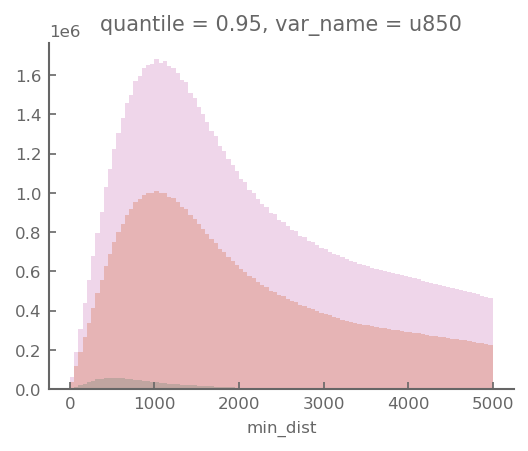

In [339]:
ds_.min_dist.where(ds_.lrp_normed>.01).plot.hist(bins=np.arange(0,5001,50), alpha=.3, label='True distances', )
ds_.min_dist.where(ds_.lrp_normed>.005).plot.hist(bins=np.arange(0,5001,50), alpha=.3, label='True distances', )
ds_.min_dist.where(ds_.lrp_normed>.001).plot.hist(bins=np.arange(0,5001,50), alpha=.3, label='True distances', )
ds_.min_dist.where(ds_.lrp_normed>.0).plot.hist(bins=np.arange(0,5001,50), alpha=.3, label='True distances', )
ds_.min_dist.plot.hist(bins=np.arange(0,5001,50), alpha=.3, label='True distances', )
plt.savefig('plots/plots_leadai/distributions.pdf')

In [341]:
print(ds_.min_dist.where(ds_.lrp_normed>.01).mean().values)
print(ds_.min_dist.where(ds_.lrp_normed>.005).mean().values)
print(ds_.min_dist.where(ds_.lrp_normed>.001).mean().values)
print(ds_.min_dist.where(ds_.lrp_normed>.0).mean().values)


558.2044830179752
673.0657440033374
967.8025736549621
2540.5912755308104


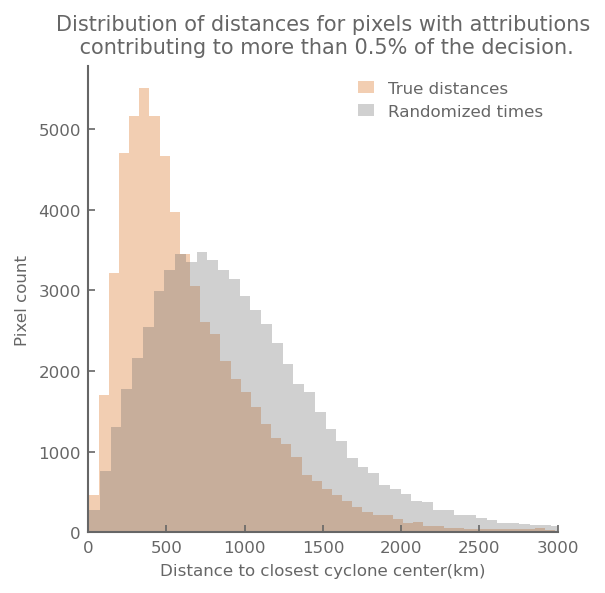

In [325]:
fig, ax = plt.subplots(figsize=(4,4))
ds_.min_dist.where(ds_.lrp_normed>.005).plot.hist(bins=100, alpha=.3, label='True distances', color='C3')
min_dist_random.where(ds_.lrp_normed>.005).plot.hist(bins=100, alpha=.3, label='Randomized times', color='.4')
ax.legend()
ax.set_xlim(0,3000)
ax.set_xlabel('Distance to closest cyclone center(km)')
ax.set_ylabel('Pixel count')
ax.set_title('Distribution of distances for pixels with attributions\n contributing to more than 0.5% of the decision.')
plt.tight_layout()
# ds_

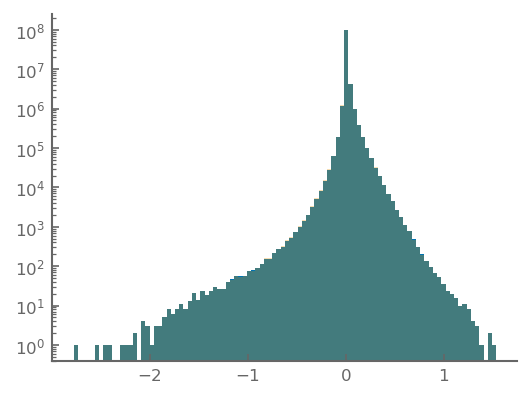

In [36]:
attrs_sorted.plot.hist(bins=100)
attrs_sorted_random.plot.hist(bins=100, alpha=.3)

plt.yscale('log')

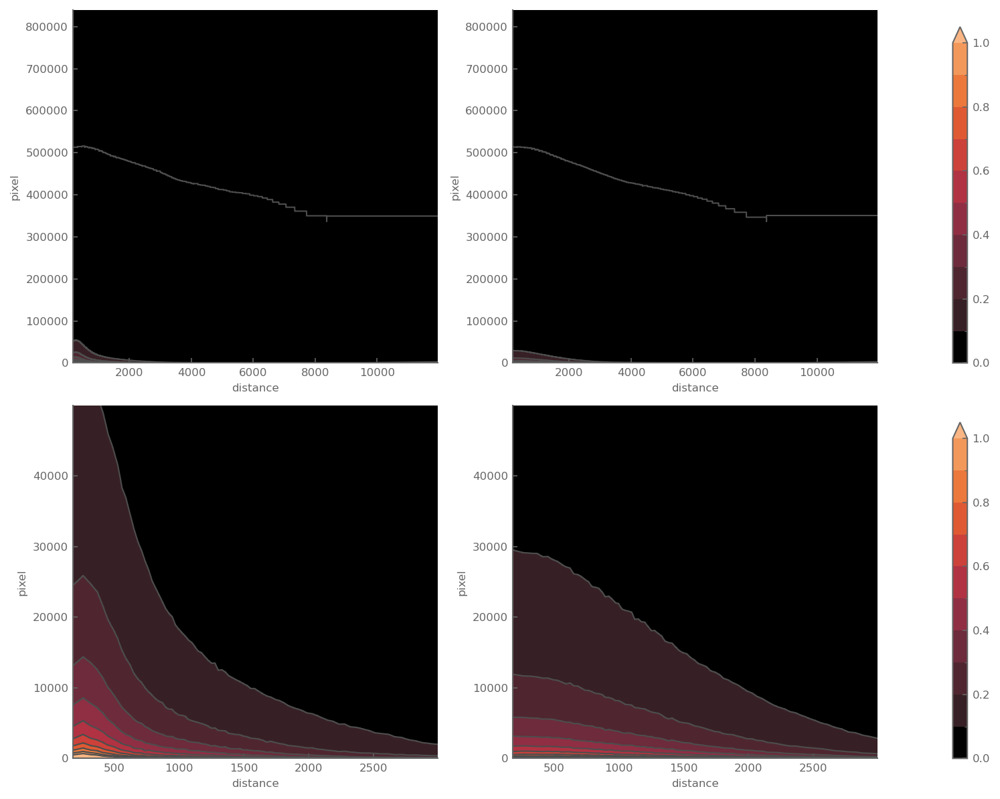

In [48]:
fig, axs = plt.subplots(2,3, figsize=(10,8), width_ratios=[10,10,.4])
cmap = sns.color_palette(sns.color_palette('icefire',22)[-11:])
cmap[0] = [0,0,0]
attrs_sorted.clip(0).plot.contourf(levels=list(np.arange(0,1.1,.1)), colors=cmap, ax=axs[0,0], cbar_ax=axs[0,2])
attrs_sorted_random.clip(0).plot.contourf(levels=list(np.arange(0,1.1,.1)), colors=cmap, ax=axs[0,1], cbar_ax=axs[0,2])
attrs_sorted_random.clip(0).plot.contour(levels=list(np.arange(0,1.1,.1)), colors='.3', ax=axs[0,1],)
attrs_sorted.clip(0).plot.contour(levels=list(np.arange(0,1.1,.1)), colors='.3', ax=axs[0,0],)

attrs_sorted.clip(0).sel(distance=slice(0,3000), pixel=slice(0,50000)).plot.contourf(levels=list(np.arange(0,1.1,.1)), colors=cmap, ax=axs[1,0], cbar_ax=axs[1,2])
attrs_sorted_random.clip(0).sel(distance=slice(0,3000), pixel=slice(0,50000)).plot.contourf(levels=list(np.arange(0,1.1,.1)), colors=cmap, ax=axs[1,1], cbar_ax=axs[1,2])
attrs_sorted_random.clip(0).sel(distance=slice(0,3000), pixel=slice(0,50000)).plot.contour(levels=list(np.arange(0,1.1,.1)), colors='.3', ax=axs[1,1],)
attrs_sorted.clip(0).sel(distance=slice(0,3000), pixel=slice(0,50000)).plot.contour(levels=list(np.arange(0,1.1,.1)), colors='.3', ax=axs[1,0],)
# axs[0].set_yscale('log')
# axs[1].set_yscale('log')
# axs[1].set_ylim(1,1e6)
# axs[0].set_ylim(1,1e6)

plt.tight_layout()

# Tracking examples

In [120]:
daily_cycs.track_id = daily_cycs.track_id.astype(int).astype(str)

In [121]:
ds_attrs.rain.to_series().sort_values()

time_of_event
1986-11-05    22.540800
2009-01-08    22.555469
2017-10-28    22.565134
1997-10-17    22.571513
2015-12-23    22.585492
                ...    
1984-08-30    64.063728
2020-11-18    64.971685
2025-03-05    65.987884
2024-10-31    72.397111
2005-11-14    85.231703
Name: rain, Length: 937, dtype: float64

In [122]:
important_cyclones[['tracks','attributions2000','important']].to_dataframe().reset_index().query('important==1')

,time_of_event,timestep_past,n_cyclone,tracks,attributions2000,important,quantile,var_name
2,1979-01-07,-6,2,67,0.329886,1.0,0.95,u850
3,1979-01-07,-6,3,63,0.378630,1.0,0.95,u850
35,1979-01-07,-5,7,101,0.174587,1.0,0.95,u850
38,1979-01-07,-5,10,0,0.211272,1.0,0.95,u850
39,1979-01-07,-5,11,13,0.140774,1.0,0.95,u850
...,...,...,...,...,...,...,...,...
181846,2024-12-29,-1,14,955671,0.476900,1.0,0.95,u850
181860,2024-12-29,0,0,955981,0.572221,1.0,0.95,u850
181863,2024-12-29,0,3,955944,0.604920,1.0,0.95,u850
181869,2024-12-29,0,9,955824,0.751251,1.0,0.95,u850


In [123]:
top = important_cyclones[['tracks','attributions2000','important']].to_dataframe().reset_index().query('important==1').groupby(['time_of_event','tracks']).attributions2000.agg(['count','mean','min']).reset_index()
def sigmoid(x):
    return 1/(1+np.exp(-x))
TP = (sigmoid(ds_attrs.predictions)>0.6).sum('timestep_past').to_series()
top['TP'] = TP.loc[top.time_of_event].values

top=top.query("(count>4)&(min>.3)")
all_trajs = []
all_cys =[]
for t in tqdm(top.tracks):
    # try:
    all_trajs.append(np.sqrt((daily_cycs.set_index('track_id').loc[t].diff()[['x','y']]**2).sum(axis=1)).sum()/1000)
    all_cys.append(t)
    # except:
top['traj'] = all_trajs
# top[]
top

  0%|          | 0/91 [00:00<?, ?it/s]

,time_of_event,tracks,count,mean,min,TP,traj
52,1979-03-05,3490,5,0.653579,0.426933,7,2196.404165
177,1979-10-20,16756,5,0.484459,0.426751,6,2161.956781
233,1979-11-29,18978,5,0.529986,0.440919,7,2586.208570
488,1980-12-24,41080,6,0.607655,0.410087,7,6764.036309
746,1981-11-04,58409,6,0.428109,0.314415,7,2658.606618
...,...,...,...,...,...,...,...
12433,2021-12-15,891980,7,0.542464,0.324484,7,5307.293339
12441,2021-12-30,892724,5,0.562078,0.492893,6,6693.195971
12580,2022-02-09,895233,5,0.639809,0.360436,6,6177.371057
13198,2024-08-09,947249,7,0.425936,0.330040,5,9444.094145


In [ ]:
def plot_cycs_traj(time, cyc_, vmax=0.005):
    all_important = []
    for k in range(7):
        time_ = time +(k-6)*pd.Timedelta('1D')
        cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
        important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k).tracks.dropna('n_cyclone').values
        important_cyclones_ = cyclones_.loc[important_cyclones_]
        important_cyclones_['attribution2000'] = important_cyclones.sel(time_of_event=time).isel(timestep_past=k).attributions2000.dropna('n_cyclone').values
        important_cyclones_['timestep_past'] = (k-6) 
        all_important.append(important_cyclones_)
    important_cyclones_tracks = pd.concat(all_important).reset_index()
    important_cyclones_tracks['track_id']=important_cyclones_tracks['track_id'].astype(str)

    palette = sns.color_palette('tab20')

    # colors = {id:palette[k] for k,id in enumerate(importaxnt_cyclones_tracks.track_id.unique())}
    # # colors

    plot = ((lrp_normed.sel(time_of_event=time))/(lrp_normed.sel(time_of_event=time)).quantile(0.99,['x','y','timestep_past'])).plot(x='x',y='y',col='timestep_past', subplot_kws=dict(projection=proj), transform=proj,size=4, col_wrap=7, aspect=1, cmap='icefire', vmax=vmax)
    for k, ax in enumerate(plot.axs.flat):
        ax.coastlines(color='.7')
        # sns.lineplot(important_cyclones_tracks.sort_values('timestep_past'), x='x',y='y', sort=False, hue='track_id',ax=ax)
        sns.lineplot(important_cyclones_tracks.query("track_id==@cyc_")
                        ,x='x', y='y', color='.6', linewidth=1, zorder=10, transform=proj,ax=ax, legend=False, sort=False)
        timestep_past = (k-6)
        sns.scatterplot(important_cyclones_tracks.query("(timestep_past==@timestep_past)&(track_id==@cyc_)")
                        ,x='x', y='y', s=100,edgecolor='1',zorder=100, linewidth=2, transform=proj,ax=ax, legend=True,
                        color=None, facecolor='none')
        ax.set_extent((ds_attrs.x.min(),ds_attrs.x.max(),ds_attrs.y.min(),ds_attrs.y.max(),), crs=proj)
    plt.suptitle(time)

/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/pyproj/transformer.py:816: UserWarning: Warning: converting a masked element to nan.
  return self._transformer._transform_point(
/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/pyproj/transformer.py:816: UserWarning: Warning: converting a masked element to nan.
  return self._transformer._transform_point(
/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/pyproj/transformer.py:816: UserWarning: Warning: converting a masked element to nan.
  return self._transformer._transform_point(
/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/pyproj/transformer.py:816: UserWarning: Warning: converting a masked element to nan.
  return self._transformer._transform_point(
/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/pyproj/transformer.py:816: UserWarning: Warning: converting a masked element to nan.
  return s

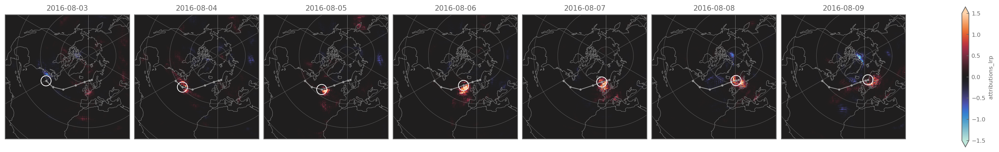

In [383]:
time = pd.to_datetime('2016-08-09')
cyc_='778065'

all_important = []
for k in range(7):
    time_ = time +(k-6)*pd.Timedelta('1D')
    cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
    important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k).tracks.dropna('n_cyclone').values
    important_cyclones_ = cyclones_.loc[important_cyclones_]
    important_cyclones_['attribution2000'] = important_cyclones.sel(time_of_event=time).isel(timestep_past=k).attributions2000.dropna('n_cyclone').values
    important_cyclones_['timestep_past'] = (k-6) 
    all_important.append(important_cyclones_)
important_cyclones_tracks = pd.concat(all_important).reset_index()
important_cyclones_tracks['track_id']=important_cyclones_tracks['track_id'].astype(str)

palette = sns.color_palette('tab20')

# colors = {id:palette[k] for k,id in enumerate(importaxnt_cyclones_tracks.track_id.unique())}
# # colors
data = ((lrp_normed.sel(time_of_event=time)))/(lrp_normed.sel(time_of_event=time)).quantile(0.999,['x','y','timestep_past'])
plot = data.plot(x='x',y='y',col='timestep_past', 
                 subplot_kws=dict(projection=proj), transform=proj,
                 size=3, aspect=1, cmap='icefire', vmax=1.5, rasterized=True)
for k, ax in enumerate(plot.axs.flat):
    ax.coastlines(color='.5', lw=.5)
    time_ = time +(k-6)*pd.Timedelta('1D')
    ax.set_title(f"{time_.strftime('%Y-%m-%d')}")
    # sns.lineplot(important_cyclones_tracks.sort_values('timestep_past'), x='x',y='y', sort=False, hue='track_id',ax=ax)
    sns.lineplot(important_cyclones_tracks.query("track_id==@cyc_")
                    ,x='x', y='y', color='.6', linewidth=1, zorder=10, transform=proj,ax=ax, legend=False, sort=False, marker='o', markeredgecolor='none', markersize=3)
    timestep_past = (k-6)
    sns.scatterplot(important_cyclones_tracks.query("(timestep_past==@timestep_past)&(track_id==@cyc_)")
                    ,x='x', y='y', s=200,edgecolor='1',zorder=100, linewidth=1, transform=proj,ax=ax, legend=True,
                    color=None, facecolor='none')
    ax.set_extent((ds_attrs.x.min(),ds_attrs.x.max(),ds_attrs.y.min(),ds_attrs.y.max(),), crs=proj)
    gl = ax.gridlines(
        crs=ccrs.PlateCarree(),
        draw_labels=False,       # add tick labels
        linewidth=0.4,
        linestyle="-",
        alpha=0.5,
        zorder=2
    )
# plt.suptitle(time)
plt.savefig('plots/plots_leadai/cyclonetracking.pdf', dpi=300)

In [381]:
ds_attrs.sel(time_of_event='2016-08-09').predictions

<xarray.DataArray 'predictions' (timestep_past: 7)> Size: 28B
array([-0.31094822,  0.1492028 ,  0.37848344,  0.5879511 ,  0.6618306 ,
        0.5741679 ,  0.00103817], dtype=float32)
Coordinates:
    quantile       float64 8B 0.95
  * timestep_past  (timestep_past) int64 56B -6 -5 -4 -3 -2 -1 0
    time_of_event  datetime64[ns] 8B 2016-08-09

In [344]:
top.set_index('time_of_event').loc[['2016-08-09']]

,tracks,count,mean,min,TP,traj
time_of_event,,,,,,
2016-08-09,778065,6,0.498869,0.356382,3,6019.846162


/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/pyproj/transformer.py:816: UserWarning: Warning: converting a masked element to nan.
  return self._transformer._transform_point(
/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/pyproj/transformer.py:816: UserWarning: Warning: converting a masked element to nan.
  return self._transformer._transform_point(
/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/pyproj/transformer.py:816: UserWarning: Warning: converting a masked element to nan.
  return self._transformer._transform_point(
/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/pyproj/transformer.py:816: UserWarning: Warning: converting a masked element to nan.
  return self._transformer._transform_point(
/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/pyproj/transformer.py:816: UserWarning: Warning: converting a masked element to nan.
  return s

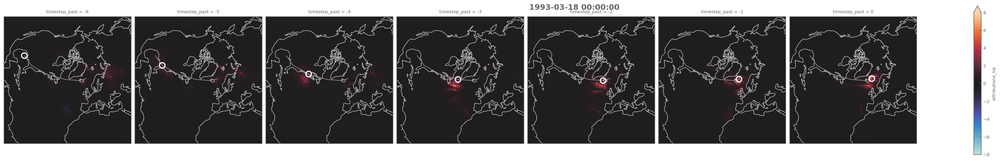

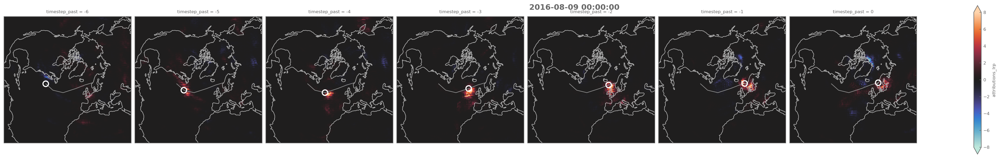

In [127]:

for index, line in top.sort_values('traj', ascending=False).set_index('time_of_event').loc[['1993-03-18','2016-08-09']].reset_index().iterrows():
    plot_cycs_traj(line.time_of_event, line.tracks, vmax=8)

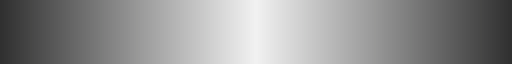

In [261]:
palette_rdbu

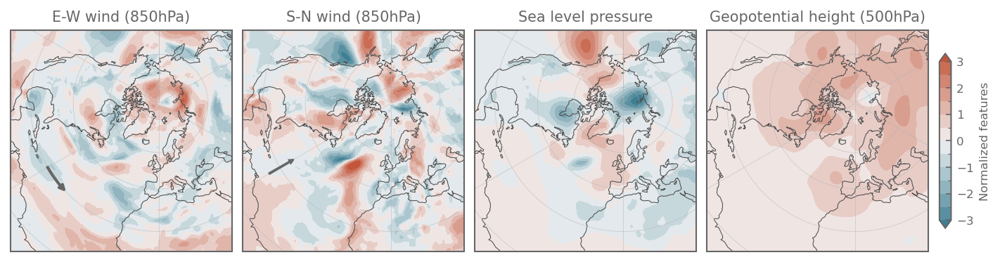

In [267]:
data = ds_attrs.sel(time_of_event='2016-08-09').features.sel(timestep_past=-4)
palette_rdbu = sns.diverging_palette(220, 20, as_cmap=True,  )
plot =data.plot.contourf(col='var_name', subplot_kws=dict(projection=proj), transform=proj, levels=np.arange(-3,3.1,.5), 
                   cbar_kwargs=dict(shrink=.6, aspect=15, label='Normalized features', pad=0.01),
                   cmap=palette_rdbu,
                   aspect=.8,
                     zorder=0)
for ax in plot.axs.flat:
    ax.coastlines(color='.3', lw=.5)
    # sns.lineplot(daily_cycs.query("track_id=='778065'"), x='x', y='y', transform=proj,ax=ax)
    # sns.scatterplot(daily_cycs.query("(track_id=='778065')").loc[['2016-08-05']], x='x', y='y', transform=proj,ax=ax)
    gl = ax.gridlines(
        crs=ccrs.PlateCarree(),
        draw_labels=False,       # add tick labels
        linewidth=0.4,
        linestyle="-",
        alpha=0.5,
        zorder=2
    )
plot.axs[0,0].set_title('E-W wind (850hPa)')
plot.axs[0,1].set_title('S-N wind (850hPa)')
plot.axs[0,2].set_title('Sea level pressure')
plot.axs[0,3].set_title('Geopotential height (500hPa)')

plot.axs[0,1].arrow(
    -60, 15,
    0, 10,           # Δlon = 0 → vertical arrow
    transform=ccrs.PlateCarree(),
    width=0.5, head_width=2, head_length=2,
    fc='.4', ec='.4', zorder=5
)


ax= plot.axs[0,0]
lat = 20.0
lon_start, lon_end = -60, -50
lons = np.linspace(lon_start, lon_end, 400)
lats = np.full_like(lons, lat)

# The line will "curl" according to the projection because we provide PlateCarree coords.
ax.plot(lons, lats, transform=ccrs.PlateCarree(), lw=2, color='.4', zorder=5)

# Arrowhead: use a small segment near the end so it aligns with the curve's local tangent
ax.annotate(
    '',
    xy=(lons[-1]+5, lats[-1]), xytext=(lons[-2], lats[-2]),
    arrowprops=dict(arrowstyle='-|>', lw=2, color='.4'),
    transform=ccrs.PlateCarree(),
    zorder=6
)
plt.savefig('plots/plots_leadai/example_input.pdf')

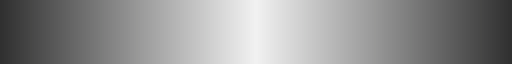

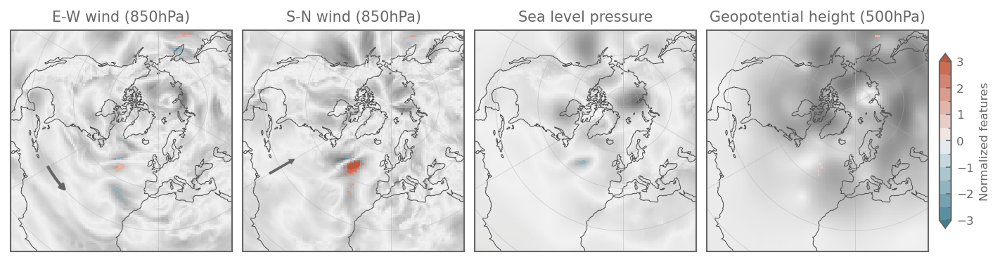

In [268]:
data = ds_attrs.sel(time_of_event='2016-08-09').features.sel(timestep_past=-4)
data_mask = ds_attrs.sel(time_of_event='2016-08-09').attributions_lrp.sel(timestep_past=-4)
grey_palette = sns.diverging_palette(
    220,20,          # same hue → grayscale
    s=0, center="light", # saturation=0 (gray), light center
    as_cmap=True
)

plot =data.plot.contourf(col='var_name', subplot_kws=dict(projection=proj), transform=proj, levels=np.arange(-3,3.1,.5), 
                   cbar_kwargs=dict(shrink=.6, aspect=15, label='Normalized features', pad=0.01),
                   cmap=palette_rdbu,
                   aspect=.8,
                     zorder=0)
for k,ax in enumerate(plot.axs.flat):
    data.where(data_mask<0.002).isel(var_name=k).plot(add_colorbar=False, cmap=grey_palette,ax=ax)
    ax.coastlines(color='.3', lw=.5)
    # sns.lineplot(daily_cycs.query("track_id=='778065'"), x='x', y='y', transform=proj,ax=ax)
    # sns.scatterplot(daily_cycs.query("(track_id=='778065')").loc[['2016-08-05']], x='x', y='y', transform=proj,ax=ax)
    gl = ax.gridlines(
        crs=ccrs.PlateCarree(),
        draw_labels=False,       # add tick labels
        linewidth=0.4,
        linestyle="-",
        alpha=0.5,
        zorder=2
    )
plot.axs[0,0].set_title('E-W wind (850hPa)')
plot.axs[0,1].set_title('S-N wind (850hPa)')
plot.axs[0,2].set_title('Sea level pressure')
plot.axs[0,3].set_title('Geopotential height (500hPa)')

plot.axs[0,1].arrow(
    -60, 15,
    0, 10,           # Δlon = 0 → vertical arrow
    transform=ccrs.PlateCarree(),
    width=0.5, head_width=2, head_length=2,
    fc='.4', ec='.4', zorder=5
)


ax= plot.axs[0,0]
lat = 20.0
lon_start, lon_end = -60, -50
lons = np.linspace(lon_start, lon_end, 400)
lats = np.full_like(lons, lat)

# The line will "curl" according to the projection because we provide PlateCarree coords.
ax.plot(lons, lats, transform=ccrs.PlateCarree(), lw=2, color='.4', zorder=5)

# Arrowhead: use a small segment near the end so it aligns with the curve's local tangent
ax.annotate(
    '',
    xy=(lons[-1]+5, lats[-1]), xytext=(lons[-2], lats[-2]),
    arrowprops=dict(arrowstyle='-|>', lw=2, color='.4'),
    transform=ccrs.PlateCarree(),
    zorder=6
)
plt.savefig('plots/plots_leadai/example_input_masked.pdf')

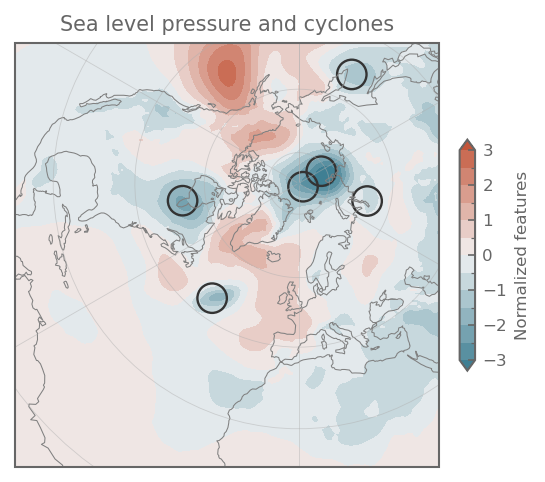

In [307]:
data = ds_attrs.sel(time_of_event='2016-08-09').features.sel(var_name='msl').sel(timestep_past=-4)
# data = data /data.max()
plot =data.plot.contourf( subplot_kws=dict(projection=proj), transform=proj,  extend='both',
                                        #  add_colorbar=False,
                   cbar_kwargs=dict(shrink=.4, aspect=15, label='Normalized features', pad=0.04),
                   size=5,
                   levels=np.arange(-3,3.1,.5), 
                   aspect=.9,
                     zorder=0,
                     cmap=palette_rdbu)
ax = plot.axes
# for ax in plot.axs.flat:
ax.coastlines(color='.5', lw=.5)
# sns.lineplot(daily_cycs.query("track_id=='778065'"), x='x', y='y', transform=proj,ax=ax)
sns.scatterplot(daily_cycs.loc[['2016-08-05']].query('msl<100000'), x='x', y='y', transform=proj,ax=ax, color='none', s=200, edgecolor='.2')
gl = ax.gridlines(
    crs=ccrs.PlateCarree(),
    draw_labels=False,       # add tick labels
    linewidth=0.4,
    linestyle="-",
    alpha=0.5,
    zorder=2
)
ax.set_title('Sea level pressure and cyclones')
# plot.colorbar.ax.set_yticks([])
# plot.colorbar.ax.set_ylabel('Negative', loc='bottom')
# plot.colorbar.ax.set_ylabel('Positive', loc='top')
plt.savefig('plots/plots_leadai/cyclones.pdf')

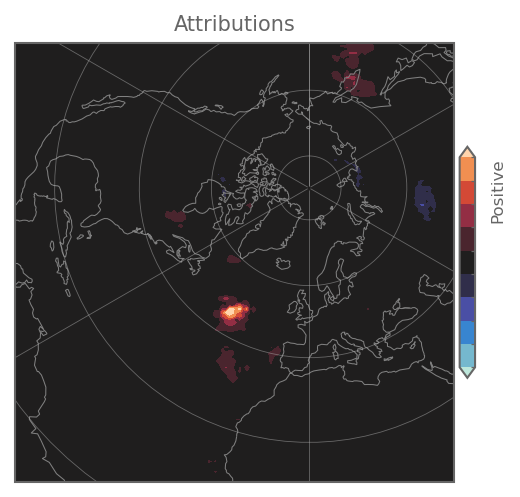

In [309]:
data = ds_attrs.sel(time_of_event='2016-08-09').attributions_lrp.sum('var_name').sel(timestep_past=-4)
data = data /data.max()
plot =data.clip(max=.9999).plot.contourf( subplot_kws=dict(projection=proj), transform=proj,  extend='both',
                   cbar_kwargs=dict(shrink=.4, aspect=15, label='Normalized features', pad=0.01),
                   size=5,
                   levels=np.arange(-.9,1,.2),
                   aspect=.9,
                     zorder=0,
                     cmap='icefire')
ax = plot.axes
# for ax in plot.axs.flat:
ax.coastlines(color='.5', lw=.5)
# sns.lineplot(daily_cycs.query("track_id=='778065'"), x='x', y='y', transform=proj,ax=ax)
# sns.scatterplot(daily_cycs.loc[['2016-08-05']].query('msl<100000'), x='x', y='y', transform=proj,ax=ax, color='none')
gl = ax.gridlines(
    crs=ccrs.PlateCarree(),
    draw_labels=False,       # add tick labels
    linewidth=0.4,
    linestyle="-",
    alpha=0.5,
    zorder=2
)
ax.set_title('Attributions')
plot.colorbar.ax.set_yticks([])
plot.colorbar.ax.set_ylabel('Negative', loc='bottom')
plot.colorbar.ax.set_ylabel('Positive', loc='top')
plt.savefig('plots/plots_leadai/attributions.pdf')

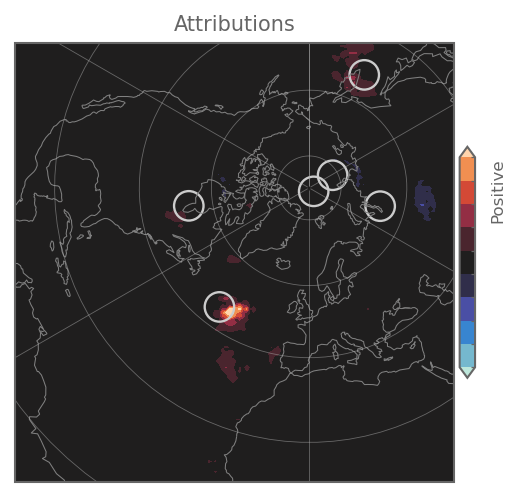

In [313]:
data = ds_attrs.sel(time_of_event='2016-08-09').attributions_lrp.sum('var_name').sel(timestep_past=-4)
data = data /data.max()
plot =data.clip(max=.9999).plot.contourf( subplot_kws=dict(projection=proj), transform=proj,  extend='both',
                   cbar_kwargs=dict(shrink=.4, aspect=15, label='Normalized features', pad=0.01),
                   size=5,
                   levels=np.arange(-.9,1,.2),
                   aspect=.9,
                     zorder=0,
                     cmap='icefire')
ax = plot.axes
# for ax in plot.axs.flat:
ax.coastlines(color='.5', lw=.5)
sns.scatterplot(daily_cycs.loc[['2016-08-05']].query('msl<100000'), x='x', y='y', transform=proj,ax=ax, color='none', s=200, edgecolor='.8')

# sns.lineplot(daily_cycs.query("track_id=='778065'"), x='x', y='y', transform=proj,ax=ax)
# sns.scatterplot(daily_cycs.loc[['2016-08-05']].query('msl<100000'), x='x', y='y', transform=proj,ax=ax, color='none')
gl = ax.gridlines(
    crs=ccrs.PlateCarree(),
    draw_labels=False,       # add tick labels
    linewidth=0.4,
    linestyle="-",
    alpha=0.5,
    zorder=2
)
ax.set_title('Attributions')
plot.colorbar.ax.set_yticks([])
plot.colorbar.ax.set_ylabel('Negative', loc='bottom')
plot.colorbar.ax.set_ylabel('Positive', loc='top')
plt.savefig('plots/plots_leadai/attributions_cyclones.pdf')

In [312]:
ds_attrs.sel(time_of_event='2016-08-09').rain

<xarray.DataArray 'rain' ()> Size: 8B
array(30.03594029)
Coordinates:
    quantile       float64 8B 0.95
    time_of_event  datetime64[ns] 8B 2016-08-09
Attributes:
    units:      mm/day
    long_name:  total_precipitation

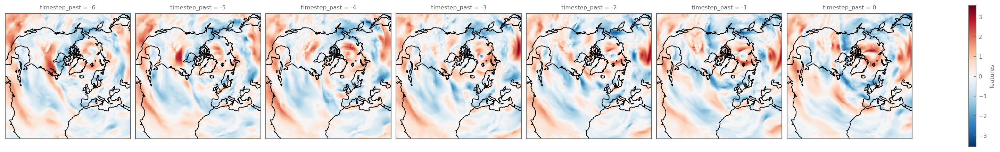

In [172]:
plot = ds_attrs.sel(time_of_event='2023-08-07').features.sel(var_name='u850').plot(col='timestep_past', subplot_kws=dict(projection=proj),transform=proj)
for ax in plot.axs.flat:
    ax.coastlines()

/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/pyproj/transformer.py:816: UserWarning: Warning: converting a masked element to nan.
  return self._transformer._transform_point(
/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/pyproj/transformer.py:816: UserWarning: Warning: converting a masked element to nan.
  return self._transformer._transform_point(
/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/pyproj/transformer.py:816: UserWarning: Warning: converting a masked element to nan.
  return self._transformer._transform_point(
/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/pyproj/transformer.py:816: UserWarning: Warning: converting a masked element to nan.
  return self._transformer._transform_point(
/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/pyproj/transformer.py:816: UserWarning: Warning: converting a masked element to nan.
  return s

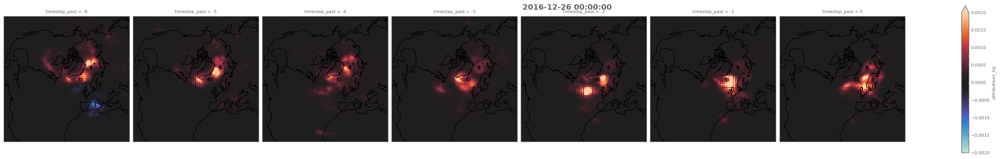

In [156]:
plot_cycs_traj(pd.to_datetime('2016-12-26'), '0', vmax=.002)

In [ ]:
time = ds_attrs.time_of_event.sel(time_of_event='1993-02-03').values

        
    #     time_ = time +(k-6)*pd.Timedelta('1D')
    #     ax.set_title(f'Timestep past D{-(6-k)}\n{time_}')
    #     important_cyclones_days = important_cyclones.sel(time_of_event=time, timestep_past=timestep_past).tracks.to_series().reset_index().dropna().tracks
    #     important_cyclones_days_tracks = daily_cycs.loc[time_].set_index('track_id').loc[important_cyclones_days]
    #     # important_cyclones_tracks_day = important_cyclones_tracks_day.query("track_id=='429939'")
    #     # sns.lineplot(important_cyclones_tracks.set_index('track_id').loc[important_cyclones_tracks_day.track_id].reset_index()
    #     #                 ,x='x', y='y', color='.8', linewidth=3, zorder=100, transform=proj,ax=ax, legend=False, sort=False)
    #     sns.scatterplot(important_cyclones_days_tracks,x='x', y='y', s=100,edgecolor='1',zorder=100, linewidth=2, transform=proj,ax=ax, legend=True,
    #                        color=None, facecolor='none')
    #     sns.lineplot(daily_cycs
    #                     ,x='x', y='y', color='.6', linewidth=1, zorder=10, transform=proj,ax=ax, legend=False, sort=False)
    #     try:
    #         sns.scatterplot(daily_cycs.set_index('track_id').loc[429939].set_index('date').loc[[time_]]
    #                        ,x='x', y='y', color='.6', linewidth=1, zorder=90, transform=proj,ax=ax, legend=False,
    #                        edgecolor='1', facecolor='.6', s=50)
    #     except:
    #         pass

In [54]:
important_cyclones_tracks.groupby('track_id').attribution2000.count()

track_id
952293    5
952316    4
952325    2
952339    1
952344    2
952378    1
952400    3
952427    2
952433    5
952441    1
952448    2
952450    3
952456    3
952483    4
952513    2
952529    3
952532    4
952535    4
952547    3
952567    5
952599    5
952602    5
952609    3
952640    4
952646    4
952663    4
952669    3
952685    2
952686    2
952711    3
952724    3
952739    2
952766    2
952792    2
952798    1
952806    1
952822    1
Name: attribution2000, dtype: int64

# Classify important cyclones

In [7]:
daily_cycs.track_id = daily_cycs.track_id.astype(int).astype(str)

In [8]:
[pd.cut(daily_cycs.x, np.arange(daily_cycs.x.min(), daily_cycs.x.max()+1,1000000))]

[date
 1979-01-01    (-5695787.172, -4695787.172]
 1979-01-01      (1304212.828, 2304212.828]
 1979-01-01      (1304212.828, 2304212.828]
 1979-01-01       (304212.828, 1304212.828]
 1979-01-01                             NaN
                           ...             
 2024-12-30    (-3695787.172, -2695787.172]
 2024-12-30       (304212.828, 1304212.828]
 2024-12-30       (304212.828, 1304212.828]
 2024-12-31       (304212.828, 1304212.828]
 2024-12-31      (2304212.828, 3304212.828]
 Name: x, Length: 290211, dtype: category
 Categories (13, interval[float64, right]): [(-8695787.172, -7695787.172] < (-7695787.172, -6695787.172] < (-6695787.172, -5695787.172] < (-5695787.172, -4695787.172] ... (304212.828, 1304212.828] < (1304212.828, 2304212.828] < (2304212.828, 3304212.828] < (3304212.828, 4304212.828]]]

In [9]:
cycs_count =(daily_cycs.groupby([pd.cut(daily_cycs.x, np.arange(-1e7,5e6+1, 1e5)), pd.cut(daily_cycs.y, np.arange(-1e7,5e6+1, 1e5))]).track_id.count()/daily_cycs.index.unique().size*365.25).reset_index()
cycs_count['x'] = [x.mid for x in cycs_count.x.values]
cycs_count['y'] = [y.mid for y in cycs_count.y.values]
cycs_count = cycs_count.set_index(['y','x']).to_xarray()

/tmp/ipykernel_828082/3126345936.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cycs_count =(daily_cycs.groupby([pd.cut(daily_cycs.x, np.arange(-1e7,5e6+1, 1e5)), pd.cut(daily_cycs.y, np.arange(-1e7,5e6+1, 1e5))]).track_id.count()/daily_cycs.index.unique().size*365.25).reset_index()


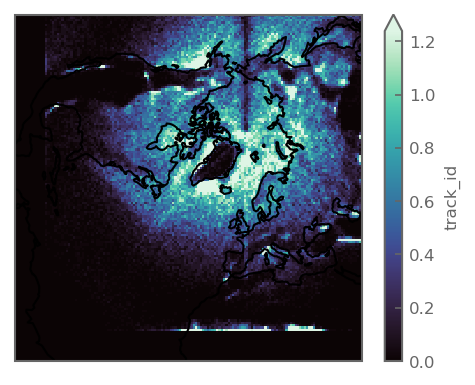

In [10]:
plot = cycs_count.track_id.plot(subplot_kws=dict(projection=proj), transform=proj, robust=True, cmap='mako')
plot.axes.coastlines()

<Axes: xlabel='x', ylabel='y'>

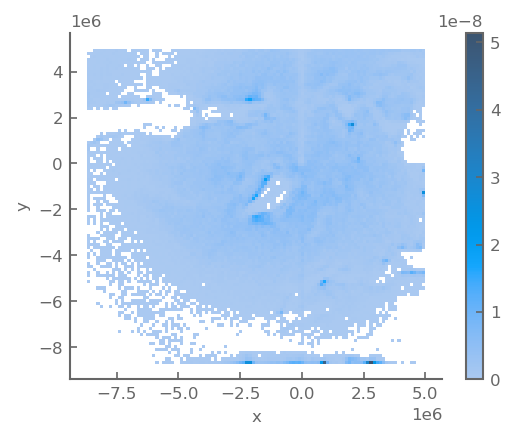

In [11]:
sns.histplot(daily_cycs, x='x', y='y', stat='frequency', cbar=True)

In [384]:
import numpy as np
import xarray as xr
import geopandas as gpd
from shapely.geometry import shape
from shapely.ops import unary_union
from rasterio.features import shapes
from rasterio.transform import Affine

def _pick_coord(da, candidates):
    for c in candidates:
        if c in da.coords:
            return c
    raise ValueError(f"Could not find any of {candidates} in DataArray coords.")

def _affine_from_1d_coords(x, y):
    """
    Build an affine transform that maps array indices to the coordinate space
    when x,y are 1D coordinates giving cell centers on a regular grid.
    """
    # mean spacing (assumes ~regular spacing)
    dx = float(np.mean(np.diff(x)))
    dy = float(np.mean(np.diff(y)))

    # if latitude is descending (common), dy will be negative; we want a transform
    # whose scale has positive dx and *negative* dy so row index increases downward
    # and y decreases.
    # Top-left corner of the [0,0] pixel (half a pixel up/left from the first centers)
    x0 = x[0] - dx / 2.0
    y0 = y[0] + dy / 2.0  # note dy could be negative

    # Build transform: translate to top-left corner, then scale
    # Scale uses dx and dy as-is; if dy is negative (lat descending), the sign encodes that.
    return Affine.translation(x0, y0) * Affine.scale(dx, dy)

def mask_to_gdf(mask_da, assume_crs="EPSG:4326", dissolve=True, simplify=None):
    """
    Convert a boolean xarray.DataArray mask on a regular grid to a GeoDataFrame of polygons.
    
    Parameters
    ----------
    mask_da : xr.DataArray (boolean)
        Dimensions must include either (lat, lon) or (y, x) with 1D coords.
    assume_crs : str or None
        CRS to use if none is found on the DataArray (default EPSG:4326).
    dissolve : bool
        If True, merges touching/overlapping polygons into multipart regions.
    simplify : float or None
        If set, applies shapely .simplify(tolerance) in the mask’s CRS units.
    """
    if mask_da.dtype != bool:
        raise ValueError("mask_da must be boolean (True for inside).")

    # Identify coord names
    y_name = _pick_coord(mask_da, ["lat", "latitude", "y"])
    x_name = _pick_coord(mask_da, ["lon", "longitude", "x"])
    y = mask_da[y_name].values
    x = mask_da[x_name].values
    if y.ndim != 1 or x.ndim != 1:
        raise ValueError("This method requires 1D regular coords for x and y.")

    # Build affine
    transform = _affine_from_1d_coords(x, y)

    # Rasterio wants 0/1 integers and an optional mask
    img = mask_da.astype(np.uint8).values
    shps = shapes(img, mask=img == 1, transform=transform)

    geoms = [shape(geom) for geom, val in shps if val == 1]

    if not geoms:
        return gpd.GeoDataFrame(geometry=[], crs=assume_crs)

    gdf = gpd.GeoDataFrame(geometry=geoms, crs=getattr(getattr(mask_da, "rio", None), "crs", None) or assume_crs)

    # Clean geometry (fix slivers) and optionally dissolve/simplify
    gdf["geometry"] = gdf.buffer(0)

    if dissolve:
        merged = unary_union(gdf.geometry)
        gdf = gpd.GeoDataFrame(geometry=[merged], crs=gdf.crs).explode(index_parts=False).reset_index(drop=True)

    if simplify:
        gdf["geometry"] = gdf.geometry.simplify(simplify, preserve_topology=True)

    # Drop empty/invalid geometries
    gdf = gdf[~gdf.geometry.is_empty & gdf.geometry.is_valid].reset_index(drop=True)
    return gdf

regions_mask = xr.open_dataset('/home/rogui7909/code/predict_rain_norway/RECCAP2_region_masks_all.nc')
# change 0-380 to -180 180
regions_mask = regions_mask.assign_coords(lon=(((regions_mask.lon + 180) % 360) - 180)).sortby('lon')
regions_mask = regions_mask.where(regions_mask>0).sel(lat=slice(-10,90))


In [479]:
colors = sns.color_palette('Blues_r', n_colors=2)[:2] +sns.color_palette('Greens_r',n_colors=3)[:3]+ sns.color_palette('Oranges_r',)[1:2]+sns.color_palette('Purples_r')[1:2]

sns.color_palette(colors)
colors = sns.color_palette(sns.color_palette('rocket_r', n_colors=6)[:3] +sns.color_palette('mako_r', n_colors=7)[3:] )
colors

[(0.96516917, 0.70776351, 0.5606593),
 (0.95381595, 0.46373781, 0.31769923),
 (0.8833417, 0.19830556, 0.26014181),
 (0.20722876, 0.47763224, 0.63711608),
 (0.2348113, 0.33173196, 0.59518282),
 (0.24286214, 0.20345642, 0.4128484),
 (0.16579435, 0.10520905, 0.19960847)]

In [483]:
from shapely.ops import unary_union

# gdf_atl = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon<-100), dissolve=False)
gdf_pac_arctic = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where(((regions_mask.lon<-100)|(regions_mask.lon>100))&(regions_mask.lat>66))==1, dissolve=False)
# gdf_pac_NA = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon<-100)&(regions_mask.lat<=66))==1, dissolve=False)
# gdf_pac_asia = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>100)&(regions_mask.lat<=66))==1, dissolve=False)
gdf_pac_oce = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where(((regions_mask.lon<-100)|(regions_mask.lon>100))&(regions_mask.lat<=66))==1, dissolve=False)

gdf_NatlEcont = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>-40)&(regions_mask.lon<20)&(regions_mask.lat>30))==1, dissolve=False)
gdf_NatlWcont = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>-100)&(regions_mask.lon<-40)&(regions_mask.lat>30))==1, dissolve=False)
gdf_tropatl = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>-100)&(regions_mask.lon<20)&(regions_mask.lat<30))==1, dissolve=False)
gdf_eurasia_cont = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>20)&(regions_mask.lon<100)&(regions_mask.lat<=66))==1, dissolve=False)
gdf_eurasia_oce = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>20)&(regions_mask.lon<100)&(regions_mask.lat>66))==1, dissolve=False)

# colors = sns.color_palette('Blues_r')[:5] + sns.color_palette('Oranges_r')[:2]+ sns.color_palette('Purples_r')[:3]+sns.color_palette('Greens_r')[:2]
colors = sns.color_palette('Greens_r',n_colors=3)[:3]+ sns.color_palette('Blues_r', n_colors=2)[:2] +sns.color_palette('Oranges_r',)[1:2]+sns.color_palette('Purples_r')[1:2]
colors = sns.color_palette('magma', n_colors=7)
colors = sns.color_palette(sns.color_palette('rocket_r', n_colors=6)[:3] +sns.color_palette('mako_r', n_colors=7)[3:] )

polygons_masks = gpd.GeoDataFrame(geometry=[
                                            unary_union(gdf_tropatl.geometry),
                                            unary_union(gdf_NatlWcont.geometry),
                                            unary_union(gdf_NatlEcont.geometry),
                                            unary_union(gdf_eurasia_oce.geometry),
                                            unary_union(gdf_pac_arctic.geometry),
                                            unary_union(gdf_eurasia_cont.geometry),
                                            unary_union(gdf_pac_oce.geometry),
                                #  unary_union(gdf_atl_midlat.geometry),
                                #  unary_union(gdf_atl_trop.geometry),
                                #  unary_union(gdf_pac.geometry),
                                #  unary_union(gdf_arctic.geometry),
                                #  unary_union(gdf_med.geometry),
                                #  unary_union(gdf_land_NA.geometry),
                                #  unary_union(gdf_land_eurasia.geometry),
                                #  unary_union(gdf_land_trop),
                                 
                                 
                                 ], crs=gdf_pac_arctic.crs,
                                 index = [
                                          'Atlantic Tropical', 
                                           'Atlantic North W', 
                                          'Atlantic North E',
                                          'Arctic Eurasia',
                                          'Arctic Pacific',
                                          'Eurasia', 
                                          'Pacific'
                                        
                                        ])
polygons_masks.index = polygons_masks.index.rename('poly_id')
polygons_masks['colors'] = colors
# polygons_masks = polygons_masks.sort_index()
# polygons_masks = polygons_masks.loc[['Pacific','North Atlantic W','North Atlantic E', 'Tropical Atlantic', 'Continental Eurasia'
#                 #                      'Atlantic Midlat','Atlantic North',  'Atlantic Tropics', 
#                 #    'Continents Eurasia', 'Continents North America',
#                 #    'Continents Tropics', 'Mediterranean Sea', 'Pacific',
#                    ]]



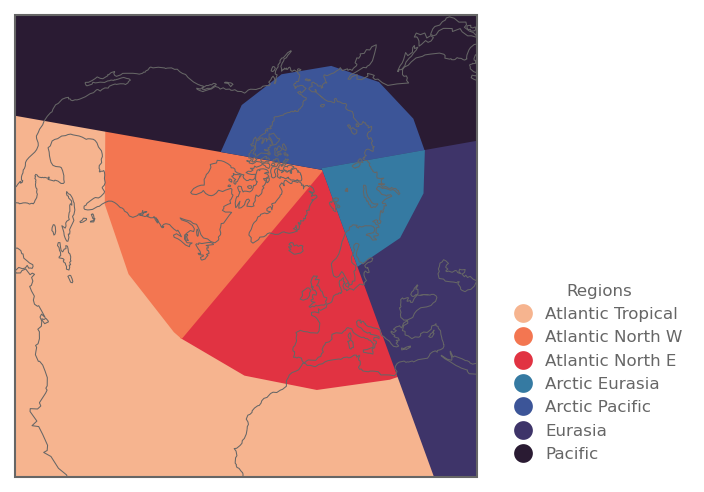

In [485]:
import matplotlib.patches as mpatches



fig, ax = plt.subplots(figsize=(6,4), subplot_kw=dict(projection=ccrs.NorthPolarStereo(0, 70)))

# polygons_masks.plot(edgecolor="k", color=colors, transform=ccrs.PlateCarree(), ax=ax, legend=True)
ax.set_extent((-1e7, 5e6,-1e7,5e6), crs=proj)
ax.coastlines(lw=.5, color='.4')
# polygons_masks['domain'] = polygons_masks.reset_index().poly_id.str.split(' ', expand=True).iloc[:,0].values
# polygons_masks['colors'] = colors


ax.add_patch(mpatches.Rectangle((-100,-20), 160, 90, transform=ccrs.PlateCarree(),color=polygons_masks.loc['Atlantic Tropical'].colors))
ax.add_patch(mpatches.Rectangle((-40,30), 60, 90, transform=ccrs.PlateCarree(),color=polygons_masks.loc['Atlantic North E'].colors))
ax.add_patch(mpatches.Rectangle((-100,30), 60, 90, transform=ccrs.PlateCarree(),color=polygons_masks.loc['Atlantic North W'].colors))
ax.add_patch(mpatches.Rectangle((-100,0), -160, 90, transform=ccrs.PlateCarree(),color=polygons_masks.loc['Pacific'].colors))
ax.add_patch(mpatches.Rectangle((-100,60), -160, 90, transform=ccrs.PlateCarree(),color=polygons_masks.loc['Arctic Pacific'].colors))
ax.add_patch(mpatches.Rectangle((20,0), 80, 90, transform=ccrs.PlateCarree(),color=polygons_masks.loc['Eurasia'].colors))
ax.add_patch(mpatches.Rectangle((20,60), 80, 30, transform=ccrs.PlateCarree(),color=polygons_masks.loc['Arctic Eurasia'].colors))
# ax.add_patch(mpatches.Rectangle((-100,30), 60, 90, transform=ccrs.PlateCarree(),color=polygons_masks.loc['Atlantic North E'].colors))
handles = []
for poly_id, row in polygons_masks.iterrows():
    handles.append(plt.Line2D([0], [0], marker='o', color='w', label=poly_id,
                          markerfacecolor=row.colors, markersize=10))
ax.legend(handles=handles, title='Regions', loc='lower left', bbox_to_anchor=(1.05, 0))
# ax.legend()
plt.savefig('plots/plots_leadai/regions_cycs.pdf')

In [488]:
df_important = important_cyclones[['tracks','attributions2000','important']].to_dataframe().reset_index().dropna()
df_important['time_of_cyclone'] = df_important.time_of_event + pd.Timedelta('1D')*df_important.timestep_past
df_important['day_id'] = df_important.time_of_cyclone.dt.strftime('%Y-%m-%d') + ' '+df_important.tracks
daily_cycs['day_id'] = daily_cycs.index.strftime('%Y-%m-%d') + ' '+daily_cycs.track_id
df_important[['msl','lon','lat','x','y']] = daily_cycs.set_index('day_id').loc[df_important.day_id.values][['msl','lon','lat','x','y']].values
# daily_cycs

In [489]:
cyclones_gdf = gpd.GeoDataFrame(
    df_important.reset_index(),
    geometry=gpd.points_from_xy(df_important["lon"], df_important["lat"]),
    crs="EPSG:4326"  # adjust if your cyclones are in another CRS
)

if polygons_masks.crs is None:
    polygons_masks = polygons_masks.set_crs("EPSG:4326")  # if appropriate
cyclones_gdf = cyclones_gdf.to_crs(polygons_masks.crs)

joined = gpd.sjoin(cyclones_gdf, polygons_masks.reset_index()[["poly_id", "geometry"]],
                   how="left", predicate="within") 
unmatched = joined[joined["poly_id"].isna()].drop(columns=["index_right"])

if not unmatched.empty:
    # Optional: project to a metric CRS for meaningful distances (meters)
    # Example for Norway: EPSG:5972 (ETRS89 / TM35FIN(N,E)) or choose a local UTM zone
    metric_crs = "EPSG:3857"
    polygons_m = polygons_masks.to_crs(metric_crs).reset_index()
    unmatched_m = unmatched.to_crs(metric_crs)

    nearest = gpd.sjoin_nearest(
        unmatched_m,
        polygons_m[["poly_id", "geometry"]],
        how="left",
        distance_col="dist_m"  # distance in CRS units
    ).to_crs(polygons_masks.crs)

    # Optionally filter by a maximum distance (e.g., 50 km)
    max_dist_m = 50_000
    nearest.loc[nearest["dist_m"] > max_dist_m, "poly_id"] = None

    # merge back
    joined.loc[unmatched.index, ["poly_id"]] = nearest.set_index(unmatched.index)["poly_id"]
# joined['day'] = pd.to_datetime(joined.day)
joined['domain'] = joined.poly_id.str.split(' ', expand=True).iloc[:,0].values
joined.poly_id = pd.Categorical(joined.poly_id, 
                      categories=polygons_masks.index.tolist(),
                      ordered=True)

joined = joined.sort_values('poly_id')

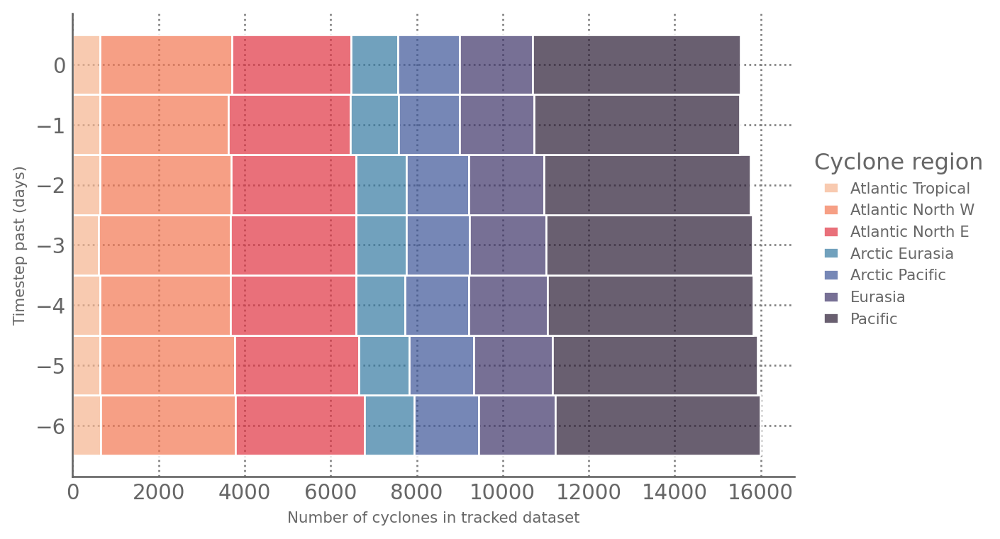

In [490]:

colors = sns.color_palette('Blues_r')[:2] +sns.color_palette('Greens_r')[:3]+ sns.color_palette('Oranges_r')[1:2]+sns.color_palette('Purples_r')[:3]

(so.Plot(joined, color='poly_id',y='timestep_past')
 .add(so.Bars(), so.Count(), so.Stack(), orientation='y')
 .scale(color=polygons_masks.colors.to_dict())
#  .facet(col='timestep_past')

.layout(size=(6,4))
.label(y='Timestep past (days)', x='Number of cyclones in tracked dataset', color='Cyclone region')
 .theme(plt.style.library["robin"])
 .theme({'axes.grid':True, 'grid.color':'.5'})
)

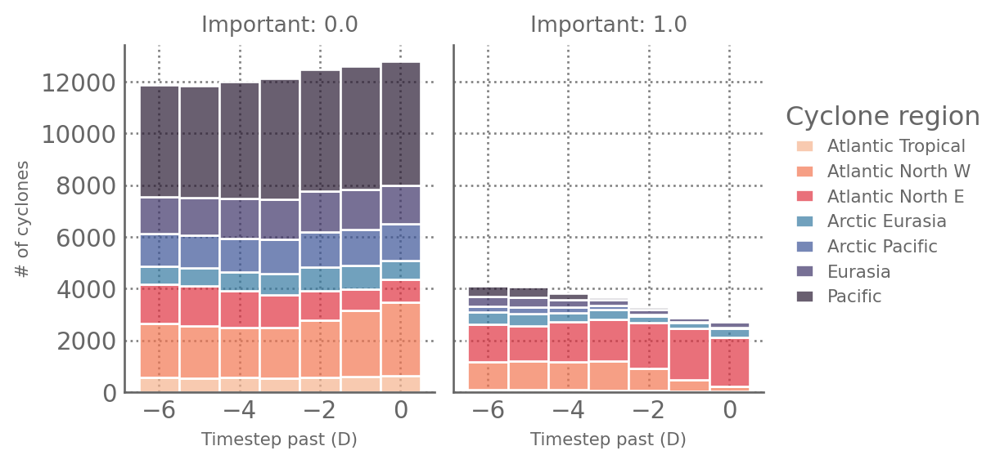

In [491]:
(so.Plot(joined.sort_values('poly_id'), x='timestep_past', color='poly_id')
        .add(so.Bars(), so.Count(),so.Stack(), orientation='y')
        .facet(col='important')
         .scale(color=so.Nominal(polygons_masks.colors.to_dict()),
        )
        .layout(size=(5,3))
        .theme(plt.style.library["robin"])
        .theme({'axes.grid':True, 'grid.color':'.5'})
        .label(col='Important:', y='# of cyclones', x='Timestep past (D)', color='Cyclone region')
 
 )

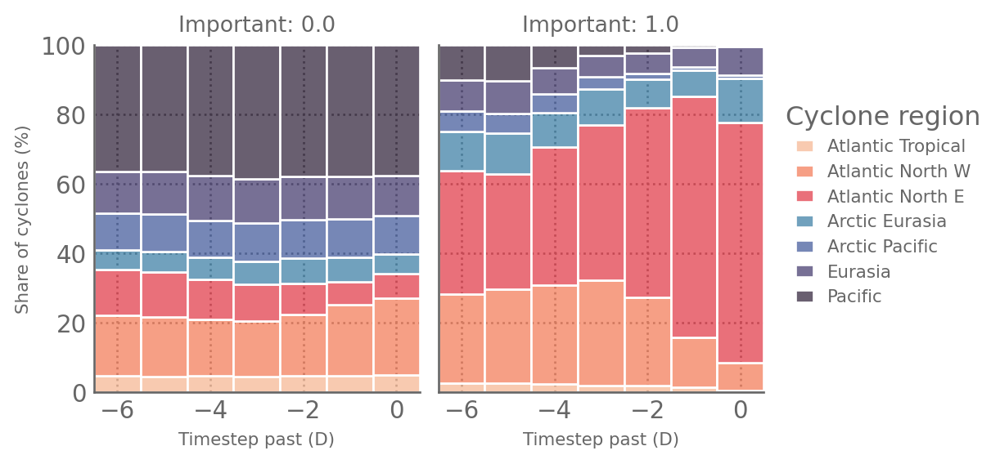

In [492]:
(so.Plot(joined.sort_values('poly_id'), x='timestep_past', color='poly_id')
        .add(so.Bars(), so.Count(),so.Norm(func="sum", by=["x"],percent=True),so.Stack(), orientation='y')
        .facet(col='important')
         .scale(color=so.Nominal(polygons_masks.colors.to_dict())
        )
        .layout(size=(5,3))
        .theme(plt.style.library["robin"])
        .theme({'axes.grid':True, 'grid.color':'.5'})
        .label(col='Important:', y='Share of cyclones (%)', x='Timestep past (D)', color='Cyclone region')
        .limit(x=(-6.5,.5), y=(0,100))
 )
 

In [493]:
df_ = (joined.groupby(['timestep_past','poly_id',]).count())
df_total = df_.x.rename('metric').reset_index()
df_total['data_type'] = 'Total # of cyclones'
df_total_sum = df_total.groupby(['timestep_past']).metric.sum().reset_index()
df_total_sum['poly_id'] = 'All cyclones'
df_total_sum['data_type'] = df_total.data_type
df_total_sum

df_ = (joined.groupby(['timestep_past','poly_id','important']).count())
df_important = df_.x.rename('metric').reset_index().query("important==1").reset_index().iloc[:,1:]
df_important['data_type'] = '# of important cyclones'
df_important_sum = df_important.groupby(['timestep_past']).metric.sum().reset_index()
df_important_sum['poly_id'] = 'All cyclones'
df_important_sum['data_type'] = df_important.data_type

# df_important_sum

df_important_sum

/tmp/ipykernel_3009949/2219067060.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = (joined.groupby(['timestep_past','poly_id',]).count())
/tmp/ipykernel_3009949/2219067060.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = (joined.groupby(['timestep_past','poly_id','important']).count())


,timestep_past,metric,poly_id,data_type
0,-6,4099,All cyclones,# of important cyclones
1,-5,4071,All cyclones,# of important cyclones
2,-4,3820,All cyclones,# of important cyclones
3,-3,3671,All cyclones,# of important cyclones
4,-2,3274,All cyclones,# of important cyclones
5,-1,2896,All cyclones,# of important cyclones
6,0,2738,All cyclones,# of important cyclones


In [494]:
joined

,index,time_of_event,timestep_past,n_cyclone,tracks,attributions2000,important,quantile,var_name,time_of_cyclone,day_id,msl,lon,lat,x,y,geometry,index_right,poly_id,domain
34038,57093,1993-03-19,-4,1,290270,0.025019,0.0,0.95,u850,1993-03-15,1993-03-15 290270,100646.649257,-12.862452,18.682489,-1.973633e+06,-8.643359e+06,POINT (-12.86245 18.68249),0,Atlantic Tropical,Atlantic
45810,76477,1998-12-18,-5,9,408141,0.019257,0.0,0.95,u850,1998-12-13,1998-12-13 408141,101757.501931,-3.089997,19.948583,-4.669123e+05,-8.649252e+06,POINT (-3.09 19.94858),0,Atlantic Tropical,Atlantic
76739,126832,2012-09-04,-6,20,694700,0.016558,0.0,0.95,u850,2012-08-29,2012-08-29 694700,100560.172317,17.869023,17.403711,2.784627e+06,-8.637334e+06,POINT (17.86902 17.40371),0,Atlantic Tropical,Atlantic
66272,109773,2008-02-22,-6,13,599557,-0.218565,0.0,0.95,u850,2008-02-16,2008-02-16 599557,99715.842235,-27.457401,30.128243,-3.285019e+06,-6.321934e+06,POINT (-27.4574 30.12824),0,Atlantic Tropical,Atlantic
100995,166337,2021-02-24,-2,17,875000,-0.000268,0.0,0.95,u850,2021-02-22,2021-02-22 875000,101383.874464,-15.228408,18.079902,-2.354561e+06,-8.649271e+06,POINT (-15.22841 18.0799),0,Atlantic Tropical,Atlantic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86483,142885,2015-12-24,-6,1,764776,0.019416,0.0,0.95,u850,2015-12-18,2015-12-18 764776,101384.912964,126.461805,66.475424,2.077644e+06,1.535234e+06,POINT (126.46181 66.47542),6,Pacific,Pacific
86484,142886,2015-12-24,-6,2,764750,0.011786,0.0,0.95,u850,2015-12-18,2015-12-18 764750,94194.146369,175.776371,57.191593,2.688595e+05,3.640614e+06,POINT (175.77637 57.19159),6,Pacific,Pacific
22627,37691,1989-02-06,-4,3,205972,-0.038265,0.0,0.95,u850,1989-02-02,1989-02-02 205972,96718.618971,169.270581,48.689627,8.697375e+05,4.590036e+06,POINT (169.27058 48.68963),6,Pacific,Pacific
13182,22098,1984-08-30,-1,6,115811,-0.064850,0.0,0.95,u850,1984-08-29,1984-08-29 115811,100779.087279,129.363231,53.096356,3.197926e+06,2.623371e+06,POINT (129.36323 53.09636),6,Pacific,Pacific


/tmp/ipykernel_3009949/1161854081.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = (joined.groupby(['timestep_past','poly_id',]).count())
/tmp/ipykernel_3009949/1161854081.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = (joined.groupby(['timestep_past','poly_id','important']).count())
/tmp/ipykernel_3009949/1161854081.py:17: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = (joined.groupby(['timestep

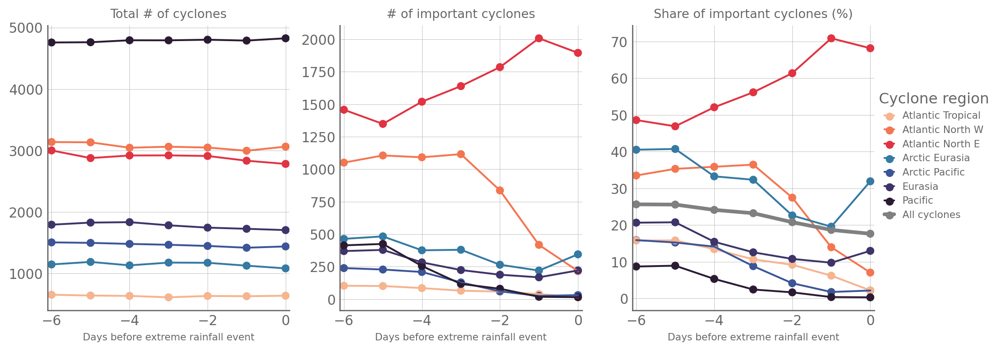

In [495]:
df_ = (joined.groupby(['timestep_past','poly_id',]).count())
df_total = df_.x.rename('metric').reset_index()
df_total['data_type'] = 'Total # of cyclones'
df_total_sum = df_total.groupby(['timestep_past']).metric.sum().reset_index()
df_total_sum['poly_id'] = 'All cyclones'
df_total_sum['data_type'] = df_total.data_type
# df_total = pd.concat([df_total, df_total_sum])

df_ = (joined.groupby(['timestep_past','poly_id','important']).count())
df_important = df_.x.rename('metric').reset_index().query("important==1").reset_index().iloc[:,1:]
df_important['data_type'] = '# of important cyclones'
df_important_sum = df_important.groupby(['timestep_past']).metric.sum().reset_index()
df_important_sum['poly_id'] = 'All cyclones'
df_important_sum['data_type'] = df_important.data_type
# df_important = pd.concat([df_important, df_important_sum])

df_ = (joined.groupby(['timestep_past','poly_id','important']).count()/joined.groupby(['timestep_past','poly_id',]).count())*100
df_proba = df_.x.rename('metric').reset_index().query("important==1").reset_index().iloc[:,1:]
df_proba['data_type'] = 'Share of important cyclones (%)'
df_proba_mean = (100*df_important_sum.set_index(['poly_id','timestep_past']).metric/df_total_sum.set_index(['poly_id','timestep_past']).metric).reset_index()
df_proba_mean['data_type'] = 'Share of important cyclones (%)'
df_proba = pd.concat([df_proba, df_proba_mean])

df_ = pd.concat([df_total,  df_important, df_proba ], axis=0).iloc[:,:-1]
df_=df_.set_index(['timestep_past','poly_id']).reset_index()



colors_dict = polygons_masks.colors.to_dict()
colors_dict.update({'All cyclones':'.5'})
(so.Plot(df_,x='timestep_past', y='metric', color='poly_id', linewidth='poly_id')
        .add(so.Line())
        .add(so.Dot())
        .theme(plt.style.library["robin"])
        .facet(col='data_type')
        .theme({'axes.grid':True, 'grid.color':'.7', 'grid.linestyle':'-', 'grid.linewidth':.3})
        .limit(x=(-6.1,0.1))
        .share(y=False)
        .label(color='Cyclone region', x='Days before extreme rainfall event', y='')
        .scale(color=so.Nominal(colors_dict),
               linewidth=[1.5,1.5,1.5,1.5,1.5,1.5,1.5,3],
            )
        .layout(size=(10,4))
)

# df_ = (joined.groupby(['timestep_past','poly_id',]).count())
# df_ = df_.x.rename('# of important cyclones').reset_index()
# (so.Plot(df_,x='timestep_past', y='# of important cyclones', color='poly_id', )
#     .add(so.Line(marker='o'))
#      .theme(plt.style.library["robin"])
#     .theme({'axes.grid':True, 'grid.color':'.7', 'grid.linestyle':'-', 'grid.linewidth':.3})
#     .limit(x=(-6.1,0.1))
#     .label(color='Cyclone region', x='Timestep in the past (days)')
#     .scale(color=so.Nominal(polygons_masks.colors.to_dict(),),
#         )
#     .layout(size=(4,4))
# )

/tmp/ipykernel_3009949/718764457.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = (joined.groupby(['timestep_past','poly_id',]).count())
/tmp/ipykernel_3009949/718764457.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = (joined.query("attributions2000>0.3").groupby(['timestep_past','poly_id','important']).count())
/tmp/ipykernel_3009949/718764457.py:17: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ =

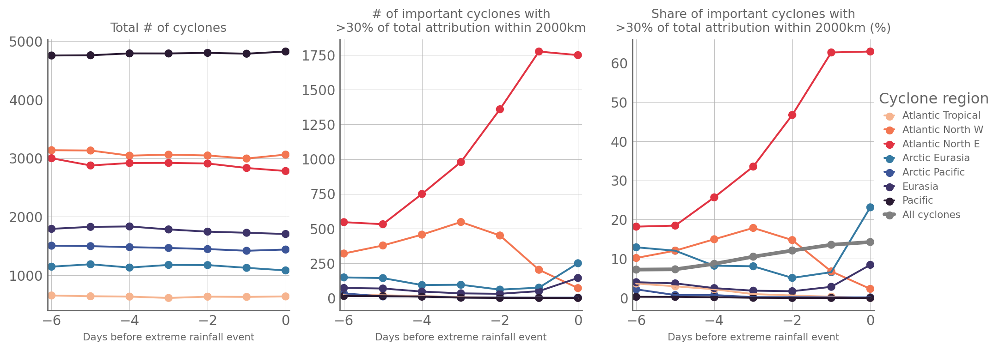

In [496]:
df_ = (joined.groupby(['timestep_past','poly_id',]).count())
df_total = df_.x.rename('metric').reset_index()
df_total['data_type'] = 'Total # of cyclones'
df_total_sum = df_total.groupby(['timestep_past']).metric.sum().reset_index()
df_total_sum['poly_id'] = 'All cyclones'
df_total_sum['data_type'] = df_total.data_type
# df_total = pd.concat([df_total, df_total_sum])

df_ = (joined.query("attributions2000>0.3").groupby(['timestep_past','poly_id','important']).count())
df_important = df_.x.rename('metric').reset_index().query("important==1").reset_index().iloc[:,1:]
df_important['data_type'] = '# of important cyclones with\n>30% of total attribution within 2000km'
df_important_sum = df_important.groupby(['timestep_past']).metric.sum().reset_index()
df_important_sum['poly_id'] = 'All cyclones'
df_important_sum['data_type'] = df_important.data_type
# df_important = pd.concat([df_important, df_important_sum])

df_ = (joined.query("attributions2000>0.3").groupby(['timestep_past','poly_id','important']).count()/joined.groupby(['timestep_past','poly_id',]).count())*100
df_proba = df_.x.rename('metric').reset_index().query("important==1").reset_index().iloc[:,1:]
df_proba['data_type'] = 'Share of important cyclones with\n>30% of total attribution within 2000km (%)'
df_proba_mean = (100*df_important_sum.set_index(['poly_id','timestep_past']).metric/df_total_sum.set_index(['poly_id','timestep_past']).metric).reset_index()
df_proba_mean['data_type'] = 'Share of important cyclones with\n>30% of total attribution within 2000km (%)'
df_proba = pd.concat([df_proba, df_proba_mean])

df_ = pd.concat([df_total,  df_important, df_proba ], axis=0).iloc[:,:-1]
df_=df_.set_index(['timestep_past','poly_id']).reset_index()



colors_dict = polygons_masks.colors.to_dict()
colors_dict.update({'All cyclones':'.5'})
(so.Plot(df_,x='timestep_past', y='metric', color='poly_id', linewidth='poly_id')
        .add(so.Line())
        .add(so.Dot())
        .theme(plt.style.library["robin"])
        .facet(col='data_type')
        .theme({'axes.grid':True, 'grid.color':'.7', 'grid.linestyle':'-', 'grid.linewidth':.3})
        .limit(x=(-6.1,0.1))
        .share(y=False)
        .label(color='Cyclone region', x='Days before extreme rainfall event', y='')
        .scale(color=so.Nominal(colors_dict),
               linewidth=[1.5,1.5,1.5,1.5,1.5,1.5,1.5,3],
            )
        .layout(size=(10,4))
)

# df_ = (joined.groupby(['timestep_past','poly_id',]).count())
# df_ = df_.x.rename('# of important cyclones').reset_index()
# (so.Plot(df_,x='timestep_past', y='# of important cyclones', color='poly_id', )
#     .add(so.Line(marker='o'))
#      .theme(plt.style.library["robin"])
#     .theme({'axes.grid':True, 'grid.color':'.7', 'grid.linestyle':'-', 'grid.linewidth':.3})
#     .limit(x=(-6.1,0.1))
#     .label(color='Cyclone region', x='Timestep in the past (days)')
#     .scale(color=so.Nominal(polygons_masks.colors.to_dict(),),
#         )
#     .layout(size=(4,4))
# )
# plt.suptitle()

In [550]:
df_ = (joined.groupby(['timestep_past','poly_id',]).count())
df_total = df_.x.rename('metric').reset_index()
df_total['data_type'] = 'Total # of cyclones'
df_total_sum = df_total.groupby(['timestep_past']).metric.sum().reset_index()
df_total_sum['poly_id'] = 'All cyclones'
df_total_sum['data_type'] = df_total.data_type
# df_total = pd.concat([df_total, df_total_sum])

df_ = (joined.query("attributions2000>0.3").groupby(['timestep_past','poly_id','important']).count())
df_important = df_.x.rename('metric').reset_index().query("important==1").reset_index().iloc[:,1:]
df_important['data_type'] = '# of important cyclones with\n>30% of total attribution within 2000km'
df_important_sum = df_important.groupby(['timestep_past']).metric.sum().reset_index()
df_important_sum['poly_id'] = 'All cyclones'
df_important_sum['data_type'] = df_important.data_type
# df_important = pd.concat([df_important, df_important_sum])

df_ = (joined.query("attributions2000>0.3").groupby(['timestep_past','poly_id','important']).count()/joined.groupby(['timestep_past','poly_id',]).count())*100
df_proba = df_.x.rename('metric').reset_index().query("important==1").reset_index().iloc[:,1:]
df_proba['data_type'] = 'Share of important cyclones with\n>30% of total attribution within 2000km (%)'
df_proba_mean = (100*df_important_sum.set_index(['poly_id','timestep_past']).metric/df_total_sum.set_index(['poly_id','timestep_past']).metric).reset_index()
df_proba_mean['data_type'] = 'Share of important cyclones with\n>30% of total attribution within 2000km (%)'
df_proba = pd.concat([df_proba, df_proba_mean])

df_ = pd.concat([df_total,  df_important, df_proba ], axis=0).iloc[:,:-1]
df_=df_.set_index(['timestep_past','poly_id']).reset_index()
df_['poly_id_split'] = df_.poly_id.str.split(' ', expand=True).iloc[:,0] + '\n' +  df_.poly_id.str.split(' ', expand=True).iloc[:,1:].fillna('').apply(' '.join, axis=1)


colors_dict = polygons_masks.colors.to_dict()
colors_dict.update({'All cyclones':'.5'})
(so.Plot(df_,x='timestep_past', y='metric', color='poly_id', linewidth='poly_id')
        .add(so.Line())
        .add(so.Dot())
        .theme(plt.style.library["robin"])
        .facet(col='data_type')
        .theme({'axes.grid':True, 'grid.color':'.7', 'grid.linestyle':'-', 'grid.linewidth':.3})
        .limit(x=(-6.1,.1))
        .share(y=False)
        .label(color='Cyclone region', x='Days before extreme rainfall event', y='')
        .scale(color=so.Nominal(colors_dict),
               linewidth=[1.5,1.5,1.5,1.5,1.5,1.5,1.5,3],
            )
        .layout(size=(10,4))
        # .add(so.Text(halign='left'), text='poly_id_split', data=df_.query("(timestep_past==0)"),)
)

# df_ = (joined.groupby(['timestep_past','poly_id',]).count())
# df_ = df_.x.rename('# of important cyclones').reset_index()
# (so.Plot(df_,x='timestep_past', y='# of important cyclones', color='poly_id', )
#     .add(so.Line(marker='o'))
#      .theme(plt.style.library["robin"])
#     .theme({'axes.grid':True, 'grid.color':'.7', 'grid.linestyle':'-', 'grid.linewidth':.3})
#     .limit(x=(-6.1,0.1))
#     .label(color='Cyclone region', x='Timestep in the past (days)')
#     .scale(color=so.Nominal(polygons_masks.colors.to_dict(),),
#         )
#     .layout(size=(4,4))
# )
# plt.suptitle()
plt.savefig('plots/plots_leadai/important_cyclones_detection.pdf')

/tmp/ipykernel_3009949/1416892139.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = (joined.groupby(['timestep_past','poly_id',]).count())
/tmp/ipykernel_3009949/1416892139.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = (joined.query("attributions2000>0.3").groupby(['timestep_past','poly_id','important']).count())
/tmp/ipykernel_3009949/1416892139.py:17: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df

<Figure size 600x450 with 0 Axes>

0      Atlantic\nTropical 
1        Atlantic\nNorth W
2        Atlantic\nNorth E
3         Arctic\nEurasia 
4         Arctic\nPacific 
              ...         
149         All\ncyclones 
150         All\ncyclones 
151         All\ncyclones 
152         All\ncyclones 
153         All\ncyclones 
Length: 154, dtype: object

0      Tropical 
1        North W
2        North E
3       Eurasia 
4       Pacific 
         ...    
149    cyclones 
150    cyclones 
151    cyclones 
152    cyclones 
153    cyclones 
Length: 154, dtype: object

In [511]:
df_proba.set_index(['timestep_past','poly_id']).query("(timestep_past==0)")

important     metric  \
timestep_past poly_id                                   
0             Arctic Eurasia           1.0  23.126735   
              Arctic Pacific           1.0   0.139082   
              Atlantic North E         1.0  62.891046   
              Atlantic North W         1.0   2.318746   
              Atlantic Tropical        1.0   0.000000   
              Eurasia                  1.0   8.450704   
              Pacific                  1.0   0.000000   
              All cyclones             NaN  14.271913   

                                                                         data_type  
timestep_past poly_id                                                               
0             Arctic Eurasia     Share of important cyclones with\n>30% of tota...  
              Arctic Pacific     Share of important cyclones with\n>30% of tota...  
              Atlantic North E   Share of important cyclones with\n>30% of tota...  
              Atlantic North W   Share of important cyclones with\n>30% of tota...  
              Atlantic Tropical  Share of important cyclones with\n>30% of tota...  
              Eurasia            Share of important cyclones with\n>30% of tota...  
              Pacific            Share of important cyclones with\n>30% of tota...  
              All cyclones       Share of important cyclones with\n>30% of tota...

In [506]:
df_.data_type.values[-1]

'Share of important cyclones with\n>30% of total attribution within 2000km (%)'

/tmp/ipykernel_828082/1916610143.py:17: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = (joined.loc[joined.groupby(['time_of_event','timestep_past']).attributions2000.idxmax().values].groupby(['timestep_past','poly_id']).count())
/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/seaborn/_core/properties.py:130: UserWarning: The linewidth list has more values (8) than needed (7), which may not be intended.
  warnings.warn(message, UserWarning)


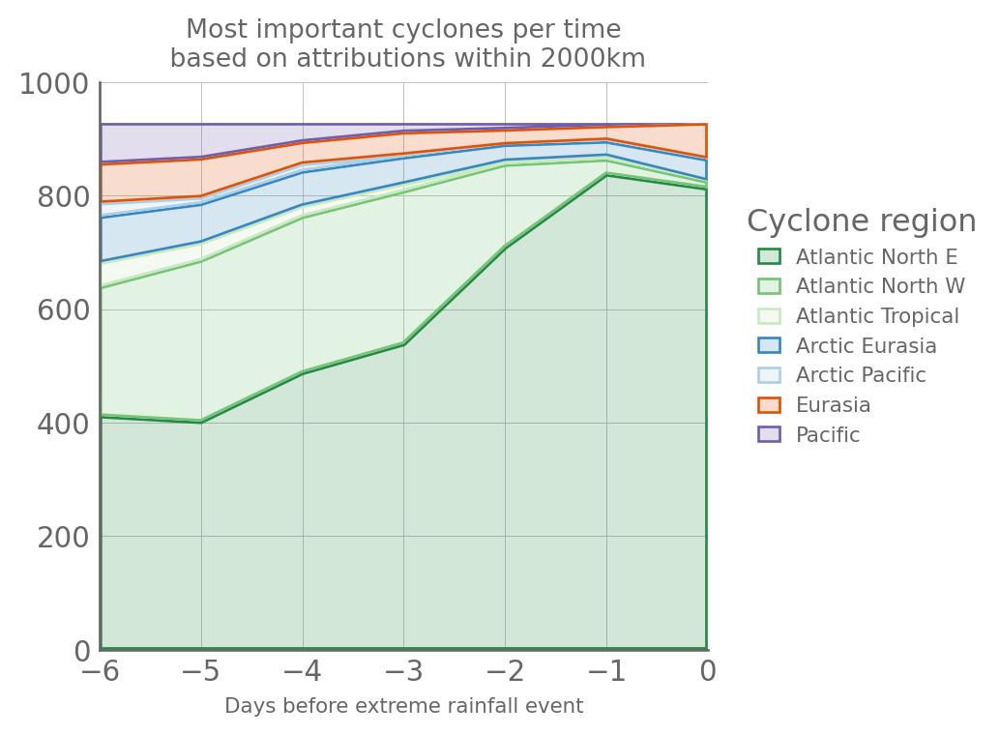

In [66]:
# df_ = (joined.groupby(['timestep_past','poly_id',]).count())
# df_total = df_.x.rename('metric').reset_index()
# df_total['data_type'] = 'Total # of cyclones'
# df_total_sum = df_total.groupby(['timestep_past']).metric.sum().reset_index()
# df_total_sum['poly_id'] = 'All cyclones'
# df_total_sum['data_type'] = df_total.data_type
# # df_total = pd.concat([df_total, df_total_sum])

# df_ = (joined.loc[joined.groupby(['time_of_event','timestep_past']).attributions2000.idxmax().values].groupby(['timestep_past','poly_id','important']).count())
# df_important = df_.x.rename('metric').reset_index().query("important==1").reset_index().iloc[:,1:]
# df_important['data_type'] = '# of important cyclones with\n>30% of total attribution within 2000km'
# df_important_sum = df_important.groupby(['timestep_past']).metric.sum().reset_index()
# df_important_sum['poly_id'] = 'All cyclones'
# df_important_sum['data_type'] = df_important.data_type
# # df_important = pd.concat([df_important, df_important_sum])

df_ = (joined.loc[joined.groupby(['time_of_event','timestep_past']).attributions2000.idxmax().values].groupby(['timestep_past','poly_id']).count())
df_proba = df_.x.rename('metric').reset_index().reset_index().iloc[:,1:]
df_proba['data_type'] = 'Most important cyclones per time\n based on attributions within 2000km'
# df_proba_mean = (100*df_important_sum.set_index(['poly_id','timestep_past']).metric/df_total_sum.set_index(['poly_id','timestep_past']).metric).reset_index()
# df_proba_mean['data_type'] = 'Most important cyclones per time'
# df_proba = pd.concat([df_proba, df_proba_mean])
df_ = df_proba
# df_ = pd.concat([df_total,  df_important, df_proba ], axis=0).iloc[:,:-1]
# df_=df_.set_index(['timestep_past','poly_id']).reset_index()



colors_dict = polygons_masks.colors.to_dict()
colors_dict.update({'All cyclones':'.5'})
(so.Plot(df_,x='timestep_past', y='metric', color='poly_id', linewidth='poly_id')
        .add(so.Area(), so.Stack())
        # .add(so.Dot())
        .theme(plt.style.library["robin"])
        .facet(col='data_type')
        .theme({'axes.grid':True, 'grid.color':'.7', 'grid.linestyle':'-', 'grid.linewidth':.3})
        .limit(x=(-6,0), y=(0,1000))
        .share(y=False)
        .label(color='Cyclone region', x='Days before extreme rainfall event', y='')
        .scale(color=so.Nominal(colors_dict),
               linewidth=[1.5,1.5,1.5,1.5,1.5,1.5,1.5,3],
            )
        .layout(size=(4,4))
)

# df_ = (joined.groupby(['timestep_past','poly_id',]).count())
# df_ = df_.x.rename('# of important cyclones').reset_index()
# (so.Plot(df_,x='timestep_past', y='# of important cyclones', color='poly_id', )
#     .add(so.Line(marker='o'))
#      .theme(plt.style.library["robin"])
#     .theme({'axes.grid':True, 'grid.color':'.7', 'grid.linestyle':'-', 'grid.linewidth':.3})
#     .limit(x=(-6.1,0.1))
#     .label(color='Cyclone region', x='Timestep in the past (days)')
#     .scale(color=so.Nominal(polygons_masks.colors.to_dict(),),
#         )
#     .layout(size=(4,4))
# )
# plt.suptitle()

In [92]:
polygons_masks

,geometry,domain,colors
poly_id,,,
Atlantic North E,"POLYGON ((-40 31, -40 91, 20 91, 20 31, -40 31))",Atlantic,"(0.1381776239907728, 0.5460822760476739, 0.271..."
Atlantic North W,"POLYGON ((-100 31, -100 91, -40 91, -40 31, -1...",Atlantic,"(0.4576701268742791, 0.769919261822376, 0.4650..."
Atlantic Tropical,"POLYGON ((-100 -9, -100 31, 20 31, 20 -9, -100...",Atlantic,"(0.7831603229527105, 0.9148327566320645, 0.755..."
Arctic Eurasia,"POLYGON ((20 67, 20 91, 100 91, 100 67, 20 67))",Arctic,"(0.21568627450980393, 0.5294117647058824, 0.75..."
Arctic Pacific,"MULTIPOLYGON (((-180 91, -100 91, -100 67, -18...",Arctic,"(0.6718954248366014, 0.8143790849673203, 0.900..."
Eurasia,"POLYGON ((20 -9, 20 67, 100 67, 100 -9, 20 -9))",Eurasia,"(0.8782929642445213, 0.31990772779700116, 0.02..."
Pacific,"MULTIPOLYGON (((-180 67, -100 67, -100 -9, -18...",Pacific,"(0.440722798923491, 0.36772010765090346, 0.665..."


/tmp/ipykernel_828082/1743884274.py:8: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axs[0].legend(ncols=2, loc='lower left')
/tmp/ipykernel_828082/1743884274.py:15: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axs[1].legend(ncols=2, loc='lower left')
/tmp/ipykernel_828082/1743884274.py:21: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axs[2].legend(ncols=2, loc='lower left')
/tmp/ipykernel_828082/1743884274.py:34: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axs[0].legend(ncols=2, loc='lo

Text(0.5, 0.98, 'Distribution of cyclones on the day of rainfall events')

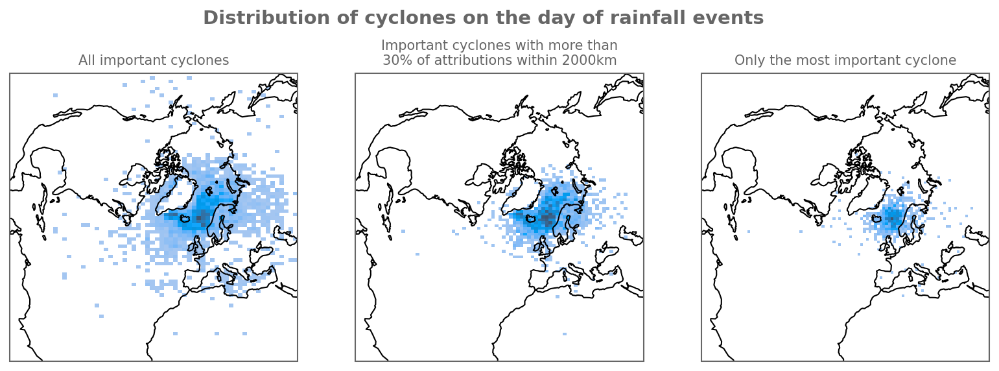

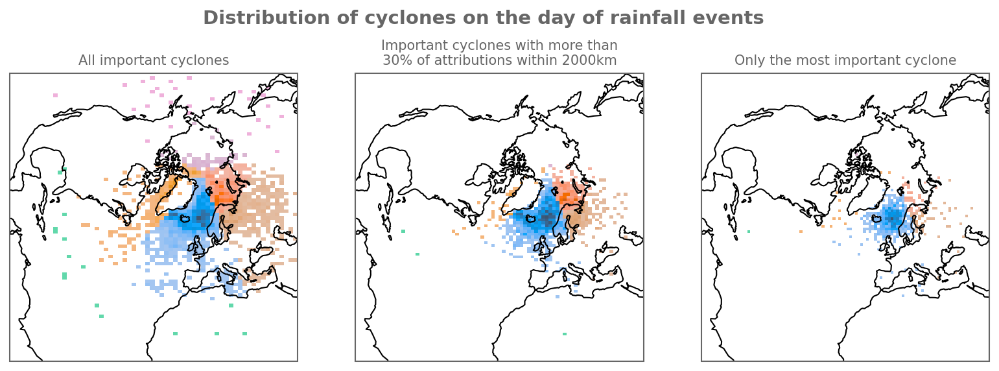

In [148]:
fig, axs = plt.subplots(1,3,subplot_kw = dict(projection=proj), figsize=(13,4.4))

# polygons_masks.plot(edgecolor="k", color=polygons_masks.colors, transform=ccrs.PlateCarree(), ax=axs[0], legend=True, alpha=.2)
# polygons_masks.plot(edgecolor=polygons_masks.colors ,  color='none', transform=ccrs.PlateCarree(), ax=axs[0], legend=True, alpha=1, linewidth=3, zorder=100)
sns.histplot(joined.query("(timestep_past==0)&(important==1)"), x='x',y='y',  transform=proj, fill=True, ax=axs[0], )
axs[0].set_extent((-10e6, 5e6,-10e6,5e6), crs=proj)
axs[0].coastlines()
axs[0].legend(ncols=2, loc='lower left')
axs[0].set_title('All important cyclones')
# polygons_masks.plot(edgecolor="k", color=polygons_masks.colors, transform=ccrs.PlateCarree(), ax=axs[1], legend=True, alpha=.2)
# polygons_masks.plot(edgecolor=polygons_masks.colors ,  color='none', transform=ccrs.PlateCarree(), ax=axs[1], legend=True, alpha=1, linewidth=3, zorder=100)
sns.histplot(joined.query("(timestep_past==0)&(important==1)&(attributions2000>0.3)"), x='x',y='y',  transform=proj, fill=True, ax=axs[1], )
axs[1].set_extent((-10e6, 5e6,-10e6,5e6), crs=proj)
axs[1].coastlines()
axs[1].legend(ncols=2, loc='lower left')
axs[1].set_title('Important cyclones with more than\n30% of attributions within 2000km')

sns.histplot(joined.loc[joined.groupby(['time_of_event','timestep_past']).attributions2000.idxmax().values].query("(timestep_past==0)&(important==1)"), x='x',y='y',  transform=proj, fill=True, ax=axs[2], )
axs[2].set_extent((-10e6, 5e6,-10e6,5e6), crs=proj)
axs[2].coastlines()
axs[2].legend(ncols=2, loc='lower left')
axs[2].set_title('Only the most important cyclone')


plt.suptitle('Distribution of cyclones on the day of rainfall events')

fig, axs = plt.subplots(1,3,subplot_kw = dict(projection=proj), figsize=(13,4.4))

# polygons_masks.plot(edgecolor="k", color=polygons_masks.colors, transform=ccrs.PlateCarree(), ax=axs[0], legend=True, alpha=.2)
# polygons_masks.plot(edgecolor=polygons_masks.colors ,  color='none', transform=ccrs.PlateCarree(), ax=axs[0], legend=True, alpha=1, linewidth=3, zorder=100)
sns.histplot(joined.query("(timestep_past==0)&(important==1)"), x='x',y='y',  transform=proj, fill=True, ax=axs[0], hue='poly_id')
axs[0].set_extent((-10e6, 5e6,-10e6,5e6), crs=proj)
axs[0].coastlines()
axs[0].legend(ncols=2, loc='lower left')
axs[0].set_title('All important cyclones')
# polygons_masks.plot(edgecolor="k", color=polygons_masks.colors, transform=ccrs.PlateCarree(), ax=axs[1], legend=True, alpha=.2)
# polygons_masks.plot(edgecolor=polygons_masks.colors ,  color='none', transform=ccrs.PlateCarree(), ax=axs[1], legend=True, alpha=1, linewidth=3, zorder=100)
sns.histplot(joined.query("(timestep_past==0)&(important==1)&(attributions2000>0.3)"), x='x',y='y',  transform=proj, fill=True, ax=axs[1], hue='poly_id')
axs[1].set_extent((-10e6, 5e6,-10e6,5e6), crs=proj)
axs[1].coastlines()
axs[1].legend(ncols=2, loc='lower left')
axs[1].set_title('Important cyclones with more than\n30% of attributions within 2000km')

sns.histplot(joined.loc[joined.groupby(['time_of_event','timestep_past']).attributions2000.idxmax().values].query("(timestep_past==0)&(important==1)"), x='x',y='y',  transform=proj, fill=True, ax=axs[2], hue='poly_id')
axs[2].set_extent((-10e6, 5e6,-10e6,5e6), crs=proj)
axs[2].coastlines()
axs[2].legend(ncols=2, loc='lower left')
axs[2].set_title('Only the most important cyclone')


plt.suptitle('Distribution of cyclones on the day of rainfall events')

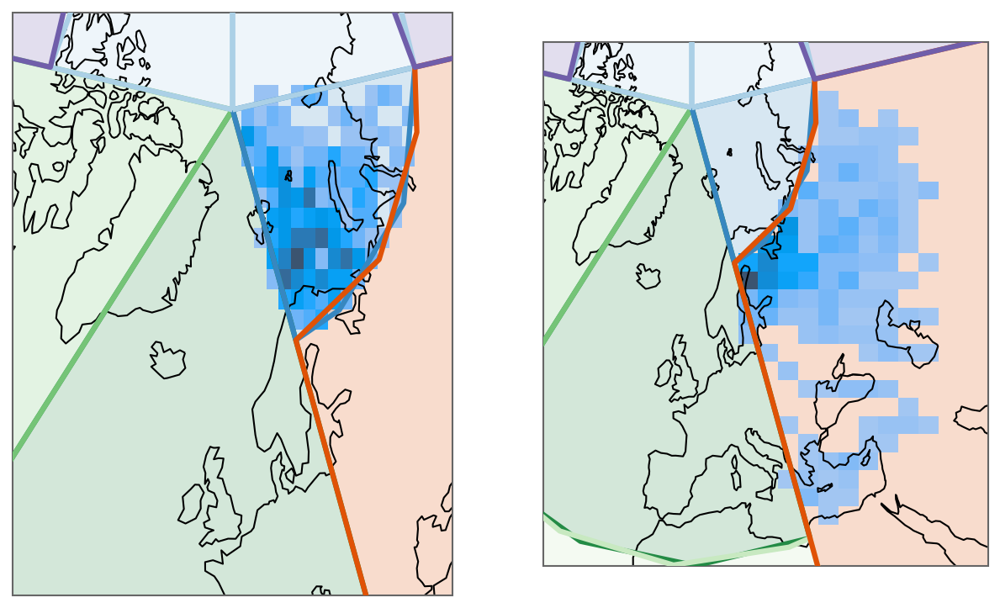

In [120]:
fig, axs = plt.subplots(1,2,subplot_kw = dict(projection=proj), figsize=(10,6))

polygons_masks.plot(edgecolor="k", color=polygons_masks.colors, transform=ccrs.PlateCarree(), ax=axs[0], legend=True, alpha=.2)
polygons_masks.plot(edgecolor=polygons_masks.colors ,  color='none', transform=ccrs.PlateCarree(), ax=axs[0], legend=True, alpha=1, linewidth=3, zorder=100)
sns.histplot(joined.query("(timestep_past==0)&(poly_id=='Arctic Eurasia')&(important==1)"), x='x',y='y',  transform=proj, fill=True, ax=axs[0])
axs[0].set_extent((-3e6, 3e6,-5e6,1e6), crs=proj)
axs[0].coastlines()

polygons_masks.plot(edgecolor="k", color=polygons_masks.colors, transform=ccrs.PlateCarree(), ax=axs[1], legend=True, alpha=.2)
polygons_masks.plot(edgecolor=polygons_masks.colors ,  color='none', transform=ccrs.PlateCarree(), ax=axs[1], legend=True, alpha=1, linewidth=3, zorder=100)
sns.histplot(joined.query("(timestep_past==0)&(poly_id=='Eurasia')&(important==1)"), x='x',y='y',  transform=proj, fill=True, ax=axs[1])
axs[1].set_extent((-3e6, 6e6,-7e6,1e6), crs=proj)
axs[1].coastlines()

In [51]:
joined.groupby(['time_of_event','timestep_past']).attributions2000.idxmax().unstack()

timestep_past,-6,-5,-4,-3,-2,-1,0
time_of_event,,,,,,,
1979-01-07,3,21,35,52,76,109,113
1979-03-03,130,147,173,198,216,230,242
1979-03-04,248,274,299,317,331,343,354
1979-03-05,364,389,407,421,433,444,458
1979-08-14,467,494,509,524,538,549,553
...,...,...,...,...,...,...,...
2024-12-01,109746,109767,109791,109815,109820,109846,109856
2024-12-13,109869,109883,109906,109919,109939,109954,109973
2024-12-15,109992,110011,110028,110040,110048,110068,110090


In [42]:
joined.loc[joined.groupby(['time_of_event','timestep_past']).attributions2000.idxmax().values].index.size/7

928.0

In [35]:
joined.groupby(['time_of_event','timestep_past']).attributions2000.idxmax()

time_of_event  timestep_past
1979-01-07     -6                    3
               -5                   21
               -4                   35
               -3                   52
               -2                   76
                                 ...  
2024-12-29     -4               110258
               -3               110267
               -2               110287
               -1               110308
                0               110325
Name: attributions2000, Length: 6496, dtype: int64

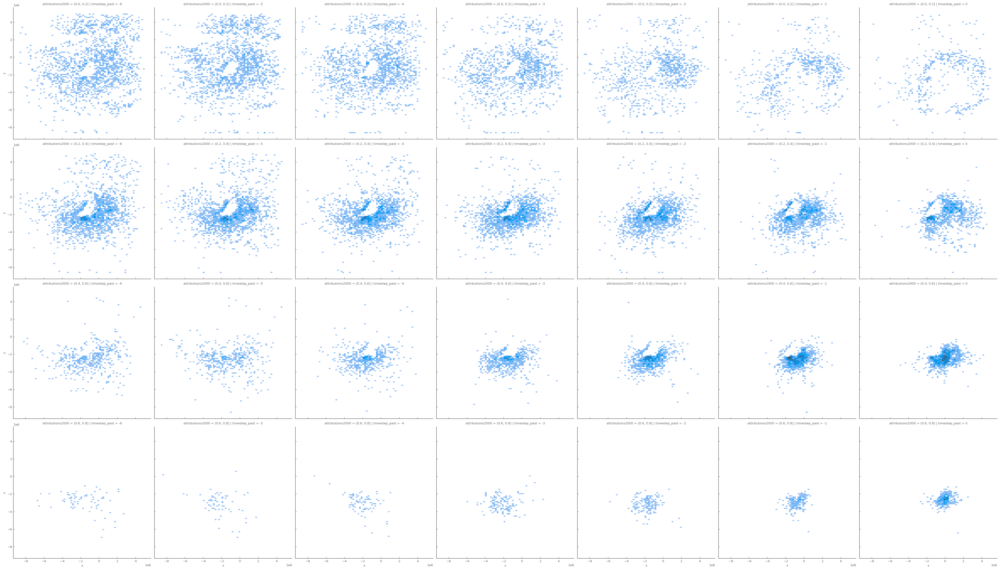

In [30]:
sns.displot(joined.query("important==1"), x='x', y='y', row=pd.cut(joined.query("important==1").attributions2000, np.arange(0,.9,.2)), col='timestep_past')

/tmp/ipykernel_740545/3426067217.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  d1 = joined.query("(important==1)").groupby(['poly_id','timestep_past', (joined.attributions2000//.1)*.1]).count().x
/tmp/ipykernel_740545/3426067217.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  d2 = joined.groupby(['poly_id','timestep_past']).count().x


<Axes: xlabel='timestep_past', ylabel='attributions2000'>

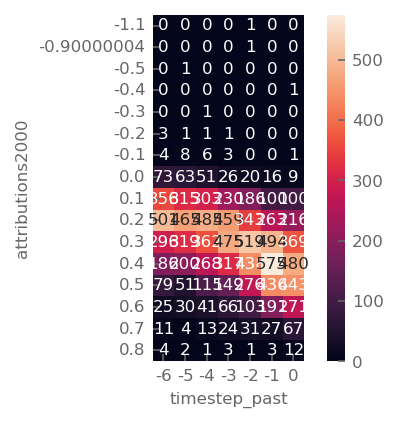

In [192]:
d1 = joined.query("(important==1)").groupby(['poly_id','timestep_past', (joined.attributions2000//.1)*.1]).count().x
d2 = joined.groupby(['poly_id','timestep_past']).count().x
d1
# (d1/d2).x.unstack().T.plot()
sns.heatmap((d1).reset_index().query("poly_id=='Atlantic North E'").set_index(['timestep_past','attributions2000']).x.unstack().T, square=True, annot=True, fmt='.00f')

/tmp/ipykernel_740545/1499520103.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  joined.loc[joined.groupby(['time_of_event','timestep_past']).attributions2000.idxmax()].groupby(['poly_id','timestep_past']).count().x.unstack().T.plot()


<Axes: xlabel='timestep_past'>

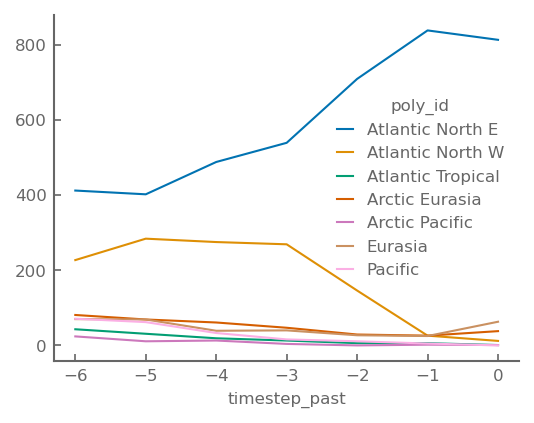

In [218]:
joined.loc[joined.groupby(['time_of_event','timestep_past']).attributions2000.idxmax()].groupby(['poly_id','timestep_past']).count().x.unstack().T.plot()

<Axes: xlabel='important'>

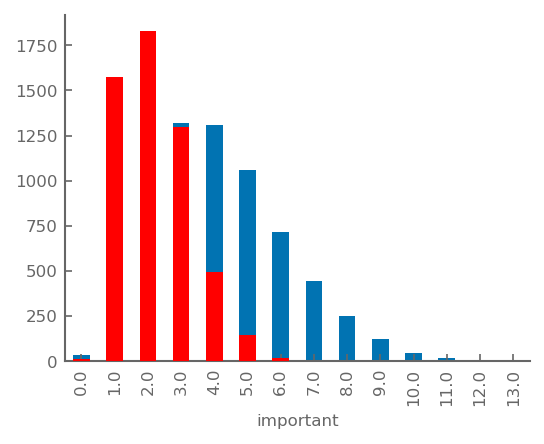

In [234]:
joined.query("attributions2000>0.3").groupby(['time_of_event','timestep_past']).important.sum().value_counts().sort_index().plot.bar(color='red', zorder=10)

joined.groupby(['time_of_event','timestep_past']).important.sum().value_counts().sort_index().plot.bar()


<Axes: xlabel='important'>

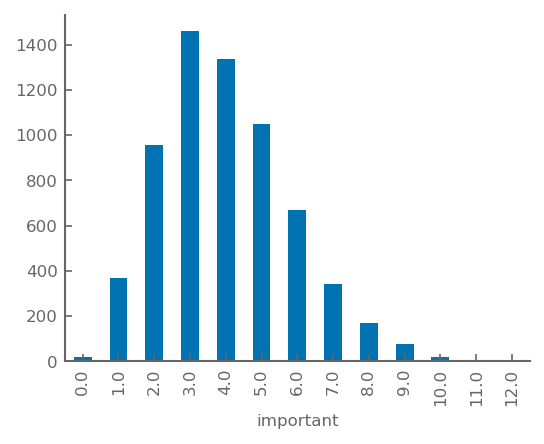

In [229]:
joined.query("attributions2000>0.1").groupby(['time_of_event','timestep_past']).important.sum().value_counts().sort_index().plot.bar()

In [ ]:
sns.catplot(joined, x='msl', y='attributions2000', col='poly_id', row='timestep_past', hue='important')


/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/distributed/worker.py:1574: DeprecationWarning: the rpc synchronous context manager is deprecated
  with self.rpc(self.nanny) as r:
2025-10-24 14:16:45,208 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
2025-10-24 14:16:45,211 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
2025-10-24 14:16:45,211 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
2025-10-24 14:16:45,213 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
2025-10-24 14:16:45,218 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File

KeyboardInterrupt: 

In [202]:
d1 = d1#.query("attributions2000>0")

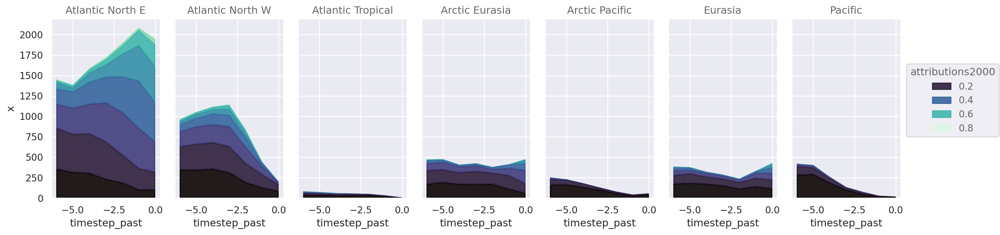

In [206]:
(so.Plot(d1.reset_index().query("attributions2000>0"), 
         x='timestep_past', y='x', color='attributions2000')
 .add(so.Area(alpha=.9), so.Stack())
 .facet(col='poly_id')
 .layout(size=(15,4))
 .scale(color='mako')
)


/tmp/ipykernel_740545/3200794020.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  d1 = joined.query("(important==1)").groupby(['poly_id','timestep_past', pd.cut(joined.attributions2000, np.arange(0,1.1,.1))]).count().x
/tmp/ipykernel_740545/3200794020.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  d2 = joined.groupby(['poly_id','timestep_past']).count().x


<Axes: xlabel='timestep_past', ylabel='attributions2000'>

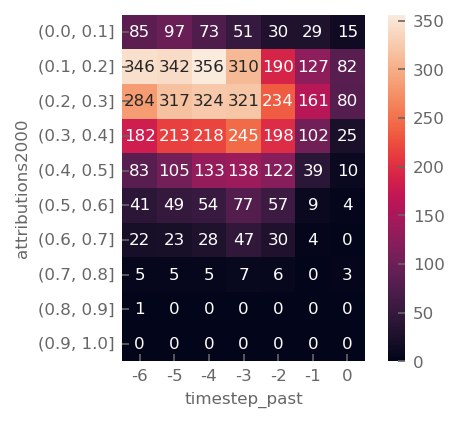

In [181]:
d1 = joined.query("(important==1)").groupby(['poly_id','timestep_past', pd.cut(joined.attributions2000, np.arange(0,1.1,.1))]).count().x
d2 = joined.groupby(['poly_id','timestep_past']).count().x
d1
# (d1/d2).x.unstack().T.plot()
sns.heatmap((d1).reset_index().query("poly_id=='Atlantic North W'").set_index(['timestep_past','attributions2000']).x.unstack().T, square=True, annot=True, fmt='.00f')

/tmp/ipykernel_740545/2682944443.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = (joined.groupby(['timestep_past','poly_id',]).count())
/tmp/ipykernel_740545/2682944443.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = (joined.groupby(['timestep_past','poly_id','important','attributions2000']).count())
/tmp/ipykernel_740545/2682944443.py:17: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = (joined.gr

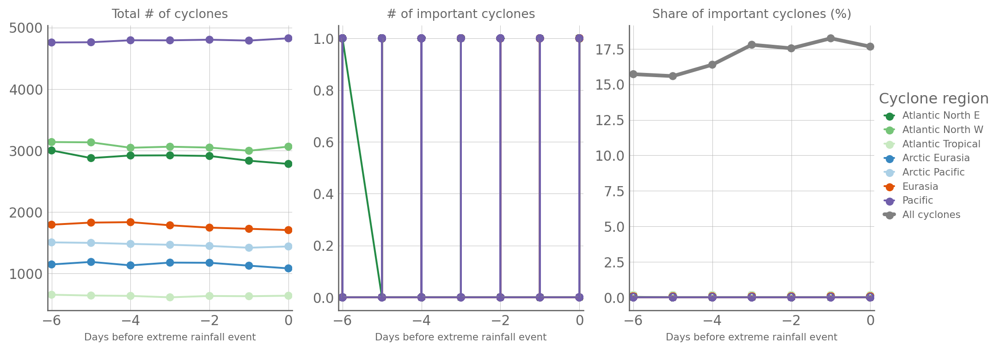

In [ ]:
df_ = (joined.groupby(['timestep_past','poly_id',]).count())
df_total = df_.x.rename('metric').reset_index()
df_total['data_type'] = 'Total # of cyclones'
df_total_sum = df_total.groupby(['timestep_past']).metric.sum().reset_index()
df_total_sum['poly_id'] = 'All cyclones'
df_total_sum['data_type'] = df_total.data_type
# df_total = pd.concat([df_total, df_total_sum])

df_ = (joined.groupby(['timestep_past','poly_id','important']).count())
df_important = df_.x.rename('metric').reset_index().query("important==1").reset_index().iloc[:,1:]
df_important['data_type'] = '# of important cyclones'
df_important_sum = df_important.groupby(['timestep_past']).metric.sum().reset_index()
df_important_sum['poly_id'] = 'All cyclones'
df_important_sum['data_type'] = df_important.data_type
# df_important = pd.concat([df_important, df_important_sum])

df_ = (joined.groupby(['timestep_past','poly_id','important']).count()/joined.groupby(['timestep_past','poly_id',]).count())*100
df_proba = df_.x.rename('metric').reset_index().query("important==1").reset_index().iloc[:,1:]
df_proba['data_type'] = 'Share of important cyclones (%)'
df_proba_mean = (100*df_important_sum.set_index(['poly_id','timestep_past']).metric/df_total_sum.set_index(['poly_id','timestep_past']).metric).reset_index()
df_proba_mean['data_type'] = 'Share of important cyclones (%)'
df_proba = pd.concat([df_proba, df_proba_mean])

df_ = pd.concat([df_total,  df_important, df_proba ], axis=0).iloc[:,:-1]
df_=df_.set_index(['timestep_past','poly_id']).reset_index()



colors_dict = polygons_masks.colors.to_dict()
colors_dict.update({'All cyclones':'.5'})
(so.Plot(df_,x='timestep_past', y='metric', color='poly_id', linewidth='poly_id')
        .add(so.Line())
        .add(so.Dot())
        .theme(plt.style.library["robin"])
        .facet(col='data_type')
        .theme({'axes.grid':True, 'grid.color':'.7', 'grid.linestyle':'-', 'grid.linewidth':.3})
        .limit(x=(-6.1,0.1))
        .share(y=False)
        .label(color='Cyclone region', x='Days before extreme rainfall event', y='')
        .scale(color=so.Nominal(colors_dict),
               linewidth=[1.5,1.5,1.5,1.5,1.5,1.5,1.5,3],
            )
        .layout(size=(10,4))
)

# df_ = (joined.groupby(['timestep_past','poly_id',]).count())
# df_ = df_.x.rename('# of important cyclones').reset_index()
# (so.Plot(df_,x='timestep_past', y='# of important cyclones', color='poly_id', )
#     .add(so.Line(marker='o'))
#      .theme(plt.style.library["robin"])
#     .theme({'axes.grid':True, 'grid.color':'.7', 'grid.linestyle':'-', 'grid.linewidth':.3})
#     .limit(x=(-6.1,0.1))
#     .label(color='Cyclone region', x='Timestep in the past (days)')
#     .scale(color=so.Nominal(polygons_masks.colors.to_dict(),),
#         )
#     .layout(size=(4,4))
# )

In [102]:
df_important_sum

,timestep_past,metric,poly_id,data_type
0,-6,147000,All cyclones,# of important cyclones


In [ ]:
joined

,date,track_id,n_cyclone,timestep_past,time_of_event,important,lon,lat,x,y,msl,geometry,index_right,poly_id,domain
0,1999-11-18,427514.0,0,-6,1999-11-24,True,15.444814,75.352169,4.247939e+05,-1.537507e+06,100889.370430,POINT (15.44481 75.35217),0,Atlantic North E,Atlantic
16990,2005-01-08,534761.0,10,-4,2005-01-12,True,-11.269780,67.583728,-4.804617e+05,-2.411094e+06,96453.262486,POINT (-11.26978 67.58373),0,Atlantic North E,Atlantic
5090,2008-06-04,606182.0,3,-6,2008-06-10,True,0.359825,60.138462,2.076906e+04,-3.307065e+06,98724.031884,POINT (0.35982 60.13846),0,Atlantic North E,Atlantic
16994,2005-02-06,536260.0,10,-4,2005-02-10,True,-20.251849,86.725654,-1.228109e+05,-3.328605e+05,98491.435762,POINT (-20.25185 86.72565),0,Atlantic North E,Atlantic
16997,2005-04-07,539863.0,10,-4,2005-04-11,True,1.513085,59.647571,8.882741e+04,-3.362833e+06,98205.528407,POINT (1.51309 59.64757),0,Atlantic North E,Atlantic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17564,2010-04-15,644941.0,10,-2,2010-04-17,True,153.408185,52.210257,1.899220e+06,3.794007e+06,97271.387083,POINT (153.40819 52.21026),6,Pacific,Pacific
17566,2010-09-09,653679.0,10,-2,2010-09-11,False,165.562843,56.808909,9.213501e+05,3.578785e+06,98093.965383,POINT (165.56284 56.80891),6,Pacific,Pacific
17567,2010-09-12,653503.0,10,-2,2010-09-14,False,178.087444,51.893695,1.428755e+05,4.278630e+06,98378.130728,POINT (178.08744 51.89369),6,Pacific,Pacific
17545,2008-11-24,615820.0,10,-2,2008-11-26,False,-134.808537,56.470361,-2.650084e+06,2.632431e+06,98785.762998,POINT (-134.80854 56.47036),6,Pacific,Pacific


/tmp/ipykernel_241202/1405096585.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = (joined_strong.groupby(['timestep_past','poly_id',]).count())
/tmp/ipykernel_241202/1405096585.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = (joined_strong.groupby(['timestep_past','poly_id','important']).count())
/tmp/ipykernel_241202/1405096585.py:18: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = (joined_strong

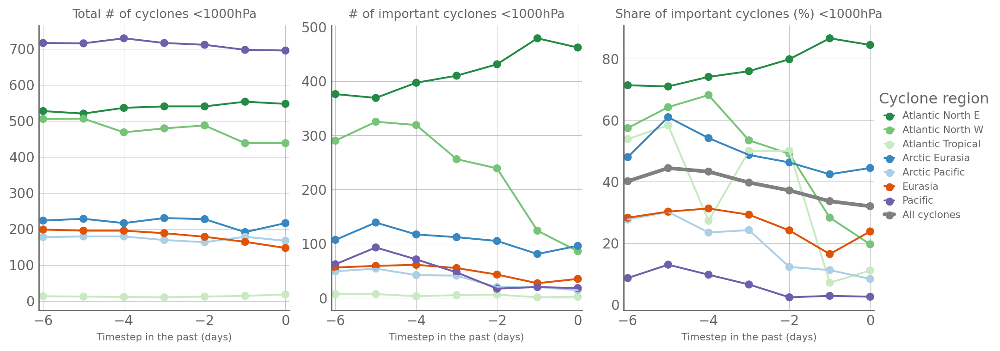

In [ ]:
joined_strong = joined.query("msl<=100000")
df_ = (joined_strong.groupby(['timestep_past','poly_id',]).count())
df_total = df_.x.rename('metric').reset_index()
df_total['data_type'] = 'Total # of cyclones <1000hPa'
df_total_sum = df_total.groupby(['timestep_past']).metric.sum().reset_index()
df_total_sum['poly_id'] = 'All cyclones'
df_total_sum['data_type'] = df_total.data_type
# df_total = pd.concat([df_total, df_total_sum])

df_ = (joined_strong.groupby(['timestep_past','poly_id','important']).count())
df_important = df_.x.rename('metric').reset_index().query("important").reset_index().iloc[:,1:]
df_important['data_type'] = '# of important cyclones <1000hPa'
df_important_sum = df_important.groupby(['timestep_past']).metric.sum().reset_index()
df_important_sum['poly_id'] = 'All cyclones'
df_important_sum['data_type'] = df_important.data_type
# df_important = pd.concat([df_important, df_important_sum])

df_ = (joined_strong.groupby(['timestep_past','poly_id','important']).count()/joined_strong.groupby(['timestep_past','poly_id',]).count())*100
df_proba = df_.x.rename('metric').reset_index().query("important").reset_index().iloc[:,1:]
df_proba['data_type'] = 'Share of important cyclones (%) <1000hPa'
df_proba_mean = (100*df_important_sum.set_index(['poly_id','timestep_past']).metric/df_total_sum.set_index(['poly_id','timestep_past']).metric).reset_index()
df_proba_mean['data_type'] = 'Share of important cyclones (%) <1000hPa'
df_proba = pd.concat([df_proba, df_proba_mean])

df_ = pd.concat([df_total,  df_important, df_proba ], axis=0).iloc[:,:-1]
df_=df_.set_index(['timestep_past','poly_id']).reset_index()



colors_dict = polygons_masks.colors.to_dict()
colors_dict.update({'All cyclones':'.5'})
(so.Plot(df_,x='timestep_past', y='metric', color='poly_id', linewidth='poly_id')
        .add(so.Line())
        .add(so.Dot())
        .theme(plt.style.library["robin"])
        .facet(col='data_type')
        .theme({'axes.grid':True, 'grid.color':'.7', 'grid.linestyle':'-', 'grid.linewidth':.3})
        .limit(x=(-6.1,0.1))
        .share(y=False)
        .label(color='Cyclone region', x='Timestep in the past (days)', y='')
        .scale(color=so.Nominal(colors_dict),
               linewidth=[1.5,1.5,1.5,1.5,1.5,1.5,1.5,3],
            )
        .layout(size=(10,4))
)

# df_ = (joined_strong.groupby(['timestep_past','poly_id',]).count())
# df_ = df_.x.rename('# of important cyclones').reset_index()
# (so.Plot(df_,x='timestep_past', y='# of important cyclones', color='poly_id', )
#     .add(so.Line(marker='o'))
#      .theme(plt.style.library["robin"])
#     .theme({'axes.grid':True, 'grid.color':'.7', 'grid.linestyle':'-', 'grid.linewidth':.3})
#     .limit(x=(-6.1,0.1))
#     .label(color='Cyclone region', x='Timestep in the past (days)')
#     .scale(color=so.Nominal(polygons_masks.colors.to_dict(),),
#         )
#     .layout(size=(4,4))
# )

In [32]:
important_cyclones_tracks

,index,0
0,0,161090
1,1,160982
2,timestep_past,-6
3,0,161090
4,1,160982
5,2,160877
6,timestep_past,-5
7,0,161090
8,1,160990
9,2,160877


# Compute all distances to cyclone

In [ ]:
grid_stack = grid.stack(space=['y','x'])

def get_distance_per_day(day):
    day_str = day.strftime('%Y-%m-%d')
    cyclones_day = daily_cycs.loc[day_str].to_xarray().rename(date='n_cyclone')
    cyclones_day = cyclones_day.assign_coords(n_cyclone=np.arange(cyclones_day.n_cyclone.size))
    distance = np.sqrt((grid_stack.x - cyclones_day.x)**2 + (grid_stack.y - cyclones_day.y)**2).unstack('space')
    distance = distance.assign_coords(track_id=cyclones_day.track_id, cyclone_lon=cyclones_day.lon, cyclone_lat=cyclones_day.lat)
    # per_quadrant_distance = distance.groupby(cyclones_day.poly_id).min()
    return distance

def get_distance_per_day_of_event(day):
    all_distances = []
    day0 = day 
    for k in range(7):
        distance_day = get_distance_per_day(day0 - np.timedelta64(k, 'D'))
        all_distances.append(distance_day.assign_coords(timestep_past=-k))
    return xr.concat(all_distances[::-1], dim='timestep_past',join='outer' ).assign_coords(time_of_event=day).rename('distance_to_cyclones')
    
def get_important_cyclones(day):
    ds_dist = get_distance_per_day_of_event(day)
    attributions_per_distance = flox.xarray.xarray_reduce(
        lrp_normed.sel(time_of_event=day),
        ds_dist,
        ds_dist.n_cyclone,
        ds_dist.timestep_past,
        func="mean",
        expected_groups=(ds_dist.quantile(np.arange(0,1.0001,.01)),
                        None,
                        None,
                        ),
        isbin=[True, False, False,],
        method="map-reduce",
        keep_attrs=True
    )
    attributions_per_distance = attributions_per_distance.assign_coords(track_id=ds_dist.track_id)
    attributions_per_distance['distance_to_cyclones_bins'] = [k.mid for k in attributions_per_distance.distance_to_cyclones_bins.values]
    attributions_per_distance = attributions_per_distance.rename(distance_to_cyclones_bins='Distance_to_cyclone')
    return attributions_per_distance


list_times = pd.to_datetime([time for time in ds_attrs.time_of_event.values if time in daily_cycs.index.unique()])
bag = db.from_sequence(list_times, npartitions=100)
results = bag.map(get_important_cyclones)
all_distances = xr.concat(results, dim='time_of_event', join='outer')
ds_attrs['distance_to_cyclones'] = all_distances

/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/distributed/client.py:3363: UserWarning: Sending large graph of size 424.75 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/tmp/ipykernel_488159/3756391054.py:18: FutureWarning: In a future version of xarray the default value for coords will change from coords='different' to coords='minimal'. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set coords explicitly.
/tmp/ipykernel_488159/3756391054.py:18: FutureWarning: In a future version of xarray the default value for coords will change from

In [59]:
list_times

DatetimeIndex(['1979-01-07', '1979-03-03', '1979-03-04', '1979-03-05',
               '1979-08-14', '1979-09-11', '1979-09-13', '1979-09-17',
               '1979-09-18', '1979-09-19',
               ...
               '2024-10-22', '2024-10-23', '2024-10-27', '2024-10-31',
               '2024-11-16', '2024-12-01', '2024-12-13', '2024-12-15',
               '2024-12-18', '2024-12-29'],
              dtype='datetime64[ns]', length=928, freq=None)

/tmp/ipykernel_488159/664166275.py:18: FutureWarning: In a future version of xarray the default value for coords will change from coords='different' to coords='minimal'. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set coords explicitly.
  return xr.concat(all_distances[::-1], dim='timestep_past',join='outer' ).assign_coords(time_of_event=day).rename('distance_to_cyclones')


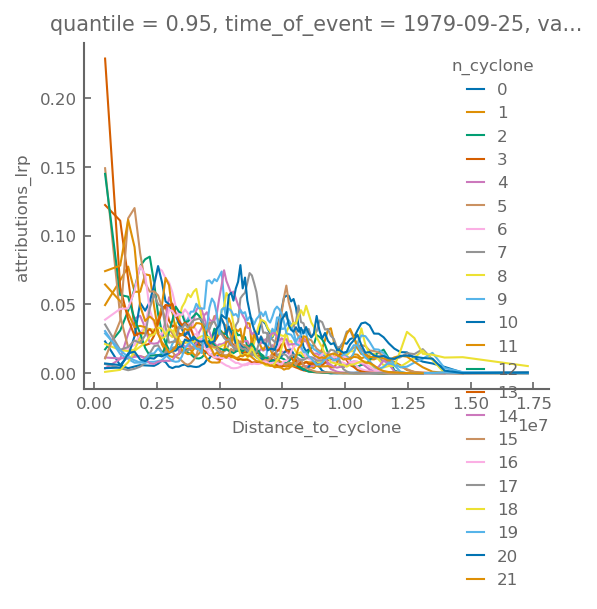

In [84]:
ds_dist = get_important_cyclones(list_times[10])
ds_dist.isel(timestep_past=0).plot(hue='n_cyclone')

# Example plot

/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/pyproj/transformer.py:816: UserWarning: Warning: converting a masked element to nan.
  return self._transformer._transform_point(


<GeoAxes: title={'center': '1996-11-02  |  6 days before the event'}, xlabel='x', ylabel='y'>

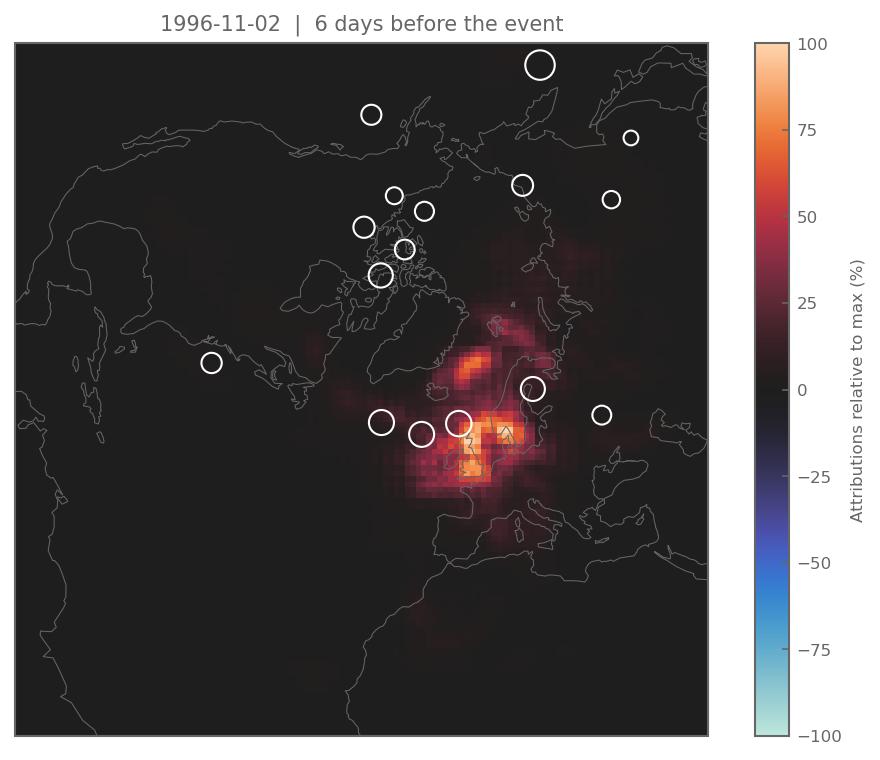

In [41]:
# time = ds_attrs.time_of_event.isel(time_of_event=20).values
time = ds_attrs.time_of_event.isel(time_of_event=350).values
timestep_past = 0

# ds_ = lrp_normed.sel(time_of_event=time).sum('var_name')
# # ds_ = ds_/ds_.max(['x','y'])
# plot = ds_.plot(col='timestep_past', subplot_kws={'projection':proj}, transform=proj, col_wrap=4)



plot = (100*lrp_normed).sel(time_of_event=time, timestep_past=timestep_past).plot( subplot_kws=dict(projection=proj), transform=proj,size=6, cmap='icefire', cbar_kwargs=dict(label='Attributions relative to max (%)'))
ax= plot.axes
k=0
ax.coastlines(color='.4', linewidth=.5)
time_ = time +(k-6)*pd.Timedelta('1D')
ax.set_title(pd.to_datetime(time).strftime("%Y-%m-%d")+'  |  6 days before the event')
cyclones_ = daily_cycs.loc[time +(k+timestep_past)*pd.Timedelta('1D')].copy().set_index('track_id')
cyclones_.loc[:,'size'] = 1050 - cyclones_.msl
# track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int)
# important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
# important_cyclones_ = pd.Series(important_cyclones_, index = track_id_)
# cyclones_['important'] = important_cyclones_
sns.scatterplot(cyclones_, x='x', y='y', transform=proj, ax=ax, size='size', sizes= (50,200), legend=False, edgecolor='1', linewidth=1, zorder=100, color=None, facecolor='none',)

    # break

# Determine important cyclones

In [66]:
import flox.xarray

attributions_per_distance = flox.xarray.xarray_reduce(
    lrp_normed,
    ds_attrs.distance_to_cyclones,
    ds_attrs.n_cyclone,
    ds_attrs.timestep_past,
    ds_attrs.time_of_event,
    func="mean",
    expected_groups=(ds_attrs.distance_to_cyclones.quantile(np.arange(0,1.0001,.01)),
                     None,
                     None,
                     None,
                     ),
    isbin=[True, False, False, False],
    method="map-reduce",
    keep_attrs=True
)
attributions_per_distance = attributions_per_distance.assign_coords(track_id=ds_attrs.track_id)
attributions_per_distance['distance_to_cyclones_bins'] = [k.mid for k in attributions_per_distance.distance_to_cyclones_bins.values]
attributions_per_distance = attributions_per_distance.rename(distance_to_cyclones_bins='Distance_to_cyclone')
important_cyclones = attributions_per_distance.idxmax('Distance_to_cyclone')<=2000


## Examples of tracking

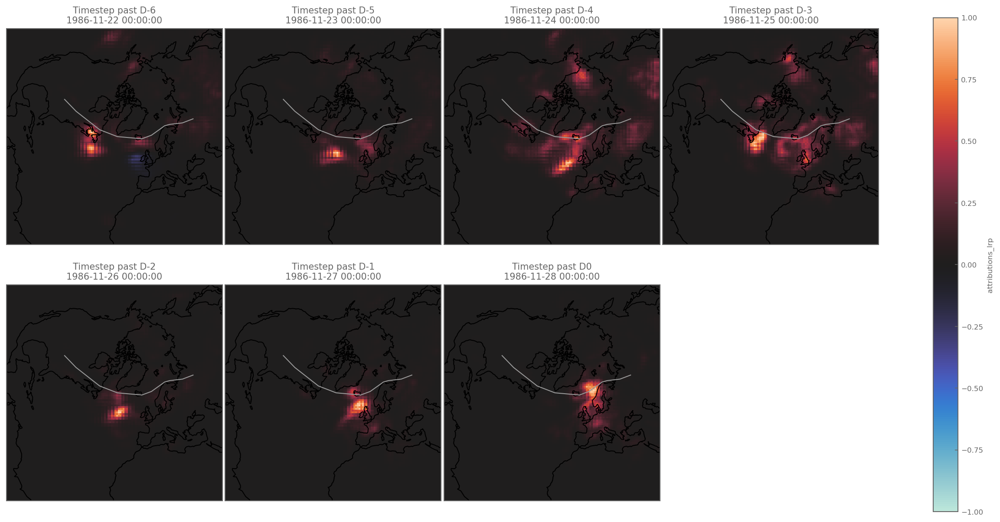

In [34]:
time = ds_attrs.time_of_event.isel(time_of_event=150).values


all_important = []
for k in range(7):
    time_ = time +(k-6)*pd.Timedelta('1D')
    cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
    # track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int).astype(str)
    # important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
    # important_cyclones_ = pd.Series(important_cyclones_, index = track_id_).copy()
    # important_cyclones_.index = important_cyclones_.index.astype(int)
    # important_cyclones_ = cyclones_[important_cyclones_].copy()
    # important_cyclones_['timestep_past'] = (k-6) 
#     all_important.append(important_cyclones_)
# important_cyclones_tracks = pd.concat(all_important).reset_index()
# important_cyclones_tracks['track_id']=important_cyclones_tracks['track_id'].astype(str)

palette = sns.color_palette('tab20')

# colors = {id:palette[k] for k,id in enumerate(important_cyclones_tracks.track_id.unique())}
# colors

plot = lrp_normed.sel(time_of_event=time).plot(col='timestep_past', subplot_kws=dict(projection=proj), transform=proj,size=4, col_wrap=4, aspect=1, cmap='icefire')
for k, ax in enumerate(plot.axs.flat):
    ax.coastlines()
    timestep_past = (k-6)
    time_ = time +(k-6)*pd.Timedelta('1D')
    ax.set_title(f'Timestep past D{-(6-k)}\n{time_}')
    # important_cyclones_tracks_day = important_cyclones_tracks.loc[important_cyclones_tracks.timestep_past==timestep_past]
    # important_cyclones_tracks_day = important_cyclones_tracks_day.query("track_id=='429939'")
    # sns.lineplot(important_cyclones_tracks.set_index('track_id').loc[important_cyclones_tracks_day.track_id].reset_index()
    #                 ,x='x', y='y', color='.8', linewidth=3, zorder=100, transform=proj,ax=ax, legend=False, sort=False)
    # sns.scatterplot(important_cyclones_tracks_day,x='x', y='y', s=100,edgecolor='1',zorder=100, linewidth=2, transform=proj,ax=ax, legend=True,
    #                    color=None, facecolor='none')
    sns.lineplot(daily_cycs.set_index('track_id').loc[429939]
                    ,x='x', y='y', color='.6', linewidth=1, zorder=10, transform=proj,ax=ax, legend=False, sort=False)
    try:
        sns.scatterplot(daily_cycs.set_index('track_id').loc[429939].set_index('date').loc[[time_]]
                       ,x='x', y='y', color='.6', linewidth=1, zorder=90, transform=proj,ax=ax, legend=False,
                       edgecolor='1', facecolor='.6', s=50)
    except:
        pass
    ax.set_extent((ds_attrs.x.min(),ds_attrs.x.max(),ds_attrs.y.min(),ds_attrs.y.max(),), crs=proj)


In [ ]:

def plot_cyclone(time, cyclone_id):
    all_important = []
    for k in range(7):
        time_ = time +(k-6)*pd.Timedelta('1D')
        cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
        track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int).astype(str)
        important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
        important_cyclones_ = pd.Series(important_cyclones_, index = track_id_).copy()
        important_cyclones_.index = important_cyclones_.index.astype(int)
        important_cyclones_ = cyclones_[important_cyclones_].copy()
        important_cyclones_['timestep_past'] = (k-6) 
        all_important.append(important_cyclones_)
    important_cyclones_tracks = pd.concat(all_important).reset_index()
    important_cyclones_tracks['track_id']=important_cyclones_tracks['track_id'].astype(str)

    palette = sns.color_palette('tab20')

    colors = {id:palette[k] for k,id in enumerate(important_cyclones_tracks.track_id.unique())}
    colors

    plot = lrp_normed.sel(time_of_event=time).plot(col='timestep_past', subplot_kws=dict(projection=proj), transform=proj,size=4, col_wrap=4, aspect=1, cmap='icefire')
    for k, ax in enumerate(plot.axs.flat):
        ax.coastlines()
        timestep_past = (k-6)
        time_ = time +(k-6)*pd.Timedelta('1D')
        ax.set_title(f'Timestep past D{-(6-k)}\n{time_}')
        important_cyclones_tracks_day = important_cyclones_tracks.loc[important_cyclones_tracks.timestep_past==timestep_past]
        important_cyclones_tracks_day = important_cyclones_tracks_day.query("track_id==@cyclone_id")
        sns.lineplot(important_cyclones_tracks.set_index('track_id').loc[important_cyclones_tracks_day.track_id].reset_index()
                        ,x='x', y='y', color='.8', linewidth=3, zorder=100, transform=proj,ax=ax, legend=False, sort=False)
        sns.scatterplot(important_cyclones_tracks_day,x='x', y='y', s=100,edgecolor='1',zorder=100, linewidth=2, transform=proj,ax=ax, legend=True,
                        color=None, facecolor='none')
        sns.lineplot(daily_cycs.set_index('track_id').loc[cyclone_id]
                        ,x='x', y='y', color='.6', linewidth=1, zorder=10, transform=proj,ax=ax, legend=False, sort=False)
        try:
            sns.scatterplot(daily_cycs.set_index('track_id').loc[cyclone_id].set_index('date').loc[[time_]]
                        ,x='x', y='y', color='.6', linewidth=1, zorder=90, transform=proj,ax=ax, legend=False,
                        edgecolor='1', facecolor='.6', s=50)
        except:
            pass
        ax.set_extent((ds_attrs.x.min(),ds_attrs.x.max(),ds_attrs.y.min(),ds_attrs.y.max(),), crs=proj)


In [ ]:
time = ds_attrs.time_of_event.sel(time_of_event='2007-10-16').values
cyclone_id = 592771
plot_cyclone(time, cyclone_id)

# Sort attributions by distance

In [45]:
ds_attrs

<xarray.Dataset> Size: 6GB
Dimensions:               (y: 128, x: 128, var_name: 4, timestep_past: 7,
                           time_of_event: 937)
Coordinates:
  * y                     (y) float64 1kB -1e+07 -9.882e+06 ... 4.941e+06
  * x                     (x) float64 1kB -1e+07 -9.882e+06 ... 4.941e+06
  * var_name              (var_name) <U4 64B 'u850' 'v850' 'msl' 'z500'
  * timestep_past         (timestep_past) int64 56B -6 -5 -4 -3 -2 -1 0
  * time_of_event         (time_of_event) datetime64[ns] 7kB 1979-01-07 ... 2...
    quantile              float64 8B 0.95
    lat                   (x, y) float32 66kB -7.882 -7.546 ... 31.67 31.09
    lon                   (x, y) float32 66kB -45.0 -45.34 ... 134.3 135.0
Data variables:
    rain                  (time_of_event) float64 7kB 30.89 37.58 ... 27.42
    targets               (time_of_event) float64 7kB 1.0 1.0 1.0 ... 1.0 1.0
    features              (time_of_event, timestep_past, var_name, x, y) float32 2GB ...
    attributions_ig       (time_of_event, timestep_past, var_name, y, x) float32 2GB ...
    attributions_lrp      (time_of_event, timestep_past, var_name, y, x) float32 2GB ...
    predictions           (time_of_event, timestep_past) float32 26kB -0.5857...
    lrp_normed            (time_of_event, timestep_past, y, x) float32 430MB ...
    distance_to_cyclones  (time_of_event, timestep_past, y, x) float64 860MB ...

In [46]:
dist_to_all_cycs = ds_attrs.distance_to_cyclones
ds_ = xr.Dataset(dict(dist_to_all_cycs=dist_to_all_cycs, lrp_normed = ds_attrs.lrp_normed, 
                      fake_dist=dist_to_all_cycs.isel(time_of_event=np.random.permutation(dist_to_all_cycs.sizes["time_of_event"])).assign_coords(time_of_event = dist_to_all_cycs.time_of_event)))

In [ ]:
all_ds_lrp = []
for k in tqdm(range(7)):
    df_ = ds_.isel(timestep_past=k).to_dataframe().reset_index().sort_values('dist_to_all_cycs').reset_index().reset_index()
    df_['bins'] = df_.level_0//(128*235)
    df_lrp = df_.set_index('bins').reset_index().groupby('bins').lrp_normed.apply(lambda x:pd.Series(x.values)).unstack().T.apply(np.sort).apply(np.flip)
    df_dist = df_.set_index('bins').reset_index().groupby('bins').dist_to_all_cycs.min()
    ds_lrp = df_lrp.stack().to_xarray().rename('attribution').rename(level_0='pixel', bins='distance_to_cyclone')*100
    ds_lrp = ds_lrp.assign_coords(distance_to_cyclone=df_dist.values)
    ds_lrp = ds_lrp.assign_coords(pixel=np.linspace(0,100,ds_lrp.pixel.size)).clip(max=100, min=-100)
    all_ds_lrp.append(ds_lrp)

# (ds_lrp).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), cmap='RdBu_r', yincrease=True)

In [47]:
df_ = ds_.to_dataframe().reset_index().sort_values('dist_to_all_cycs').reset_index().reset_index()
df_['bins'] = df_.level_0//(128*235*7)
df_lrp = df_.set_index('bins').reset_index().groupby('bins').lrp_normed.apply(lambda x:pd.Series(x.values)).unstack().T.apply(np.sort).apply(np.flip)
df_dist = df_.set_index('bins').reset_index().groupby('bins').dist_to_all_cycs.min()
ds_lrp = df_lrp.stack().to_xarray().rename('attribution').rename(level_0='pixel', bins='distance_to_cyclone')*100
ds_lrp = ds_lrp.assign_coords(distance_to_cyclone=df_dist.values)
ds_lrp_total = ds_lrp.assign_coords(pixel=ds_lrp.pixel[::-1])#.assign_coords(pixel=np.linspace(0,100,ds_lrp.pixel.size)).clip(max=100, min=-100)


In [48]:
df_ = ds_.to_dataframe().reset_index().sort_values('fake_dist').reset_index().reset_index()
df_['bins'] = df_.level_0//(128*235*7)
df_lrp = df_.set_index('bins').reset_index().groupby('bins').lrp_normed.apply(lambda x:pd.Series(x.values)).unstack().T.apply(np.sort).apply(np.flip)
df_dist = df_.set_index('bins').reset_index().groupby('bins').fake_dist.min()
ds_lrp = df_lrp.stack().to_xarray().rename('attribution').rename(level_0='pixel', bins='distance_to_cyclone')*100
ds_lrp = ds_lrp.assign_coords(distance_to_cyclone=df_dist.values)
ds_lrp_fakedist_total = ds_lrp.assign_coords(pixel=ds_lrp.pixel[::-1])#np.linspace(0,100,ds_lrp.pixel.size)).clip(max=100, min=-100)


In [ ]:
all_ds_lrp_fake = []
for k in tqdm(range(7)):
    df_ = ds_.isel(timestep_past=k).to_dataframe().reset_index().sort_values('fake_dist').reset_index().reset_index()
    df_['bins'] = df_.level_0//(128*235)
    df_lrp = df_.set_index('bins').reset_index().groupby('bins').lrp_normed.apply(lambda x:pd.Series(x.values)).unstack().T.apply(np.sort).apply(np.flip)
    df_dist = df_.set_index('bins').reset_index().groupby('bins').fake_dist.min()
    ds_lrp = df_lrp.stack().to_xarray().rename('attribution').rename(level_0='pixel', bins='distance_to_cyclone')*100
    ds_lrp = ds_lrp.assign_coords(distance_to_cyclone=df_dist.values)
    ds_lrp = ds_lrp.assign_coords(pixel=np.linspace(0,100,ds_lrp.pixel.size)).clip(max=100, min=-100)
    all_ds_lrp_fake.append(ds_lrp)

# (ds_lrp).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), cmap='RdBu_r', yincrease=True)

Text(0.5, 1.0, 'Randomized time for\ndistances to cyclones')

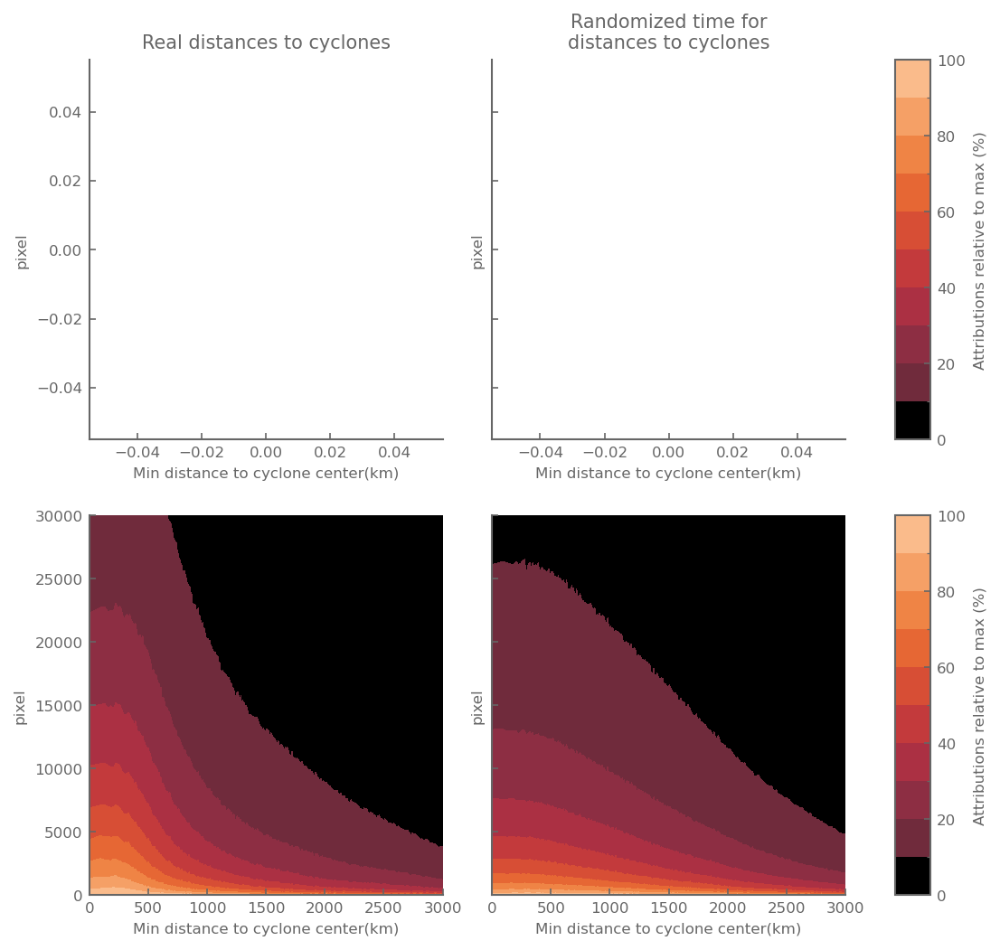

In [50]:
# ds_lrp_total.plot.contourf(levels=np.arange(0,100,10), cmap='Reds')
fig, axs = plt.subplots(2,3,figsize=(8,8), width_ratios=[10,10,1],)
cmap= sns.color_palette('icefire', n_colors=25)[-10:]
cmap[0] = [0,0,0]
(ds_lrp_total.clip(0)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(0,101,10), colors=cmap, yincrease=True, ax=axs[0,0], cbar_ax=axs[0,2])
(ds_lrp_total.clip(0)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(0,101,10), colors=cmap, yincrease=True, ax=axs[1,0], cbar_ax=axs[0,2])
(ds_lrp_fakedist_total.clip(0)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(0,101,10), colors=cmap, yincrease=True, ax=axs[0,1], cbar_ax=axs[1,2])
(ds_lrp_fakedist_total.clip(0)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(0,101,10), colors=cmap, yincrease=True, ax=axs[1,1], cbar_ax=axs[1,2])

# (ds_lrp_total.clip(0)).isel(distance_to_cyclone=slice(0,-1)).plot.contour(levels=np.arange(10,101,10), colors='.6', yincrease=True, ax=axs[0,0], alpha=.5)
# (ds_lrp_total.clip(0)).isel(distance_to_cyclone=slice(0,-1)).plot.contour(levels=np.arange(10,101,10), colors='.6', yincrease=True, ax=axs[1,0], alpha=.5)
# (ds_lrp_fakedist_total.clip(0)).isel(distance_to_cyclone=slice(0,-1)).plot.contour(levels=np.arange(10,101,10), colors='.6', yincrease=True, ax=axs[0,1], alpha=.5)
# (ds_lrp_fakedist_total.clip(0)).isel(distance_to_cyclone=slice(0,-1)).plot.contour(levels=np.arange(10,101,10), colors='.6', yincrease=True, ax=axs[1,1], alpha=.5)

axs[1,0].set_ylim(0,30000)
axs[1,0].set_xlim(0,3000)
axs[1,1].set_ylim(0,30000)
axs[1,1].set_xlim(0,3000)

axs[0,1].tick_params(labelleft=False)
axs[1,1].tick_params(labelleft=False)
# axs[0,1].set_ylim(0,300000)
# axs[0,1].set_xlim(0,15000)
for k,ax in enumerate(axs.flat):
    if k%3==2:
        ax.set_ylabel('Attributions relative to max (%)')
        continue
    ax.set(xlabel='Min distance to cyclone center(km)')
axs[0,0].set_title('Real distances to cyclones')
axs[0,1].set_title('Randomized time for\ndistances to cyclones')

# axs[0,0].indicate_inset(inset_ax=axs[1,0], zorder=100, edgecolor='blue')
# axs[0,1].indicate_inset(inset_ax=axs[1,1], zorder=100)
# ax.set_ylim(0,20)
# ds_lrp_fakedist_total.plot.contour(levels=np.arange(10,100,10))

In [ ]:
df_ = ds_.to_dataframe().reset_index().sort_values('lrp_normed').reset_index().reset_index().query("lrp_normed>=0")
df_['lrp_bins'] = pd.cut(df_['lrp_normed']*100, np.arange(0,100.1,10))#.map(lambda x:x.right)
ds_dist_all = df_.groupby('lrp_bins').quantile(np.arange(0,1.01,.01)).dist_to_all_cycs.to_xarray().rename(level_1='pixel').T

df_ = ds_.to_dataframe().reset_index().sort_values('lrp_normed').reset_index().reset_index().query("lrp_normed>=0")
df_['lrp_bins'] = pd.cut(df_['lrp_normed']*100, np.arange(0,100.1,10))#.map(lambda x:x.right)
ds_fakedist_all = df_.groupby('lrp_bins').quantile(np.arange(0,1.01,.01)).fake_dist.to_xarray().rename(level_1='pixel').T

# ds_dist=ds_dist.assign_coords(pixel=100*ds_dist.pixel)
# ds_dist=ds_dist.assign_coords(lrp_bins=100*ds_dist.lrp_bins)

In [ ]:
df__ = df_.query("lrp_normed>.5")[['dist_to_all_cycs','fake_dist']].stack().reset_index()
df__.columns = ['index','distance_type','distance']
sns.displot(df__, x='distance', hue='distance_type', element="step",  height=3, palette=['C3','.3'], bins=np.arange(0,4001,50), aspect=1.5, zorder=100, legend=False)
plt.grid(linestyle='-', zorder=0, alpha=.3)
plt.xlabel('Min distance to cyclone centers (km)')
plt.legend(['True distance to cyclone','Randomized times'])
plt.xlim(0,4000)

# Classify important cyclones

In [73]:
import numpy as np
import xarray as xr
import geopandas as gpd
from shapely.geometry import shape
from shapely.ops import unary_union
from rasterio.features import shapes
from rasterio.transform import Affine

def _pick_coord(da, candidates):
    for c in candidates:
        if c in da.coords:
            return c
    raise ValueError(f"Could not find any of {candidates} in DataArray coords.")

def _affine_from_1d_coords(x, y):
    """
    Build an affine transform that maps array indices to the coordinate space
    when x,y are 1D coordinates giving cell centers on a regular grid.
    """
    # mean spacing (assumes ~regular spacing)
    dx = float(np.mean(np.diff(x)))
    dy = float(np.mean(np.diff(y)))

    # if latitude is descending (common), dy will be negative; we want a transform
    # whose scale has positive dx and *negative* dy so row index increases downward
    # and y decreases.
    # Top-left corner of the [0,0] pixel (half a pixel up/left from the first centers)
    x0 = x[0] - dx / 2.0
    y0 = y[0] + dy / 2.0  # note dy could be negative

    # Build transform: translate to top-left corner, then scale
    # Scale uses dx and dy as-is; if dy is negative (lat descending), the sign encodes that.
    return Affine.translation(x0, y0) * Affine.scale(dx, dy)

def mask_to_gdf(mask_da, assume_crs="EPSG:4326", dissolve=True, simplify=None):
    """
    Convert a boolean xarray.DataArray mask on a regular grid to a GeoDataFrame of polygons.
    
    Parameters
    ----------
    mask_da : xr.DataArray (boolean)
        Dimensions must include either (lat, lon) or (y, x) with 1D coords.
    assume_crs : str or None
        CRS to use if none is found on the DataArray (default EPSG:4326).
    dissolve : bool
        If True, merges touching/overlapping polygons into multipart regions.
    simplify : float or None
        If set, applies shapely .simplify(tolerance) in the mask’s CRS units.
    """
    if mask_da.dtype != bool:
        raise ValueError("mask_da must be boolean (True for inside).")

    # Identify coord names
    y_name = _pick_coord(mask_da, ["lat", "latitude", "y"])
    x_name = _pick_coord(mask_da, ["lon", "longitude", "x"])
    y = mask_da[y_name].values
    x = mask_da[x_name].values
    if y.ndim != 1 or x.ndim != 1:
        raise ValueError("This method requires 1D regular coords for x and y.")

    # Build affine
    transform = _affine_from_1d_coords(x, y)

    # Rasterio wants 0/1 integers and an optional mask
    img = mask_da.astype(np.uint8).values
    shps = shapes(img, mask=img == 1, transform=transform)

    geoms = [shape(geom) for geom, val in shps if val == 1]

    if not geoms:
        return gpd.GeoDataFrame(geometry=[], crs=assume_crs)

    gdf = gpd.GeoDataFrame(geometry=geoms, crs=getattr(getattr(mask_da, "rio", None), "crs", None) or assume_crs)

    # Clean geometry (fix slivers) and optionally dissolve/simplify
    gdf["geometry"] = gdf.buffer(0)

    if dissolve:
        merged = unary_union(gdf.geometry)
        gdf = gpd.GeoDataFrame(geometry=[merged], crs=gdf.crs).explode(index_parts=False).reset_index(drop=True)

    if simplify:
        gdf["geometry"] = gdf.geometry.simplify(simplify, preserve_topology=True)

    # Drop empty/invalid geometries
    gdf = gdf[~gdf.geometry.is_empty & gdf.geometry.is_valid].reset_index(drop=True)
    return gdf

regions_mask = xr.open_dataset('/home/rogui7909/code/predict_rain_norway/RECCAP2_region_masks_all.nc')
# change 0-380 to -180 180
regions_mask = regions_mask.assign_coords(lon=(((regions_mask.lon + 180) % 360) - 180)).sortby('lon')
regions_mask = regions_mask.where(regions_mask>0).sel(lat=slice(-10,90))


In [74]:
colors = sns.color_palette('Blues_r', n_colors=2)[:2] +sns.color_palette('Greens_r',n_colors=3)[:3]+ sns.color_palette('Oranges_r',)[1:2]+sns.color_palette('Purples_r')[1:2]

sns.color_palette(colors)

[(0.21568627450980393, 0.5294117647058824, 0.7542483660130719),
 (0.6718954248366014, 0.8143790849673203, 0.9006535947712418),
 (0.1381776239907728, 0.5460822760476739, 0.2713264129181084),
 (0.4576701268742791, 0.769919261822376, 0.46502114571318726),
 (0.7831603229527105, 0.9148327566320645, 0.7558938869665514),
 (0.8782929642445213, 0.31990772779700116, 0.024405997693194927),
 (0.440722798923491, 0.36772010765090346, 0.6653902345251825)]

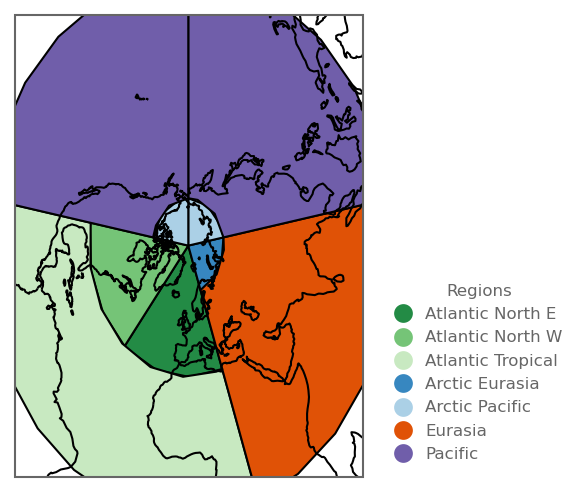

In [81]:
from shapely.ops import unary_union

# gdf_atl = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon<-100), dissolve=False)
gdf_pac_arctic = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where(((regions_mask.lon<-100)|(regions_mask.lon>100))&(regions_mask.lat>66))==1, dissolve=False)
# gdf_pac_NA = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon<-100)&(regions_mask.lat<=66))==1, dissolve=False)
# gdf_pac_asia = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>100)&(regions_mask.lat<=66))==1, dissolve=False)
gdf_pac_oce = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where(((regions_mask.lon<-100)|(regions_mask.lon>100))&(regions_mask.lat<=66))==1, dissolve=False)

gdf_NatlEcont = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>-40)&(regions_mask.lon<20)&(regions_mask.lat>30))==1, dissolve=False)
gdf_NatlWcont = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>-100)&(regions_mask.lon<-40)&(regions_mask.lat>30))==1, dissolve=False)
gdf_tropatl = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>-100)&(regions_mask.lon<20)&(regions_mask.lat<30))==1, dissolve=False)
gdf_eurasia_cont = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>20)&(regions_mask.lon<100)&(regions_mask.lat<=66))==1, dissolve=False)
gdf_eurasia_oce = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>20)&(regions_mask.lon<100)&(regions_mask.lat>66))==1, dissolve=False)

# colors = sns.color_palette('Blues_r')[:5] + sns.color_palette('Oranges_r')[:2]+ sns.color_palette('Purples_r')[:3]+sns.color_palette('Greens_r')[:2]
colors = sns.color_palette('Greens_r',n_colors=3)[:3]+ sns.color_palette('Blues_r', n_colors=2)[:2] +sns.color_palette('Oranges_r',)[1:2]+sns.color_palette('Purples_r')[1:2]

polygons_masks = gpd.GeoDataFrame(geometry=[
                                            unary_union(gdf_NatlEcont.geometry),
                                            unary_union(gdf_NatlWcont.geometry),
                                            unary_union(gdf_tropatl.geometry),
                                            unary_union(gdf_eurasia_oce.geometry),
                                            unary_union(gdf_pac_arctic.geometry),
                                            unary_union(gdf_eurasia_cont.geometry),
                                            unary_union(gdf_pac_oce.geometry),
                                #  unary_union(gdf_atl_midlat.geometry),
                                #  unary_union(gdf_atl_trop.geometry),
                                #  unary_union(gdf_pac.geometry),
                                #  unary_union(gdf_arctic.geometry),
                                #  unary_union(gdf_med.geometry),
                                #  unary_union(gdf_land_NA.geometry),
                                #  unary_union(gdf_land_eurasia.geometry),
                                #  unary_union(gdf_land_trop),
                                 
                                 
                                 ], crs=gdf_pac_arctic.crs,
                                 index = [
                                          'Atlantic North E',
                                           'Atlantic North W', 
                                          'Atlantic Tropical', 
                                          'Arctic Eurasia',
                                          'Arctic Pacific',
                                          'Eurasia', 
                                          'Pacific'
                                        
                                        ])
polygons_masks.index = polygons_masks.index.rename('poly_id')
# polygons_masks = polygons_masks.sort_index()
# polygons_masks = polygons_masks.loc[['Pacific','North Atlantic W','North Atlantic E', 'Tropical Atlantic', 'Continental Eurasia'
#                 #                      'Atlantic Midlat','Atlantic North',  'Atlantic Tropics', 
#                 #    'Continents Eurasia', 'Continents North America',
#                 #    'Continents Tropics', 'Mediterranean Sea', 'Pacific',
#                    ]]
fig, ax = plt.subplots(figsize=(4,4), subplot_kw=dict(projection=ccrs.NorthPolarStereo(0, 70)))

polygons_masks.plot(edgecolor="k", color=colors, transform=ccrs.PlateCarree(), ax=ax, legend=True)
ax.set_extent((0,360,0,90), crs=ccrs.PlateCarree())
ax.coastlines()
polygons_masks['domain'] = polygons_masks.reset_index().poly_id.str.split(' ', expand=True).iloc[:,0].values
polygons_masks['colors'] = colors
handles = []
for poly_id, row in polygons_masks.iterrows():
    handles.append(plt.Line2D([0], [0], marker='o', color='w', label=poly_id,
                          markerfacecolor=row.colors, markersize=10))
ax.legend(handles=handles, title='Regions', loc='lower left', bbox_to_anchor=(1.05, 0))
# ax.legend()

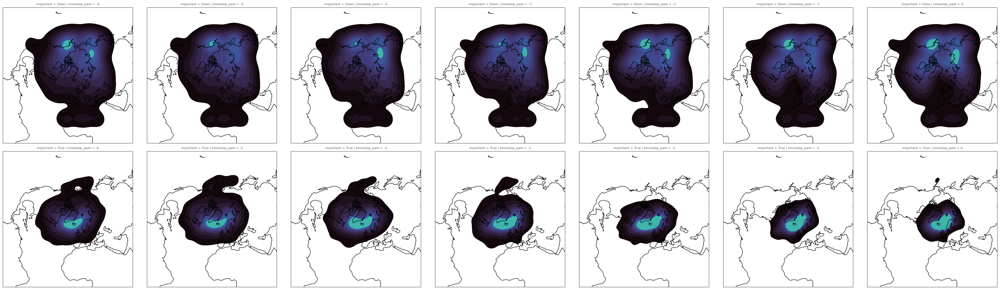

In [82]:
df_important = important_cyclones.rename('important').to_dataframe().dropna().reset_index()
df_important['date'] = df_important.time_of_event + df_important.timestep_past*pd.Timedelta('1D')
df_important = df_important.set_index(['date','track_id'])
df_important[['lon','lat','x','y','msl']]=daily_cycs.groupby(['date','track_id']).first().loc[df_important.index][['lon','lat','x','y','msl']]
plot = sns.displot(df_important, x='x',y='y', kind='kde', fill=True, col='timestep_past',row='important', cmap='mako',transform=proj, facet_kws=dict(subplot_kws=dict(projection=proj)))
for ax in plot.axes.flat:
    ax.coastlines()

In [83]:
cyclones_gdf = gpd.GeoDataFrame(
    df_important.reset_index(),
    geometry=gpd.points_from_xy(df_important["lon"], df_important["lat"]),
    crs="EPSG:4326"  # adjust if your cyclones are in another CRS
)

if polygons_masks.crs is None:
    polygons_masks = polygons_masks.set_crs("EPSG:4326")  # if appropriate
cyclones_gdf = cyclones_gdf.to_crs(polygons_masks.crs)

joined = gpd.sjoin(cyclones_gdf, polygons_masks.reset_index()[["poly_id", "geometry"]],
                   how="left", predicate="within") 
unmatched = joined[joined["poly_id"].isna()].drop(columns=["index_right"])

if not unmatched.empty:
    # Optional: project to a metric CRS for meaningful distances (meters)
    # Example for Norway: EPSG:5972 (ETRS89 / TM35FIN(N,E)) or choose a local UTM zone
    metric_crs = "EPSG:3857"
    polygons_m = polygons_masks.to_crs(metric_crs).reset_index()
    unmatched_m = unmatched.to_crs(metric_crs)

    nearest = gpd.sjoin_nearest(
        unmatched_m,
        polygons_m[["poly_id", "geometry"]],
        how="left",
        distance_col="dist_m"  # distance in CRS units
    ).to_crs(polygons_masks.crs)

    # Optionally filter by a maximum distance (e.g., 50 km)
    max_dist_m = 50_000
    nearest.loc[nearest["dist_m"] > max_dist_m, "poly_id"] = None

    # merge back
    joined.loc[unmatched.index, ["poly_id"]] = nearest.set_index(unmatched.index)["poly_id"]
# joined['day'] = pd.to_datetime(joined.day)
joined['domain'] = joined.poly_id.str.split(' ', expand=True).iloc[:,0].values
joined.poly_id = pd.Categorical(joined.poly_id, 
                      categories=polygons_masks.index.tolist(),
                      ordered=True)

joined = joined.sort_values('poly_id')

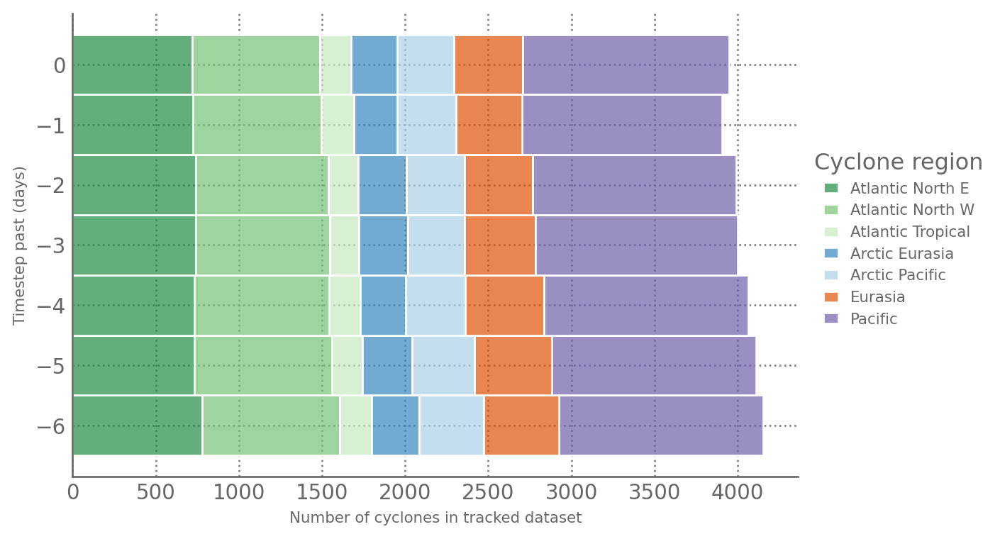

In [84]:

colors = sns.color_palette('Blues_r')[:2] +sns.color_palette('Greens_r')[:3]+ sns.color_palette('Oranges_r')[1:2]+sns.color_palette('Purples_r')[:3]

(so.Plot(joined, color='poly_id',y='timestep_past')
 .add(so.Bars(), so.Count(), so.Stack(), orientation='y')
 .scale(color=polygons_masks.colors.to_dict())
#  .facet(col='timestep_past')

.layout(size=(6,4))
.label(y='Timestep past (days)', x='Number of cyclones in tracked dataset', color='Cyclone region')
 .theme(plt.style.library["robin"])
 .theme({'axes.grid':True, 'grid.color':'.5'})
)

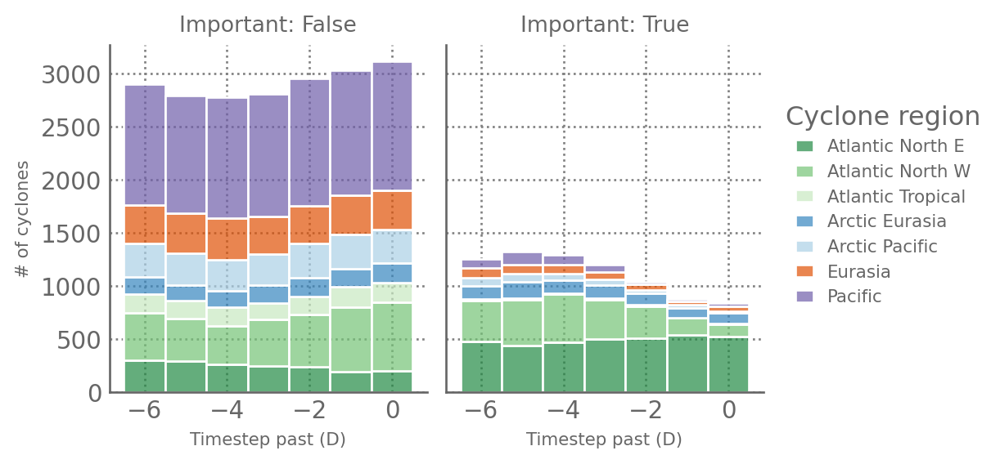

In [85]:
(so.Plot(joined.sort_values('poly_id'), x='timestep_past', color='poly_id')
        .add(so.Bars(), so.Count(),so.Stack(), orientation='y')
        .facet(col='important')
         .scale(color=so.Nominal(polygons_masks.colors.to_dict()),
        )
        .layout(size=(5,3))
        .theme(plt.style.library["robin"])
        .theme({'axes.grid':True, 'grid.color':'.5'})
        .label(col='Important:', y='# of cyclones', x='Timestep past (D)', color='Cyclone region')
 
 )

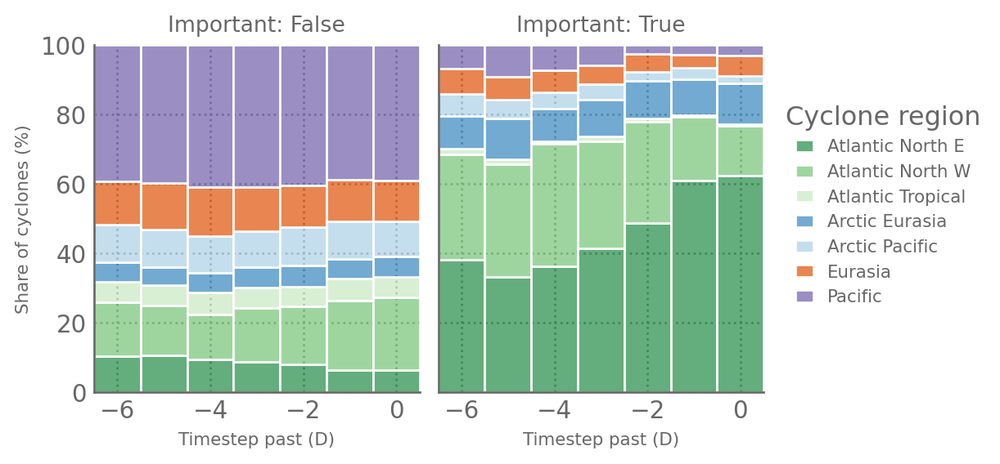

In [86]:
(so.Plot(joined.sort_values('poly_id'), x='timestep_past', color='poly_id')
        .add(so.Bars(), so.Count(),so.Norm(func="sum", by=["x"],percent=True),so.Stack(), orientation='y')
        .facet(col='important')
         .scale(color=so.Nominal(polygons_masks.colors.to_dict())
        )
        .layout(size=(5,3))
        .theme(plt.style.library["robin"])
        .theme({'axes.grid':True, 'grid.color':'.5'})
        .label(col='Important:', y='Share of cyclones (%)', x='Timestep past (D)', color='Cyclone region')
        .limit(x=(-6.5,.5), y=(0,100))
 )
 

/tmp/ipykernel_241202/3958419728.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = (joined.groupby(['timestep_past','poly_id',]).count())
/tmp/ipykernel_241202/3958419728.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = (joined.groupby(['timestep_past','poly_id','important']).count())
/tmp/ipykernel_241202/3958419728.py:17: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = (joined.groupby(['timestep_pa

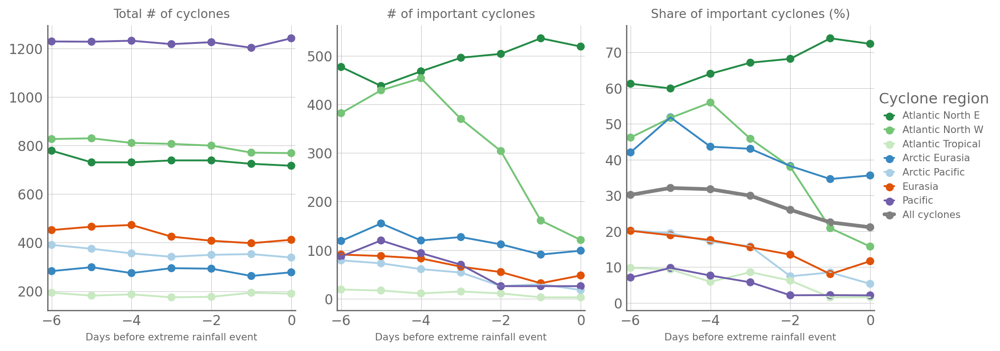

In [102]:
df_ = (joined.groupby(['timestep_past','poly_id',]).count())
df_total = df_.x.rename('metric').reset_index()
df_total['data_type'] = 'Total # of cyclones'
df_total_sum = df_total.groupby(['timestep_past']).metric.sum().reset_index()
df_total_sum['poly_id'] = 'All cyclones'
df_total_sum['data_type'] = df_total.data_type
# df_total = pd.concat([df_total, df_total_sum])

df_ = (joined.groupby(['timestep_past','poly_id','important']).count())
df_important = df_.x.rename('metric').reset_index().query("important").reset_index().iloc[:,1:]
df_important['data_type'] = '# of important cyclones'
df_important_sum = df_important.groupby(['timestep_past']).metric.sum().reset_index()
df_important_sum['poly_id'] = 'All cyclones'
df_important_sum['data_type'] = df_important.data_type
# df_important = pd.concat([df_important, df_important_sum])

df_ = (joined.groupby(['timestep_past','poly_id','important']).count()/joined.groupby(['timestep_past','poly_id',]).count())*100
df_proba = df_.x.rename('metric').reset_index().query("important").reset_index().iloc[:,1:]
df_proba['data_type'] = 'Share of important cyclones (%)'
df_proba_mean = (100*df_important_sum.set_index(['poly_id','timestep_past']).metric/df_total_sum.set_index(['poly_id','timestep_past']).metric).reset_index()
df_proba_mean['data_type'] = 'Share of important cyclones (%)'
df_proba = pd.concat([df_proba, df_proba_mean])

df_ = pd.concat([df_total,  df_important, df_proba ], axis=0).iloc[:,:-1]
df_=df_.set_index(['timestep_past','poly_id']).reset_index()



colors_dict = polygons_masks.colors.to_dict()
colors_dict.update({'All cyclones':'.5'})
(so.Plot(df_,x='timestep_past', y='metric', color='poly_id', linewidth='poly_id')
        .add(so.Line())
        .add(so.Dot())
        .theme(plt.style.library["robin"])
        .facet(col='data_type')
        .theme({'axes.grid':True, 'grid.color':'.7', 'grid.linestyle':'-', 'grid.linewidth':.3})
        .limit(x=(-6.1,0.1))
        .share(y=False)
        .label(color='Cyclone region', x='Days before extreme rainfall event', y='')
        .scale(color=so.Nominal(colors_dict),
               linewidth=[1.5,1.5,1.5,1.5,1.5,1.5,1.5,3],
            )
        .layout(size=(10,4))
)

# df_ = (joined.groupby(['timestep_past','poly_id',]).count())
# df_ = df_.x.rename('# of important cyclones').reset_index()
# (so.Plot(df_,x='timestep_past', y='# of important cyclones', color='poly_id', )
#     .add(so.Line(marker='o'))
#      .theme(plt.style.library["robin"])
#     .theme({'axes.grid':True, 'grid.color':'.7', 'grid.linestyle':'-', 'grid.linewidth':.3})
#     .limit(x=(-6.1,0.1))
#     .label(color='Cyclone region', x='Timestep in the past (days)')
#     .scale(color=so.Nominal(polygons_masks.colors.to_dict(),),
#         )
#     .layout(size=(4,4))
# )

In [91]:
joined

,date,track_id,n_cyclone,timestep_past,time_of_event,important,lon,lat,x,y,msl,geometry,index_right,poly_id,domain
0,1999-11-18,427514.0,0,-6,1999-11-24,True,15.444814,75.352169,4.247939e+05,-1.537507e+06,100889.370430,POINT (15.44481 75.35217),0,Atlantic North E,Atlantic
16990,2005-01-08,534761.0,10,-4,2005-01-12,True,-11.269780,67.583728,-4.804617e+05,-2.411094e+06,96453.262486,POINT (-11.26978 67.58373),0,Atlantic North E,Atlantic
5090,2008-06-04,606182.0,3,-6,2008-06-10,True,0.359825,60.138462,2.076906e+04,-3.307065e+06,98724.031884,POINT (0.35982 60.13846),0,Atlantic North E,Atlantic
16994,2005-02-06,536260.0,10,-4,2005-02-10,True,-20.251849,86.725654,-1.228109e+05,-3.328605e+05,98491.435762,POINT (-20.25185 86.72565),0,Atlantic North E,Atlantic
16997,2005-04-07,539863.0,10,-4,2005-04-11,True,1.513085,59.647571,8.882741e+04,-3.362833e+06,98205.528407,POINT (1.51309 59.64757),0,Atlantic North E,Atlantic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17564,2010-04-15,644941.0,10,-2,2010-04-17,True,153.408185,52.210257,1.899220e+06,3.794007e+06,97271.387083,POINT (153.40819 52.21026),6,Pacific,Pacific
17566,2010-09-09,653679.0,10,-2,2010-09-11,False,165.562843,56.808909,9.213501e+05,3.578785e+06,98093.965383,POINT (165.56284 56.80891),6,Pacific,Pacific
17567,2010-09-12,653503.0,10,-2,2010-09-14,False,178.087444,51.893695,1.428755e+05,4.278630e+06,98378.130728,POINT (178.08744 51.89369),6,Pacific,Pacific
17545,2008-11-24,615820.0,10,-2,2008-11-26,False,-134.808537,56.470361,-2.650084e+06,2.632431e+06,98785.762998,POINT (-134.80854 56.47036),6,Pacific,Pacific


/tmp/ipykernel_241202/1405096585.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = (joined_strong.groupby(['timestep_past','poly_id',]).count())
/tmp/ipykernel_241202/1405096585.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = (joined_strong.groupby(['timestep_past','poly_id','important']).count())
/tmp/ipykernel_241202/1405096585.py:18: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = (joined_strong

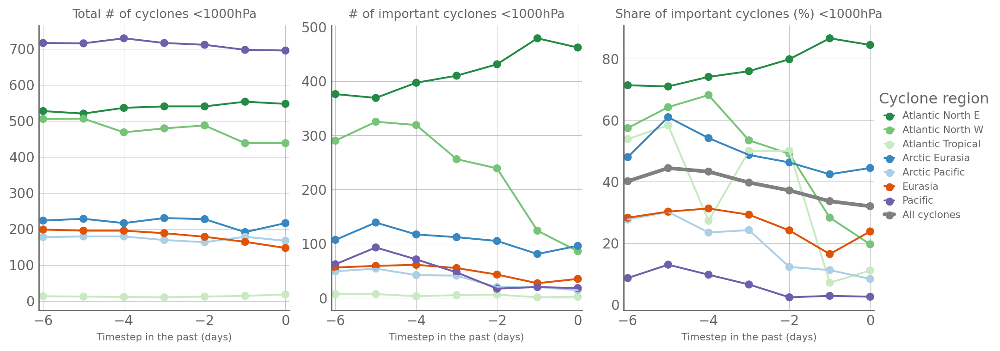

In [101]:
joined_strong = joined.query("msl<=100000")
df_ = (joined_strong.groupby(['timestep_past','poly_id',]).count())
df_total = df_.x.rename('metric').reset_index()
df_total['data_type'] = 'Total # of cyclones <1000hPa'
df_total_sum = df_total.groupby(['timestep_past']).metric.sum().reset_index()
df_total_sum['poly_id'] = 'All cyclones'
df_total_sum['data_type'] = df_total.data_type
# df_total = pd.concat([df_total, df_total_sum])

df_ = (joined_strong.groupby(['timestep_past','poly_id','important']).count())
df_important = df_.x.rename('metric').reset_index().query("important").reset_index().iloc[:,1:]
df_important['data_type'] = '# of important cyclones <1000hPa'
df_important_sum = df_important.groupby(['timestep_past']).metric.sum().reset_index()
df_important_sum['poly_id'] = 'All cyclones'
df_important_sum['data_type'] = df_important.data_type
# df_important = pd.concat([df_important, df_important_sum])

df_ = (joined_strong.groupby(['timestep_past','poly_id','important']).count()/joined_strong.groupby(['timestep_past','poly_id',]).count())*100
df_proba = df_.x.rename('metric').reset_index().query("important").reset_index().iloc[:,1:]
df_proba['data_type'] = 'Share of important cyclones (%) <1000hPa'
df_proba_mean = (100*df_important_sum.set_index(['poly_id','timestep_past']).metric/df_total_sum.set_index(['poly_id','timestep_past']).metric).reset_index()
df_proba_mean['data_type'] = 'Share of important cyclones (%) <1000hPa'
df_proba = pd.concat([df_proba, df_proba_mean])

df_ = pd.concat([df_total,  df_important, df_proba ], axis=0).iloc[:,:-1]
df_=df_.set_index(['timestep_past','poly_id']).reset_index()



colors_dict = polygons_masks.colors.to_dict()
colors_dict.update({'All cyclones':'.5'})
(so.Plot(df_,x='timestep_past', y='metric', color='poly_id', linewidth='poly_id')
        .add(so.Line())
        .add(so.Dot())
        .theme(plt.style.library["robin"])
        .facet(col='data_type')
        .theme({'axes.grid':True, 'grid.color':'.7', 'grid.linestyle':'-', 'grid.linewidth':.3})
        .limit(x=(-6.1,0.1))
        .share(y=False)
        .label(color='Cyclone region', x='Timestep in the past (days)', y='')
        .scale(color=so.Nominal(colors_dict),
               linewidth=[1.5,1.5,1.5,1.5,1.5,1.5,1.5,3],
            )
        .layout(size=(10,4))
)

# df_ = (joined_strong.groupby(['timestep_past','poly_id',]).count())
# df_ = df_.x.rename('# of important cyclones').reset_index()
# (so.Plot(df_,x='timestep_past', y='# of important cyclones', color='poly_id', )
#     .add(so.Line(marker='o'))
#      .theme(plt.style.library["robin"])
#     .theme({'axes.grid':True, 'grid.color':'.7', 'grid.linestyle':'-', 'grid.linewidth':.3})
#     .limit(x=(-6.1,0.1))
#     .label(color='Cyclone region', x='Timestep in the past (days)')
#     .scale(color=so.Nominal(polygons_masks.colors.to_dict(),),
#         )
#     .layout(size=(4,4))
# )

In [ ]:
df_.set_index(['timestep_past','poly_id']).reset_index()

In [ ]:
df_

In [ ]:
df_important.reset_index().iloc[:,1:]

In [ ]:
df_

In [ ]:
pd.concat([df_total, df_important, df_proba])

In [ ]:
df_ = (joined.groupby(['timestep_past','poly_id','important']).count())
df_ = df_.x.rename('# of important cyclones').reset_index().query("important")
(so.Plot(df_,x='timestep_past', y='# of important cyclones', color='poly_id', )
    .add(so.Line(marker='o'))
     .theme(plt.style.library["robin"])
    .theme({'axes.grid':True, 'grid.color':'.7', 'grid.linestyle':'-', 'grid.linewidth':.3})
    .limit(x=(-6.1,0.1))
    .label(color='Cyclone region', x='Timestep in the past (days)')
    .scale(color=so.Nominal(polygons_masks.colors.to_dict(),),
        )
    .layout(size=(4,4))
)

In [ ]:
df_

In [ ]:
df_ = (joined.groupby(['timestep_past','domain','important']).count()/joined.groupby(['timestep_past','domain',]).count())
df_ = df_.x.rename('detection_probability').reset_index().query("important")
(so.Plot(df_,x='timestep_past', y='detection_probability', color='domain', )
    .add(so.Line(marker='o'))
     .theme(plt.style.library["robin"])
    .theme({'axes.grid':True, 'grid.color':'.7', 'grid.linestyle':'-', 'grid.linewidth':.3})
    .limit(y=(0,1), x=(-6.1,0.1))
    .label(color='Cyclone region')
    # .scale(color=so.Nominal([colors[0],colors[6],colors[9], colors[0]],),
    #     )
    .layout(size=(5,5))
)

In [ ]:
df_ = joined.groupby(['timestep_past','poly_id','important', pd.cut(joined.msl, np.arange(940,1030,10))]).count()
df_ = df_.where(df_>2)
df_ = df_/joined.groupby(['timestep_past','poly_id', pd.cut(joined.msl, np.arange(940,1030,10))]).count()
df_ = df_.x.rename('detection_probability').reset_index().query("important")
df_['msl'] = [k.mid for k in df_.msl]
(so.Plot(df_,x='msl', y='detection_probability', color='timestep_past', )
    .add(so.Line(marker='o'))
    .facet(col='poly_id', wrap=6)
     .theme(plt.style.library["robin"])
    .theme({'axes.grid':True, 'grid.color':'.7', 'grid.linestyle':'-', 'grid.linewidth':.3})
    # .limit(y=(0,1), x=(-6.1,0.1))
    .label(color='Timestep past (d)', x='Minimum SLP in cyclone (hPa)', y='Probability of attribution tracking the cyclone')
    .layout(size=(12,6))
)

In [ ]:
df_

In [ ]:
df_count

In [ ]:
df_count = joined.groupby(['poly_id','important', pd.cut(joined.msl, np.arange(920,1030,10))]).count()

df_important = df_count.domain.reset_index().query("important").set_index(['poly_id', 'msl']).domain
df_total = df_count.domain.reset_index().groupby(['poly_id', 'msl']).domain.sum()
df_portion = pd.DataFrame((df_important/df_total).rename('detection_probability'))
df_portion['count_important'] = df_important
df_portion['count_total'] = df_total
df_portion = df_portion.reset_index()

df_portion['msl_mid'] = [k.mid for k in df_portion.msl]
df_portion['domain'] = df_portion.poly_id.str.split(' ', expand=True).iloc[:,0]
df_portion['count_text'] = df_portion['count_total'].apply(lambda x:f"{x:.0f}")
df_portion['count_bin'] = pd.cut(df_portion['count_total'], [0,10,50,100,500,1000,2000])
df_portion['count_bin'] = [f"{k.left:.0f}-{k.right:.0f}" if not type(k)==float else np.nan for k in  df_portion['count_bin'] ]

(so.Plot(df_portion,x='msl_mid', y='detection_probability', color= 'poly_id', text='count_text')
    # .add(so.Line(alpha=.3))
    .add(so.Bar(alpha=.4, width=.8),edgewidth='count_bin',edgestyle='count_bin')
    # .add(so.Dot(), pointsize='count_bin',marker='count_bin', data=df_portion.loc[df_portion['count']>50])
    .add(so.Text(valign="bottom",))
    .facet(col='poly_id',wrap=3, 
           order=['Atlantic North E','Atlantic North W', 'Atlantic Tropical', 
                  'Arctic Eurasia', 'Arctic Pacific',  'Eurasia continents',
                  'Pacific Asia', 'Pacific North America', 'Pacific ocean',])
     .theme(plt.style.library["robin"])
    .theme({'axes.grid':True, 'grid.color':'.7', 'grid.linestyle':'-', 'grid.linewidth':.3, 'figure.dpi':200})
    # .limit(y=(0,1), x=(-6.1,0.1))
    .label(color='Cyclone region', x='Minimum SLP in cyclone (hPa)', y='Probability of attribution tracking the cyclone',
           pointsize='# of cyclones')
    .scale(color=so.Nominal(colors,),
           pointsize={
                      '0-10':0, 
                      '10-50':2, 
                      '50-100':4, 
                      '100-500':6, 
                      '500-1000':8, 
                      '1000-2000':10},
          edgewidth={
                      '0-10':0, 
                      '10-50':1, 
                      '50-100':2, 
                      '100-500':2, 
                      '500-1000':3, 
                      '1000-2000':4},
          edgestyle=so.Nominal({
                      '0-10':'solid', 
                      '10-50':':', 
                      '50-100':':', 
                      '100-500':'--', 
                      '500-1000':'solid', 
                      '1000-2000':'solid'},
                      order=['0-10','10-50','50-100','100-500','500-1000','1000-2000'],)
        #  linewidth=so.
        )
    .layout(size=(14,10),)
    .limit(y=(0,1.1))
).plot()

In [ ]:
df_count_map = joined.groupby([pd.cut(joined.lon, np.arange(-180,181,10)), pd.cut(joined.lat, np.arange(0,91,10)), 'important']).count().domain.rename('count_cycs').reset_index()
df_count_map['lon_mid'] = [k.mid for k in df_count_map.lon]
df_count_map['lat_mid'] = [k.mid for k in df_count_map.lat]
df_count_map['important']= df_count_map.important.astype(str)
ds_count_map = df_count_map.pivot(index=['lat_mid','lon_mid'], columns='important', values='count_cycs').fillna(0).to_xarray()
ds_count_map = ds_count_map.rename({'False':'not_important', 'True':'important'})
ds_count_map['total'] = ds_count_map.important + ds_count_map.not_important
ds_count_map['detection_probability'] = (ds_count_map.important / ds_count_map.total).fillna(0)
# df_count_map.pivot(columns=['important']['important'].unstack()
plot = ds_count_map.detection_probability.plot(subplot_kws = dict(projection=proj), transform=ccrs.PlateCarree(), robust=True, cmap='mako', size=6, aspect=1.2)
plot.axes.coastlines()

In [ ]:
joined.x.min()/1e7

In [ ]:

df_count_map = joined.groupby([pd.cut(joined.x, np.arange(-1e7,5e6,5e5)), pd.cut(joined.y, np.arange(-1e7,5e6,5e5)), 'important']).count().domain.rename('count_cycs').reset_index()
df_count_map['x_mid'] = [k.mid for k in df_count_map.x]
df_count_map['y_mid'] = [k.mid for k in df_count_map.y]
df_count_map['important']= df_count_map.important.astype(str)
ds_count_map = df_count_map.pivot(index=['y_mid','x_mid'], columns='important', values='count_cycs').fillna(0).to_xarray()
ds_count_map = ds_count_map.rename({'False':'not_important', 'True':'important'})
ds_count_map['total'] = ds_count_map.important + ds_count_map.not_important
ds_count_map['detection_probability'] = (ds_count_map.important / ds_count_map.total).fillna(0)
# df_count_map.pivot(columns=['important']['important'].unstack()
plot = ds_count_map.total.plot(subplot_kws = dict(projection=proj), transform=proj, robust=False, cmap='mako', size=6, aspect=1.2, 
                                            #    levels = np.arange(0,1.01,.1)
                                            levels = [0,10,20,40,60,80,100,200,300,400,500]
                                               )
plot.axes.coastlines(color='.7', lw=.5)

In [ ]:
joined

In [ ]:

df_count_map = joined.groupby([pd.cut(joined.x, np.arange(-1e7,5e6,10e5)), pd.cut(joined.y, np.arange(-1e7,5e6,10e5)), 'important','timestep_past',]).count().domain.rename('count_cycs').reset_index()
df_count_map['x_mid'] = [k.mid for k in df_count_map.x]
df_count_map['y_mid'] = [k.mid for k in df_count_map.y]
df_count_map['important']= df_count_map.important.astype(str)
ds_count_map = df_count_map.pivot(index=['y_mid','x_mid', 'timestep_past'], columns='important', values='count_cycs').fillna(0).to_xarray()
ds_count_map = ds_count_map.rename({'False':'not_important', 'True':'important'})
ds_count_map['total'] = ds_count_map.important + ds_count_map.not_important
ds_count_map['detection_probability'] = 100*(ds_count_map.important / ds_count_map.total).fillna(0)
# df_count_map.pivot(columns=['important']['important'].unstack()
# plot = ds_count_map.detection_probability.where(ds_count_map.total>10).fillna(0).plot(subplot_kws = dict(projection=proj), transform=proj, robust=False, cmap='mako', size=6, aspect=1.2, 
#                                                levels = np.arange(0,1.01,.1)
#                                             # levels = [0,10,20,40,60,80,100,200,300,400,500]
#                                                )
# plot.axes.coastlines(color='.7', lw=.5)

plot = ds_count_map.detection_probability.where(ds_count_map.total>10).fillna(0).plot(subplot_kws = dict(projection=proj), transform=proj, robust=False, cmap=cmc.navia, size=3, aspect=1, col='timestep_past',
                                               levels = np.arange(0,1.01,.1)*100,
                                               cbar_kwargs={'label':'Share of important cyclones (%)'},
                                               edgecolors='.15', linewidths=.1,
                                               )
for k,ax in enumerate(plot.axes.flat):
   ax.coastlines(color='.7', linewidth=.5)
   df__ = ds_count_map.stack(space=['x_mid','y_mid']).total.isel(timestep_past=k).to_series().reset_index()
   df__['marker'] = pd.cut(df__['total'], [-1,10,50, 200])
   df__['total'] = [total if total>=10 else 0 for total in df__.total ]
   # df__['marker'] = 
   sns.scatterplot(df__,x='x_mid', y='y_mid', size='total', style='marker', markers=['.','o','*'], legend=False, ax=ax, transform=proj, sizes=(0,100), color='.9', alpha=.4,edgecolor='k',linewidth=1             )
   ax.set_title(f'Days before X-rainfall event: {6-k}')
   gridlines = ax.gridlines(draw_labels=False, linewidth=0.5, color='.5', alpha=0.5, linestyle='-', zorder=100)
   # gridlines.top_labels = False
   # gridlines.right_labels = False
   # gridlines.left_labels = False if k>0 else True
   
   if k==6:
      handles = []
      for marker, size, label in zip(['*','o','.'], [7, 4, 0], [">50","10-50","<10"]):
          handles.append(plt.Line2D([0], [0], marker=marker, color='w', label=label,
                                markerfacecolor='.9', markersize=size, markeredgecolor='k', markeredgewidth=.5))
      ax.legend(handles=handles, title='# of cyclones', loc='center left', bbox_to_anchor=(1.05, .5))
      
                # .axes.coastlines(color='.7', lw=.5)
plt.savefig('Share_of_important_cyclones_maps_per_timestep.png', dpi=300, bbox_inches='tight')

In [ ]:
10e5/1000

In [ ]:
import cmcrameri.cm as cmc

In [ ]:
df__

In [ ]:
df__ = ds_count_map.stack(space=['x_mid','y_mid']).total.isel(timestep_past=0).to_series().reset_index()
df__['marker'] = pd.cut(df__['total'], [-1,10,200])
df__

In [ ]:
ds_count_map.total.where(ds_count_map.total>10).fillna(0).isel(timestep_past=0).plot.scatter(x='x_mid',y='y_mid',transform=proj, size=3, aspect=1,
                                                                                             subplot_kws = dict(projection=proj),
                                            #    levels = np.arange(0,1.01,.1)
                                            # levels = [0,10,20,40,60,80,100,200,300,400,500],
                                            
                                               )

In [ ]:

df_count_map = joined.groupby([pd.cut(joined.x, np.arange(-1e7,5e6,10e5)), pd.cut(joined.y, np.arange(-1e7,5e6,10e5)), pd.cut(joined.msl, [920,960,980,1000,1040]), 'important','timestep_past',]).count().domain.rename('count_cycs').reset_index()
df_count_map['x_mid'] = [k.mid for k in df_count_map.x]
df_count_map['y_mid'] = [k.mid for k in df_count_map.y]
df_count_map['msl_mid'] = [k.mid for k in df_count_map.msl]
df_count_map['important']= df_count_map.important.astype(str)
ds_count_map = df_count_map.pivot(index=['y_mid','x_mid', 'timestep_past','msl'], columns='important', values='count_cycs').fillna(0).to_xarray()
ds_count_map = ds_count_map.rename({'False':'not_important', 'True':'important'})
ds_count_map['total'] = ds_count_map.important + ds_count_map.not_important
ds_count_map['detection_probability'] = (ds_count_map.important / ds_count_map.total).fillna(0)

In [ ]:
df_count_map

In [ ]:
plot = ds_count_map.detection_probability.where(ds_count_map.total>2).plot(subplot_kws = dict(projection=proj), transform=proj, robust=False, cmap='mako_r', size=3, aspect=1, col='timestep_past',
                                                row='msl',
                                               levels = np.arange(0,1.01,.1)
                                            # levels = [0,10,20,40,60,80,100,200,300,400,500]
                                               )
for ax in plot.axs.flat:
   ax.coastlines(color='.7', linewidth=.5)
                                              

In [ ]:
plot = ds_count_map.total.where(ds_count_map.total>2).fillna(0).plot(subplot_kws = dict(projection=proj), transform=proj, robust=False, cmap='mako', size=3, aspect=1, col='timestep_past',
                                                row='msl',
                                            #    levels = np.arange(0,1.01,.1)
                                            levels = [0,10,20,40,60,80,100,]
                                               )
for ax in plot.axs.flat:
   ax.coastlines(color='.7', linewidth=.5)
                                              

In [ ]:
df_count_map

In [ ]:
df_portion.set_index(['poly_id','msl']).unstack()['count']

In [ ]:
# df_portion['count_bin'] = pd.cut(df_portion['count'], [0,10,50,100,500,1000,2000])
df_portion.count_bin.value_counts().index

In [ ]:
#  [f"{k.left}-{k.right}" for k in  df_portion['count_bin']]
[f"{k.left:.0f}-{k.right:.0f}" if not type(k)==float else np.nan for k in  df_portion['count_bin'] ]

In [ ]:
type(np.nan)

In [ ]:
fig, axs = plt.subplot_mosaic("""
                               .BDFh
                               ACEGh
                               """, 
                               width_ratios = [10,10,10,10,1],
                               figsize=(10,5),
                            #    sharex=''
                               )


cmap = sns.color_palette('RdBu_r', 20)
cmap[9] = (0.99,0.99,0.99)
cmap[10] = (0.99,0.99,0.99)
# cmap = cmap[6:]

(all_ds_lrp[0].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['A'], cbar_ax=axs['h'])
(all_ds_lrp[1].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['B'], cbar_ax=axs['h'])
(all_ds_lrp[2].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['C'], cbar_ax=axs['h'])
(all_ds_lrp[3].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['D'], cbar_ax=axs['h'])
(all_ds_lrp[4].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['E'], cbar_ax=axs['h'])
(all_ds_lrp[5].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['F'], cbar_ax=axs['h'])
(all_ds_lrp[6].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['G'], cbar_ax=axs['h'])

for k,letter in enumerate(['A','B','C','D','E','F','G']):
    # all_ds_lrp[k].mean('pixel').plot(ax=axs[letter], color='.3', ls='--',label='Mean attribution')
    axs[letter].set_ylim(0,100)
    axs[letter].set_xlim(0,8000)
    axs[letter].set_title(f'Timestep past: D{-(6-k)}')
    axs[letter].set_xlabel('')
    axs[letter].set_ylim(0,100)
    axs[letter].set_ylim(0,20)
    axs[letter].grid(ls='-', alpha=0.3)
for k,letter in enumerate(['C','D','E','F','G']):
    axs[letter].set_ylabel('')
    axs[letter].tick_params(labelleft=False)

for k,letter in enumerate(['B','D','F']):
    axs[letter].set_xlabel('')
    axs[letter].tick_params(labelbottom=False)
axs['B'].set_ylabel('')
axs['A'].set_ylabel('')
axs['A'].legend()

axs['h'].set_ylabel('LRP Attribution relative to max (%)')
fig.supylabel('Share of pixels (%)')
fig.supxlabel('Distance to important cyclone centers (km)',y =.03)

plt.tight_layout()

In [ ]:
fig, axs = plt.subplot_mosaic("""
                               .BDFh
                               ACEGh
                               """, 
                               width_ratios = [10,10,10,10,1],
                               figsize=(10,5),
                            #    sharex=''
                               )


cmap = sns.color_palette('RdBu_r', 20)
cmap[9] = (0.99,0.99,0.99)
cmap[10] = (0.99,0.99,0.99)
# cmap = cmap[6:]

(all_ds_lrp_fake[0].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['A'], cbar_ax=axs['h'])
(all_ds_lrp_fake[1].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['B'], cbar_ax=axs['h'])
(all_ds_lrp_fake[2].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['C'], cbar_ax=axs['h'])
(all_ds_lrp_fake[3].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['D'], cbar_ax=axs['h'])
(all_ds_lrp_fake[4].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['E'], cbar_ax=axs['h'])
(all_ds_lrp_fake[5].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['F'], cbar_ax=axs['h'])
(all_ds_lrp_fake[6].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['G'], cbar_ax=axs['h'])

for k,letter in enumerate(['A','B','C','D','E','F','G']):
    # all_ds_lrp_fake[k].mean('pixel').plot(ax=axs[letter], color='.3', ls='--',label='Mean attribution')
    axs[letter].set_ylim(0,100)
    axs[letter].set_xlim(0,8000)
    axs[letter].set_title(f'Timestep past: D{-(6-k)}')
    axs[letter].set_xlabel('')
    axs[letter].set_ylim(0,100)
    axs[letter].set_ylim(0,20)
    axs[letter].grid(ls='-', alpha=0.3)
for k,letter in enumerate(['C','D','E','F','G']):
    axs[letter].set_ylabel('')
    axs[letter].tick_params(labelleft=False)

for k,letter in enumerate(['B','D','F']):
    axs[letter].set_xlabel('')
    axs[letter].tick_params(labelbottom=False)
axs['B'].set_ylabel('')
axs['A'].set_ylabel('')
axs['A'].legend()

axs['h'].set_ylabel('LRP Attribution relative to max (%)')
fig.supylabel('Share of pixels (%)')
fig.supxlabel('Distance to important cyclone centers (km)',y =.03)

plt.tight_layout()

In [ ]:
fig, axs = plt.subplot_mosaic("""
                               .BDFh
                               ACEGh
                               """, 
                               width_ratios = [10,10,10,10,1],
                               figsize=(10,5),
                            #    sharex=''
                               )


cmap = sns.color_palette('RdBu_r', 20)
cmap[9] = (0.99,0.99,0.99)
cmap[10] = (0.99,0.99,0.99)
# cmap = cmap[6:]

(all_ds_lrp[0].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['A'], cbar_ax=axs['h'])
(all_ds_lrp[1].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['B'], cbar_ax=axs['h'])
(all_ds_lrp[2].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['C'], cbar_ax=axs['h'])
(all_ds_lrp[3].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['D'], cbar_ax=axs['h'])
(all_ds_lrp[4].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['E'], cbar_ax=axs['h'])
(all_ds_lrp[5].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['F'], cbar_ax=axs['h'])
(all_ds_lrp[6].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['G'], cbar_ax=axs['h'])

for k,letter in enumerate(['A','B','C','D','E','F','G']):
    # all_ds_lrp[k].mean('pixel').plot(ax=axs[letter], color='.3', ls='--',label='Mean attribution')
    axs[letter].set_ylim(0,100)
    axs[letter].set_xlim(0,8000)
    axs[letter].set_title(f'Timestep past: D{-(6-k)}')
    axs[letter].set_xlabel('')
    axs[letter].set_ylim(0,100)
    axs[letter].set_ylim(0,20)
    axs[letter].grid(ls='-', alpha=0.3)
for k,letter in enumerate(['C','D','E','F','G']):
    axs[letter].set_ylabel('')
    axs[letter].tick_params(labelleft=False)

for k,letter in enumerate(['B','D','F']):
    axs[letter].set_xlabel('')
    axs[letter].tick_params(labelbottom=False)
axs['B'].set_ylabel('')
axs['A'].set_ylabel('')
axs['A'].legend()

axs['h'].set_ylabel('LRP Attribution relative to max (%)')
fig.supylabel('Share of pixels (%)')
fig.supxlabel('Distance to important cyclone centers (km)',y =.03)

plt.tight_layout()

# Distance

In [ ]:
all_ds_dist = []
for k in range(7):
    df_ = ds_.isel(timestep_past=k).clip(-100).to_dataframe().reset_index().sort_values('lrp_normed').reset_index().reset_index().query("lrp_normed>=0")
    df_['lrp_bins'] = pd.cut(df_['lrp_normed']*100, np.arange(0,100.1,10))#.map(lambda x:x.right)
    ds_dist = df_.groupby('lrp_bins').quantile(np.arange(0,1.01,.01)).dist_to_all_cycs.to_xarray().rename(level_1='pixel').T
    ds_dist=ds_dist.assign_coords(pixel=100*ds_dist.pixel)
    # ds_dist=ds_dist.assign_coords(lrp_bins=100*ds_dist.lrp_bins)
    all_ds_dist.append(ds_dist)

In [ ]:
# Same but distance

# df_lrp_dist = df_.set_index('bins').reset_index().groupby('bins').dist_to_all_cycs.apply(lambda x:pd.Series(x.values)).unstack().T.apply(np.sort).apply(np.flip)
# df_lrp_ = df_.set_index('bins').reset_index().groupby('bins').lrp_normed.min()
# ds_lrp_dist = df_lrp_dist.stack().to_xarray().rename('distance_to_cyclone').rename(level_0='pixel', bins='lrp_attributions')*100
# ds_lrp_dist = ds_lrp_dist.assign_coords(lrp_attributions=df_lrp_.values)
# ds_lrp_dist = ds_lrp_dist.assign_coords(pixel=np.linspace(0,100,ds_lrp_dist.pixel.size))#.clip(max=100, min=-100)
# # all_ds_lrp.append(ds_lrp)
# ds_lrp_dist
fig, axs = plt.subplot_mosaic("""
                               ABCDEFGh
                               """, 
                               width_ratios = [10,10,10,10,10,10,10,1],
                               figsize=(10,2),
                            #    sharex=''
                               )


cmap = sns.color_palette(sns.color_palette('Greens', 8)[:3] + sns.color_palette('Blues', 8)[3:])
# cmap = cmap[6:]

(all_ds_dist[0]).plot.pcolormesh(levels=[0,500,1000,2000,3000,4000,5000,10000], colors=cmap, yincrease=True, ax=axs['A'], cbar_ax=axs['h'])
(all_ds_dist[1]).plot.pcolormesh(levels=[0,500,1000,2000,3000,4000,5000,10000], colors=cmap, yincrease=True, ax=axs['B'], cbar_ax=axs['h'])
(all_ds_dist[2]).plot.pcolormesh(levels=[0,500,1000,2000,3000,4000,5000,10000], colors=cmap, yincrease=True, ax=axs['C'], cbar_ax=axs['h'])
(all_ds_dist[3]).plot.pcolormesh(levels=[0,500,1000,2000,3000,4000,5000,10000], colors=cmap, yincrease=True, ax=axs['D'], cbar_ax=axs['h'])
(all_ds_dist[4]).plot.pcolormesh(levels=[0,500,1000,2000,3000,4000,5000,10000], colors=cmap, yincrease=True, ax=axs['E'], cbar_ax=axs['h'])
(all_ds_dist[5]).plot.pcolormesh(levels=[0,500,1000,2000,3000,4000,5000,10000], colors=cmap, yincrease=True, ax=axs['F'], cbar_ax=axs['h'])
(all_ds_dist[6]).plot.pcolormesh(levels=[0,500,1000,2000,3000,4000,5000,10000], colors=cmap, yincrease=True, ax=axs['G'], cbar_ax=axs['h'])

for k,letter in enumerate(['A','B','C','D','E','F','G']):
    # all_ds_lrp[k].mean('pixel').plot(ax=axs[letter], color='.3', ls='--',label='Mean attribution')
    axs[letter].set_ylim(0,100)
    axs[letter].set_xlim(-0,100)
    axs[letter].set_title(f'D{-(6-k)}')
    axs[letter].set_xlabel('')
    axs[letter].grid(ls='-', alpha=0.3)

    # axs[letter].set_ylim(0,1)
for k,letter in enumerate(['B','C','D','E','F','G']):
    axs[letter].set_ylabel('')
    axs[letter].tick_params(labelleft=False)

# for k,letter in enumerate(['B','D','F']):
#     axs[letter].set_xlabel('')
#     axs[letter].tick_params(labelbottom=False)
axs['B'].set_ylabel('')
axs['A'].set_ylabel('')
axs['A'].legend()

axs['h'].set_ylabel('Minimum distance to\ncyclone centers (km) (%)')
fig.supylabel('Share of pixels (%)')
fig.supxlabel('LRP attribution relative to max (%)',y =.03)

plt.tight_layout(w_pad=-0)

In [ ]:
cyclones_.index
important_cyclones_.index

In [ ]:
time = ds_attrs.time_of_event.isel(time_of_event=8).values


all_important = []
for k in range(7):
    time_ = time +(k-6)*pd.Timedelta('1D')
    cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
    cyclones_.index = cyclones_.index.astype(int)
    track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int).astype(str)
    important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
    important_cyclones_ = pd.Series(important_cyclones_, index = track_id_).copy()
    important_cyclones_.index = important_cyclones_.index.astype(int)
    important_cyclones_ = cyclones_[important_cyclones_]
    important_cyclones_['timestep_past'] = (k-6) 
    all_important.append(important_cyclones_)
important_cyclones_tracks = pd.concat(all_important).reset_index()
important_cyclones_tracks['track_id']=important_cyclones_tracks['track_id'].astype(str)

palette = sns.color_palette('tab20')

colors = {id:palette[k] for k,id in enumerate(important_cyclones_tracks.track_id.unique())}
colors

plot = lrp_normed.sel(time_of_event=time).plot(col='timestep_past', subplot_kws=dict(projection=proj), transform=proj,size=4, col_wrap=3, aspect=1.5)
for k, ax in enumerate(plot.axs.flat[:-1]):
    ax.coastlines()
    timestep_past = (k-6)
    important_cyclones_tracks_day = important_cyclones_tracks.loc[important_cyclones_tracks.timestep_past==timestep_past]
    sns.lineplot(important_cyclones_tracks.set_index('track_id').loc[important_cyclones_tracks_day.track_id].reset_index()
                    ,x='x', y='y', hue='track_id',palette=colors, linewidth=3, zorder=100, transform=proj,ax=ax, legend=False, sort=False)
    sns.scatterplot(important_cyclones_tracks_day,x='x', y='y', hue='track_id',palette=colors, s=100,edgecolor='1',zorder=10, linewidth=2, transform=proj,ax=ax, legend=False)
    # sns.lineplot(daily_cycs.set_index('track_id').loc[important_cyclones_tracks_day.track_id.values]
    #                 ,x='x', y='y', hue='track_id',palette=colors, linewidth=1, zorder=100, transform=proj,ax=ax, legend=False, sort=False)
    
    # time_ = time +(k-6)*pd.Timedelta('1D')
    # cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
    # cyclones_.loc[:,'size'] = 1050 - cyclones_.msl
    # track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int)
    # important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
    # important_cyclones_ = pd.Series(important_cyclones_, index = track_id_)
    # cyclones_['important'] = important_cyclones_
    
    # sns.scatterplot(cyclones_.loc[important_cyclones_], x='x', y='y', transform=proj, ax=ax, size='size', sizes= (5,50), legend=False, edgecolor='1', linewidth=1, zorder=100, color='C3')
    # # sns.lineplot(important_cyclones_tracks.loc[important_cyclones_tracks.track_id.isin(cyclones_[important_cyclones_].index)],x='x', y='y', transform=proj, ax=ax, hue='track_id', sort=False, legend=False)
    ax.set_extent((ds_attrs.x.min(),ds_attrs.x.max(),ds_attrs.y.min(),ds_attrs.y.max(),), crs=proj)


In [ ]:
important_cyclones_tracks_day.track_id.values

In [ ]:
daily_cycs.set_index('track_id')

In [ ]:
time = ds_attrs.time_of_event.isel(time_of_event=8).values


all_important = []
for k in range(7):
    time_ = time +(k-6)*pd.Timedelta('1D')
    cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
    track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int).astype(str)
    important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
    important_cyclones_ = pd.Series(important_cyclones_, index = track_id_).copy()
    important_cyclones_.index = important_cyclones_.index.astype(int)
    important_cyclones_ = cyclones_[important_cyclones_]
    important_cyclones_['timestep_past'] = (k-6) 
    all_important.append(important_cyclones_)
important_cyclones_tracks = pd.concat(all_important).reset_index()
important_cyclones_tracks['track_id']=important_cyclones_tracks['track_id'].astype(str)

palette = sns.color_palette('tab20')

colors = {id:palette[k] for k,id in enumerate(important_cyclones_tracks.track_id.unique())}
colors

plot = lrp_normed.sel(time_of_event=time).plot(col='timestep_past', subplot_kws=dict(projection=proj), transform=proj,size=4, col_wrap=4, aspect=1, cmap='icefire')
for k, ax in enumerate(plot.axs.flat):
    ax.coastlines()
    timestep_past = (k-6)
    time_ = time +(k-6)*pd.Timedelta('1D')
    ax.set_title(f'Timestep past D{-(6-k)}\n{time_}')
    important_cyclones_tracks_day = important_cyclones_tracks.loc[important_cyclones_tracks.timestep_past==timestep_past]
    important_cyclones_tracks_day = important_cyclones_tracks_day.query("track_id=='429939'")
    sns.lineplot(important_cyclones_tracks.set_index('track_id').loc[important_cyclones_tracks_day.track_id].reset_index()
                    ,x='x', y='y', color='.8', linewidth=3, zorder=100, transform=proj,ax=ax, legend=False, sort=False)
    sns.scatterplot(important_cyclones_tracks_day,x='x', y='y', s=100,edgecolor='1',zorder=100, linewidth=2, transform=proj,ax=ax, legend=True,
                       color=None, facecolor='none')
    sns.lineplot(daily_cycs.set_index('track_id').loc[429939]
                    ,x='x', y='y', color='.6', linewidth=1, zorder=10, transform=proj,ax=ax, legend=False, sort=False)
    try:
        sns.scatterplot(daily_cycs.set_index('track_id').loc[429939].set_index('date').loc[[time_]]
                       ,x='x', y='y', color='.6', linewidth=1, zorder=90, transform=proj,ax=ax, legend=False,
                       edgecolor='1', facecolor='.6', s=50)
    except:
        pass
    
    # time_ = time +(k-6)*pd.Timedelta('1D')
    # cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
    # cyclones_.loc[:,'size'] = 1050 - cyclones_.msl
    # track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int)
    # important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
    # important_cyclones_ = pd.Series(important_cyclones_, index = track_id_)
    # cyclones_['important'] = important_cyclones_
    
    # sns.scatterplot(cyclones_.loc[important_cyclones_], x='x', y='y', transform=proj, ax=ax, size='size', sizes= (5,50), legend=False, edgecolor='1', linewidth=1, zorder=100, color='C3')
    # # sns.lineplot(important_cyclones_tracks.loc[important_cyclones_tracks.track_id.isin(cyclones_[important_cyclones_].index)],x='x', y='y', transform=proj, ax=ax, hue='track_id', sort=False, legend=False)
    ax.set_extent((ds_attrs.x.min(),ds_attrs.x.max(),ds_attrs.y.min(),ds_attrs.y.max(),), crs=proj)


In [ ]:
sns.scatterplot(daily_cycs.set_index('track_id').loc[429939].set_index('date').loc[[time_]]
                        ,x='x', y='y', color='green', linewidth=1, zorder=100, transform=proj,ax=ax, legend=False,)

In [ ]:
daily_cycs.set_index('track_id').loc[429939]

In [ ]:
daily_cycs.set_index('track_id').loc[429939]#.set_index('day')
# time_

In [ ]:
k = 1
daily_cycs.set_index('track_id').loc[429939].set_index('date').loc[[time_]]

In [ ]:
daily_cycs.set_index('track_id').loc[429939]

In [ ]:

plot = ds_attrs.features.sel(var_name='msl').sel(time_of_event=time).plot(col='timestep_past', subplot_kws=dict(projection=proj), transform=proj,size=2, col_wrap=1, aspect=2)
for k, ax in enumerate(plot.axs.flat):
    ax.coastlines()
    timestep_past = (k-6)
    important_cyclones_tracks_day = important_cyclones_tracks.loc[important_cyclones_tracks.timestep_past==timestep_past]
    important_cyclones_tracks_day = important_cyclones_tracks_day.query("track_id=='429939'")
    sns.lineplot(important_cyclones_tracks.set_index('track_id').loc[important_cyclones_tracks_day.track_id].reset_index()
                    ,x='x', y='y', hue='track_id',palette=colors, linewidth=3, zorder=100, transform=proj,ax=ax, legend=False, sort=False)
    sns.scatterplot(important_cyclones_tracks_day,x='x', y='y', hue='track_id',palette=colors, s=100,edgecolor='1',zorder=10, linewidth=2, transform=proj,ax=ax, legend=True)
    sns.lineplot(daily_cycs.set_index('track_id').loc[important_cyclones_tracks_day.track_id]
                    ,x='x', y='y', hue='track_id',palette=colors, linewidth=1, zorder=100, transform=proj,ax=ax, legend=False, sort=False)
    

In [ ]:
ds_attrs.time_of_event.isel(time_of_event=8).values

In [ ]:
important_cyclones_tracks_day.loc[important_cyclones_tracks_day.track_id=='429939']

In [ ]:
important_cyclones_tracks_day

In [ ]:
timestep_past = -3
important_cyclones_tracks_day = important_cyclones_tracks.loc[important_cyclones_tracks.timestep_past==timestep_past]
daily_cycs.set_index('track_id').loc[important_cyclones_tracks_day.track_id]

In [ ]:
daily_cycs.set_index('track_id').loc[important_cyclones_tracks_day.track_id]

In [ ]:
important_cyclones_tracks.groupby('track_id').timestep_past.count()

In [ ]:
important_cyclones_tracks

In [ ]:
(so.Plot(important_cyclones_tracks, x='x', y='y', color='track_id')
 .add(so.Path(), col=None)
 .add(so.Dot(pointsize=10, fill=False,edgewidth=20), )
 .scale(color=sns.color_palette('tab20'))
 .facet(col='timestep_past',wrap=3)
 .layout(size=(16,16))
 )

In [ ]:
important_cyclones_tracks.track_id.unique()

# sns.scatterplot(cyclones_.loc[important_cyclones_], x='x', y='y', transform=proj, ax=ax, size='size', sizes= (5,50), legend=False, edgecolor='1', linewidth=1, zorder=100, color='C3')
sns.relplot(important_cyclones_tracks

In [ ]:
important_cyclones_tracks.loc[important_cyclones_tracks.track_id.isin(cyclones_[important_cyclones_].track_id]

In [ ]:


all_important = []
for k in range(7):
    time_ = time +(k-6)*pd.Timedelta('1D')
    cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
    track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int)
    important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
    important_cyclones_ = pd.Series(important_cyclones_, index = track_id_)
    important_cyclones_ = cyclones_[important_cyclones_]
    all_important.append(important_cyclones_)
important_cyclones_tracks = pd.concat(all_important).reset_index()

In [ ]:
cyclones_.loc[important_cyclones_]

In [ ]:
important_cyclones_

In [ ]:
tracks_ = daily_cycs.set_index('track_id').loc[important_cyclones_.loc[important_cyclones_].index].reset_index()
sns.lineplot(tracks_, x='lon', y='lat', hue='index')

In [ ]:
tracks_

In [ ]:
df_ = ds_.to_dataframe().reset_index().sort_values('dist_to_all_cycs').reset_index().reset_index()
df_['distance_bins'] = df_.level_0//(32)
df_lrp = df_.set_index('distance_bins').reset_index().groupby('distance_bins').attributions.apply(lambda x:pd.Series(x.values)).unstack().T.apply(np.sort).apply(np.flip)
df_dist = df_.set_index('distance_bins').reset_index().groupby('distance_bins').dist_to_all_cycs.min()
ds_lrp = df_lrp.stack().to_xarray().rename('attribution').rename(level_0='pixel', distance_bins='distance_to_cyclone')*100
ds_lrp.plot(vmax=100,)


In [ ]:
ds_.isel(timestep_past=0, time_of_event=20).attributions.plot()

In [ ]:
df_.level_0//16384

In [ ]:
(so.Plot(df_)
 
 
 )

In [ ]:
df_

In [ ]:
df__ = df_.query("timestep_past==-1").reset_index().reset_index()
df__['bins'] = df__.level_0//(128*235)


In [ ]:
df_lrp = df__.set_index('bins').reset_index().groupby('bins').attributions.apply(lambda x:pd.Series(x.values)).unstack().T.apply(np.sort).apply(np.flip)
df_dist = df_.set_index('bins').reset_index().groupby('bins').dist_to_all_cycs.min()
ds_lrp = df_lrp.stack().to_xarray().rename('attribution').rename(level_0='pixel', bins='distance_to_cyclone')*100
df_vars = df__.set_index('bins').reset_index().groupby('bins').var_name.apply(lambda x:pd.Series(x.values)).unstack().T.apply(np.sort).apply(np.flip)

In [ ]:
df__

In [ ]:
df_vars.plot()

In [ ]:
df_vars.plot.bar(stacked=True)

In [ ]:
df_dist = df_.set_index('bins').reset_index().groupby('bins').dist_to_all_cycs.min()
ds_lrp = df_lrp.stack().to_xarray().rename('attribution').rename(level_0='pixel', bins='distance_to_cyclone')*100

In [ ]:
df_ = ds_.isel(timestep_past=k).to_dataframe().reset_index().sort_values('dist_to_all_cycs').reset_index().reset_index()
df_['bins'] = df_.level_0//(128*235)
df_lrp = df_.set_index('bins').reset_index().groupby('bins').lrp_normed.apply(lambda x:pd.Series(x.values)).unstack().T.apply(np.sort).apply(np.flip)
df_dist = df_.set_index('bins').reset_index().groupby('bins').dist_to_all_cycs.min()
ds_lrp = df_lrp.stack().to_xarray().rename('attribution').rename(level_0='pixel', bins='distance_to_cyclone')*100
ds_lrp = ds_lrp.assign_coords(distance_to_cyclone=df_dist.values)
ds_lrp = ds_lrp.assign_coords(pixel=np.linspace(0,100,ds_lrp.pixel.size)).clip(max=100, min=-100)
    

# Group attributions by distance to all cyclones to determine important cyclones

In [ ]:
import flox.xarray

attributions_per_distance = flox.xarray.xarray_reduce(
    lrp_normed,
    ds_attrs.distance_to_cyclones,
    ds_attrs.n_cyclone,
    ds_attrs.timestep_past,
    ds_attrs.time_of_event,
    func="mean",
    expected_groups=(ds_attrs.distance_to_cyclones.quantile(np.arange(0,1.0001,.01)),
                     None,
                     None,
                     None,
                     ),
    isbin=[True, False, False, False],
    method="map-reduce",
    keep_attrs=True
)
attributions_per_distance = attributions_per_distance.assign_coords(track_id=ds_attrs.track_id)
attributions_per_distance['distance_to_cyclones_bins'] = [k.mid for k in attributions_per_distance.distance_to_cyclones_bins.values]
attributions_per_distance = attributions_per_distance.rename(distance_to_cyclones_bins='Distance_to_cyclone')
important_cyclones = attributions_per_distance.sum('var_name').idxmax('Distance_to_cyclone')<=2000

In [ ]:
time = ds_attrs.time_of_event.isel(time_of_event=20).values

# ds_ = lrp_normed.sel(time_of_event=time).sum('var_name')
# # ds_ = ds_/ds_.max(['x','y'])
# plot = ds_.plot(col='timestep_past', subplot_kws={'projection':proj}, transform=proj, col_wrap=4)



plot = lrp_normed.sel(time_of_event=time).sum('var_name').plot(col='timestep_past', subplot_kws=dict(projection=proj), transform=proj,size=2)
for k, ax in enumerate(plot.axs.flat):
    ax.coastlines()
    time_ = time +(k-6)*pd.Timedelta('1D')
    cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
    cyclones_.loc[:,'size'] = 1050 - cyclones_.msl
    track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int)
    important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
    important_cyclones_ = pd.Series(important_cyclones_, index = track_id_)
    cyclones_['important'] = important_cyclones_
    sns.scatterplot(cyclones_, x='x', y='y', transform=proj, ax=ax, size='size', sizes= (5,50), legend=False, edgecolor='1', linewidth=1, zorder=100, hue='important', palette=['.5','C3'])
    # break

In [ ]:
time = ds_attrs.time_of_event.isel(time_of_event=20).values

# ds_ = lrp_normed.sel(time_of_event=time).sum('var_name')
# # ds_ = ds_/ds_.max(['x','y'])
# plot = ds_.plot(col='timestep_past', subplot_kws={'projection':proj}, transform=proj, col_wrap=4)



plot = lrp_normed.sel(time_of_event=time).sum('var_name').plot(col='timestep_past', subplot_kws=dict(projection=proj), transform=proj,size=2)
for k, ax in enumerate(plot.axs.flat):
    ax.coastlines()
    time_ = time +(k-6)*pd.Timedelta('1D')
    cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
    cyclones_.loc[:,'size'] = 1050 - cyclones_.msl
    track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int)
    important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
    important_cyclones_ = pd.Series(important_cyclones_, index = track_id_)
    cyclones_['important'] = important_cyclones_
    if 452551 in cyclones_.index:
        cyclones_ = cyclones_.loc[[452551]]
        sns.scatterplot(cyclones_, x='x', y='y', transform=proj, ax=ax, size='size', sizes= (20,50), legend=False, edgecolor='1', linewidth=1, zorder=100, hue='important')

In [ ]:
time = pd.to_datetime('2001-02-11')
k = 5
plot = lrp_normed.sel(time_of_event=time).sum('var_name').isel(timestep_past=k).plot(subplot_kws=dict(projection=proj), transform=proj, size=5)
ax=plot.axes
ax.coastlines()
cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
cyclones_.loc[:,'size'] = 1050 - cyclones_.msl
track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int)
important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
important_cyclones_ = pd.Series(important_cyclones_, index = track_id_)
cyclones_['important'] = important_cyclones_
cyclones_.index =cyclones_.index.astype(str) 
sns.scatterplot(cyclones_, x='x', y='y', transform=proj, ax=ax, size='size', sizes= (10,100), legend=False, edgecolor='1', linewidth=1, zorder=100, hue=cyclones_.index=="452551")#, hue='track_id', palette='tab20')
    # break

In [ ]:
k=1
plot = lrp_normed.sel(time_of_event=time).sum('var_name').isel(timestep_past=k).plot(subplot_kws=dict(projection=proj), transform=proj, size=5)
ax=plot.axes
ax.coastlines()
cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
cyclones_.loc[:,'size'] = 1050 - cyclones_.msl
track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int)
important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
important_cyclones_ = pd.Series(important_cyclones_, index = track_id_)
cyclones_['important'] = important_cyclones_
cyclones_.index =cyclones_.index.astype(str) 
sns.scatterplot(cyclones_, x='x', y='y', transform=proj, ax=ax, size='size', sizes= (10,100), legend=False, edgecolor='1', linewidth=1, zorder=100, hue='important', palette=['.4','C3'])#, hue='track_id', palette='tab20')
    # break

In [ ]:
daily_cycs.query("track_id==452551")

In [ ]:
sns.scatterplot(cyclones_, x='x',y='y', hue=cyclones_.index==452551)

In [ ]:
time = pd.to_datetime('2001-02-11')
df_ = pd.read_csv('/Data/gfi/users/rogui7909/data/attribute_precip_features/western_norway/features_attributed_to_rain_per_day_WN.csv', index_col='time', parse_dates=True)
df_.loc[time]

In [ ]:
time = ds_attrs.time_of_event.sel(time_of_event='2005-09-14').values
k=2
plot = lrp_normed.sel(time_of_event=time).sum('var_name').isel(timestep_past=k).plot(subplot_kws=dict(projection=proj), transform=proj, size=5, vmin=-1)
ax=plot.axes
ax.coastlines()
cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
cyclones_.loc[:,'size'] = 1050 - cyclones_.msl
track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int)
important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
important_cyclones_ = pd.Series(important_cyclones_, index = track_id_)
cyclones_['important'] = important_cyclones_
cyclones_.index =cyclones_.index.astype(str) 
sns.scatterplot(cyclones_, x='x', y='y', transform=proj, ax=ax, size='size', sizes= (10,100), legend=False, edgecolor='1', linewidth=1, zorder=100, hue='important', palette=['.4','C3'])#, hue='track_id', palette='tab20')
    # break

In [ ]:
ds_ = attributions_per_distance.sel(time_of_event=time).isel(timestep_past=0).mean('var_name', keep_attrs=True).dropna('n_cyclone', how='all')#
df_ =  ds_.sortby(ds_.isel(Distance_to_cyclone=0), ascending=False).to_dataframe().reset_index()
ds_.sortby(ds_.isel(Distance_to_cyclone=0), ascending=False).track_id
df_['track_id'] = df_.track_id.astype(int).astype(str)

fig = plt.Figure(figsize=(8,6))
plot = (so.Plot(df_, x='Distance_to_cyclone',y='attributions_lrp')
 .add(so.Area())
 .facet(col='track_id', wrap=4)
 .limit(x=(0,20000), y=(0,.15))
 .theme({'axes.grid':True, 'grid.color':'.8'})
 .label(col="cID:")
).on(fig).plot()
# ds_.assign_coords(n_cyclone=ds_.track_id.astype(str)).plot(col='n_cyclone', col_wrap=4)
for ax in fig.axes:
    ax.yaxis.set_major_locator(plt.MultipleLocator(0.05))
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_xticks([0,10000,20000])
    ax.set_xticklabels(['0','10k','20k'])
    ax.axvline(2000, color='C3', label='Limit of\nimportant\ncyclones')
fig.axes[0].legend()
fig.supxlabel('Distance to cyclone (km)', y=.03)
fig.supylabel('Mean LRP Attributions (normalized)', x=.03)
plt.tight_layout(w_pad=1)
fig

# Compute distance to important cyclones only

In [ ]:
# dist_to_main_cycs = ds_attrs.distance_to_cyclones.where(important_cyclones).min('n_cyclone')
dist_to_all_cycs = ds_attrs.distance_to_cyclones.min('n_cyclone')

In [ ]:
time = ds_attrs.time_of_event.isel(time_of_event=20).values
k=1
plot = lrp_normed.sel(time_of_event=time).sum('var_name').isel(timestep_past=k).plot(subplot_kws=dict(projection=proj), transform=proj, size=5)
ax=plot.axes
ax.coastlines()
cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
cyclones_.loc[:,'size'] = 1050 - cyclones_.msl
track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int)
important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
important_cyclones_ = pd.Series(important_cyclones_, index = track_id_)
cyclones_['important'] = important_cyclones_
cyclones_.index =cyclones_.index.astype(str) 
sns.scatterplot(cyclones_, x='x', y='y', transform=proj, ax=ax, size='size', sizes= (10,100), legend=False, edgecolor='1', linewidth=1, zorder=100, hue='important', palette=['.4','C3'])#, hue='track_id', palette='tab20')

# dist_to_main_cycs.sel(time_of_event=time).isel(timestep_past=k).plot.contour(ax=ax, transform=proj, levels=20)
ds_attrs.distance_to_cyclones.sel(time_of_event=time).isel(timestep_past=k).min('n_cyclone').plot.contour(ax=ax, transform=proj, levels=20)
    # break

# Compute mean attributions from min distance to main cyclones
we need to compute in equal bins

In [ ]:
all_res = []
for time_of_event in tqdm(range(dist_to_all_cycs.time_of_event.size)):
    res_one_time = []
    for timestep_past in range(7):
        dist_local = dist_to_all_cycs.isel(time_of_event=time_of_event,timestep_past=timestep_past)
        if dist_local.max().isnull():
            continue
        attr_local = lrp_normed.isel(time_of_event=time_of_event, timestep_past=timestep_past)
        bins = dist_local.quantile(np.arange(0,1.0001,.02))
        attr_per_distance_local = attr_local.groupby_bins(dist_local, bins).mean()
        dist_bins = xr.DataArray(np.array([k.mid for k in attr_per_distance_local.distance_to_cyclones_bins.values]), dims='distance_to_cyclones_bins', coords=dict(distance_to_cyclones_bins=attr_per_distance_local.distance_to_cyclones_bins))
        attr_per_distance_local = attr_per_distance_local.assign_coords(distance_to_cyclones_bins=np.arange(attr_per_distance_local.distance_to_cyclones_bins.size))#, dist_bins = attr_per_distance_local.distance_to_cyclones_bins)
        attr_per_distance_local = attr_per_distance_local.assign_coords(dist_bins=dist_bins)
        res_one_time.append(attr_per_distance_local)
    ds_one_time = xr.concat(res_one_time, dim='timestep_past')
    all_res.append(ds_one_time )
attributions_per_distance_main = xr.concat(all_res, dim='time_of_event')
# attributions_per_distance = flox.xarray.xarray_reduce(
#     attr_local,
#     dist_local,
#     func="mean",
#     expected_groups=(dist_local.quantile(np.arange(0,1.0001,.01)),
#                      None,
#                      None,
#                      None,
#                      ),
#     isbin=[True, False, False, False],
#     method="map-reduce",
#     keep_attrs=True
# )

# Mean attribution per distance

In [ ]:
df_ = attributions_per_distance_main.sum('var_name').to_dataframe().reset_index()

(so.Plot(df_, x='distance_to_cyclones_bins', y='attributions_lrp')
 .add(so.Band(alpha=.3),so.Est(errorbar=('pi',90)) )
 .facet(col='timestep_past', wrap=4)
 .add(so.Line(), so.Agg())
 .layout(size=(12,6))
 .theme(plt.style.library["robin"])
 .theme({'axes.grid':True, 'grid.color':'.5'})
 .label(col='Timestep past (D):', y='Mean LRP Attributions (relative to max)', x='Distance to cyclone bin')
 .limit(x=(0,50), y=(-.1,.5))
 )

# all attributions per distance no aggregation

In [ ]:
ds_ = xr.Dataset(dict(#dist_to_main_cycs=dist_to_main_cycs, 
                      dist_to_all_cycs=dist_to_all_cycs, lrp_normed=lrp_normed.sum('var_name'), ig_normed =ig_normed.sum('var_name')))

In [ ]:
(dist_to_all_cycs - dist_to_main_cycs).isel(time_of_event=0).plot(col='timestep_past')

In [ ]:
all_ds_lrp = []
for k in tqdm(range(7)):
    df_ = ds_.isel(timestep_past=k).to_dataframe().reset_index().sort_values('dist_to_all_cycs').reset_index().reset_index()
    df_['bins'] = df_.level_0//(128*235)
    df_lrp = df_.set_index('bins').reset_index().groupby('bins').lrp_normed.apply(lambda x:pd.Series(x.values)).unstack().T.apply(np.sort).apply(np.flip)
    df_dist = df_.set_index('bins').reset_index().groupby('bins').dist_to_all_cycs.min()
    ds_lrp = df_lrp.stack().to_xarray().rename('attribution').rename(level_0='pixel', bins='distance_to_cyclone')*100
    ds_lrp = ds_lrp.assign_coords(distance_to_cyclone=df_dist.values)
    ds_lrp = ds_lrp.assign_coords(pixel=np.linspace(0,100,ds_lrp.pixel.size)).clip(max=100, min=-100)
    all_ds_lrp.append(ds_lrp)

# (ds_lrp).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), cmap='RdBu_r', yincrease=True)

In [ ]:
df_ = ds_.to_dataframe().reset_index().sort_values('dist_to_all_cycs')
(so.Plot(df_, x='dist_to_all_cycs', color=df_.lrp_normed>.5)
 .add(so.Bars(), so.Hist(), so.Norm())
 .facet(col='timestep_past')
 .layout(size=(12,2))
 )

In [ ]:
df_.plot.scatter(x='dist_to_all_cycs', y='lrp_normed')

In [ ]:
fig, axs = plt.subplot_mosaic("""
                               .BDFh
                               ACEGh
                               """, 
                               width_ratios = [10,10,10,10,1],
                               figsize=(10,5),
                            #    sharex=''
                               )


cmap = sns.color_palette('RdBu_r', 20)
cmap[9] = (0.99,0.99,0.99)
cmap[10] = (0.99,0.99,0.99)
# cmap = cmap[6:]

(all_ds_lrp[0].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['A'], cbar_ax=axs['h'])
(all_ds_lrp[1].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['B'], cbar_ax=axs['h'])
(all_ds_lrp[2].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['C'], cbar_ax=axs['h'])
(all_ds_lrp[3].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['D'], cbar_ax=axs['h'])
(all_ds_lrp[4].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['E'], cbar_ax=axs['h'])
(all_ds_lrp[5].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['F'], cbar_ax=axs['h'])
(all_ds_lrp[6].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['G'], cbar_ax=axs['h'])

for k,letter in enumerate(['A','B','C','D','E','F','G']):
    all_ds_lrp[k].mean('pixel').plot(ax=axs[letter], color='.3', ls='--',label='Mean attribution')
    axs[letter].set_ylim(0,100)
    axs[letter].set_xlim(0,8000)
    axs[letter].set_title(f'Timestep past: D{-(6-k)}')
    axs[letter].set_xlabel('')
    axs[letter].set_ylim(0,100)
    axs[letter].grid(ls='-', alpha=0.3)
for k,letter in enumerate(['C','D','E','F','G']):
    axs[letter].set_ylabel('')
    axs[letter].tick_params(labelleft=False)

for k,letter in enumerate(['B','D','F']):
    axs[letter].set_xlabel('')
    axs[letter].tick_params(labelbottom=False)
axs['B'].set_ylabel('')
axs['A'].set_ylabel('')
axs['A'].legend()

axs['h'].set_ylabel('LRP Attribution relative to max (%)')
fig.supylabel('Share of pixels (%)')
fig.supxlabel('Distance to important cyclone centers (km)',y =.03)

plt.tight_layout()

In [ ]:
from scipy.stats import mannwhitneyu, kstest


In [ ]:
# df_.query("lrp_normed==1").dist_to_all_cycs
df_.dist_to_all_cycs

In [ ]:
tests_pvalues = [kstest(df_.dist_to_all_cycs, df_.query(f"(lrp_normed>={k} )&(lrp_normed<={k+.1} ) ").dist_to_all_cycs).pvalue for k in tqdm(np.arange(-1,1.1,.1))]

In [ ]:
plt.plot(tests_pvalues)
plt.yscale('log')

In [ ]:
df_ = ds_.isel(timestep_past=k).to_dataframe().reset_index().sort_values('lrp_normed').reset_index().reset_index()
df_['lrp_bins'] = pd.cut(df_['lrp_normed']*100, np.arange(-100,100.1,10))
df_['distance_bins'] = pd.cut(df_['dist_to_all_cycs'], [0,1000,2000,3000,4000,5000,10000])
# (so.Plot(df_, x='lrp_bins', color='dist_to_all_cycs')
#  .add(so.Area(), so.Count(), so.Stack())
#  )
# # df_

In [ ]:
df_c = df_.groupby(['lrp_bins','distance_bins']).index.count()#.reset_index()
# df_c.distance_bins = [k.right for k in df_c.distance_bins]

In [ ]:
df_c.unstack()

In [ ]:
# df_.loc[df_.lrp_normed<0.5].dist_to_all_cycs.plot.hist(bins=50)
# df_.dist_to_all_cycs.plot.hist(bins=50, density=True, cumulative=True)
df_.loc[df_.lrp_normed==1].dist_to_all_cycs.plot.hist(bins=50, density=True, alpha=.3, cumulative=True)
df_.loc[df_.lrp_normed>.75].dist_to_all_cycs.plot.hist(bins=50, density=True, alpha=.3, cumulative=True)
df_.loc[df_.lrp_normed>.5].dist_to_all_cycs.plot.hist(bins=50, density=True, alpha=.3, cumulative=True)

In [ ]:
sns.heatmap((df_c.unstack().T/df_c.unstack().T.sum()))

In [ ]:
df_.groupby('lrp_bins').dist_to_all_cycs.quantile(np.arange(0,1.1,.1)).unstack().plot()

In [ ]:
(so.Plot(df_c, color='distance_bins', y='index', x='lrp_bins')
 .add()
 .scale(y='log'))

# Classify important cyclones

In [ ]:
df_important = important_cyclones.rename('important').to_dataframe().dropna().reset_index()
df_important['date'] = df_important.time_of_event + df_important.timestep_past*pd.Timedelta('1D')
df_important = df_important.set_index(['date','track_id'])
df_important[['lon','lat','x','y','msl']]=daily_cycs.groupby(['date','track_id']).first().loc[df_important.index][['lon','lat','x','y','msl']]
plot = sns.displot(df_important, x='x',y='y', kind='kde', fill=True, col='timestep_past',row='important', cmap='mako',transform=proj, facet_kws=dict(subplot_kws=dict(projection=proj)))
for ax in plot.axes.flat:
    ax.coastlines()

In [ ]:
import numpy as np
import xarray as xr
import geopandas as gpd
from shapely.geometry import shape
from shapely.ops import unary_union
from rasterio.features import shapes
from rasterio.transform import Affine

def _pick_coord(da, candidates):
    for c in candidates:
        if c in da.coords:
            return c
    raise ValueError(f"Could not find any of {candidates} in DataArray coords.")

def _affine_from_1d_coords(x, y):
    """
    Build an affine transform that maps array indices to the coordinate space
    when x,y are 1D coordinates giving cell centers on a regular grid.
    """
    # mean spacing (assumes ~regular spacing)
    dx = float(np.mean(np.diff(x)))
    dy = float(np.mean(np.diff(y)))

    # if latitude is descending (common), dy will be negative; we want a transform
    # whose scale has positive dx and *negative* dy so row index increases downward
    # and y decreases.
    # Top-left corner of the [0,0] pixel (half a pixel up/left from the first centers)
    x0 = x[0] - dx / 2.0
    y0 = y[0] + dy / 2.0  # note dy could be negative

    # Build transform: translate to top-left corner, then scale
    # Scale uses dx and dy as-is; if dy is negative (lat descending), the sign encodes that.
    return Affine.translation(x0, y0) * Affine.scale(dx, dy)

def mask_to_gdf(mask_da, assume_crs="EPSG:4326", dissolve=True, simplify=None):
    """
    Convert a boolean xarray.DataArray mask on a regular grid to a GeoDataFrame of polygons.
    
    Parameters
    ----------
    mask_da : xr.DataArray (boolean)
        Dimensions must include either (lat, lon) or (y, x) with 1D coords.
    assume_crs : str or None
        CRS to use if none is found on the DataArray (default EPSG:4326).
    dissolve : bool
        If True, merges touching/overlapping polygons into multipart regions.
    simplify : float or None
        If set, applies shapely .simplify(tolerance) in the mask’s CRS units.
    """
    if mask_da.dtype != bool:
        raise ValueError("mask_da must be boolean (True for inside).")

    # Identify coord names
    y_name = _pick_coord(mask_da, ["lat", "latitude", "y"])
    x_name = _pick_coord(mask_da, ["lon", "longitude", "x"])
    y = mask_da[y_name].values
    x = mask_da[x_name].values
    if y.ndim != 1 or x.ndim != 1:
        raise ValueError("This method requires 1D regular coords for x and y.")

    # Build affine
    transform = _affine_from_1d_coords(x, y)

    # Rasterio wants 0/1 integers and an optional mask
    img = mask_da.astype(np.uint8).values
    shps = shapes(img, mask=img == 1, transform=transform)

    geoms = [shape(geom) for geom, val in shps if val == 1]

    if not geoms:
        return gpd.GeoDataFrame(geometry=[], crs=assume_crs)

    gdf = gpd.GeoDataFrame(geometry=geoms, crs=getattr(getattr(mask_da, "rio", None), "crs", None) or assume_crs)

    # Clean geometry (fix slivers) and optionally dissolve/simplify
    gdf["geometry"] = gdf.buffer(0)

    if dissolve:
        merged = unary_union(gdf.geometry)
        gdf = gpd.GeoDataFrame(geometry=[merged], crs=gdf.crs).explode(index_parts=False).reset_index(drop=True)

    if simplify:
        gdf["geometry"] = gdf.geometry.simplify(simplify, preserve_topology=True)

    # Drop empty/invalid geometries
    gdf = gdf[~gdf.geometry.is_empty & gdf.geometry.is_valid].reset_index(drop=True)
    return gdf

regions_mask = xr.open_dataset('/home/rogui7909/code/predict_rain_norway/RECCAP2_region_masks_all.nc')
# change 0-380 to -180 180
regions_mask = regions_mask.assign_coords(lon=(((regions_mask.lon + 180) % 360) - 180)).sortby('lon')
regions_mask = regions_mask.where(regions_mask>0)


In [ ]:
from shapely.ops import unary_union


gdf_atl_N = mask_to_gdf((regions_mask.atlantic==1), dissolve=False)
gdf_atl_trop = mask_to_gdf((regions_mask.atlantic==3)|(regions_mask.atlantic==4), dissolve=False)
gdf_atl_midlat = mask_to_gdf(regions_mask.atlantic==2, dissolve=False)
gdf_pac = mask_to_gdf((regions_mask.open_ocean==2), dissolve=False)
gdf_med = mask_to_gdf((regions_mask.atlantic==6), dissolve=False)
gdf_arctic = mask_to_gdf((regions_mask.open_ocean.isel(lat=slice(1,-2))==4), dissolve=False)
gdf_land_NA = mask_to_gdf((regions_mask.seamask.isnull())&(regions_mask.lon<-18)&(regions_mask.lat>30), dissolve=False)
gdf_land_eurasia = mask_to_gdf((regions_mask.seamask.isnull())&(regions_mask.lon>-18)&(regions_mask.lat>30), dissolve=False)
gdf_land_trop = mask_to_gdf((regions_mask.seamask.isnull())&(regions_mask.lat<30), dissolve=False)

colors = sns.color_palette('Blues_r')[:4] + sns.color_palette('rocket_r')[:3]+sns.color_palette('Purples_r')[:3]

polygons_masks = gpd.GeoDataFrame(geometry=[unary_union(gdf_atl_N.geometry),
                                 unary_union(gdf_atl_midlat.geometry),
                                 unary_union(gdf_atl_trop.geometry),
                                 unary_union(gdf_pac.geometry),
                                 unary_union(gdf_arctic.geometry),
                                 unary_union(gdf_med.geometry),
                                 unary_union(gdf_land_NA.geometry),
                                 unary_union(gdf_land_eurasia.geometry),
                                 unary_union(gdf_land_trop),
                                 
                                 
                                 ], crs=gdf_atl_N.crs,
                                 index = ['Atlantic North','Atlantic Midlat','Atlantic Tropics','Pacific','Arctic Ocean', 'Mediterranean Sea', 
                                        'Continents North America', 'Continents Eurasia', 'Continents Tropics'])
polygons_masks.index = polygons_masks.index.rename('poly_id')
polygons_masks = polygons_masks.loc[['Arctic Ocean', 'Atlantic Midlat','Atlantic North',  'Atlantic Tropics', 
                   'Continents Eurasia', 'Continents North America',
                   'Continents Tropics', 'Mediterranean Sea', 'Pacific',
                   ]]
fig, ax = plt.subplots(figsize=(8,8), subplot_kw=dict(projection=ccrs.Orthographic(0,70)))

polygons_masks.plot(edgecolor="k", color=colors, transform=ccrs.PlateCarree(), ax=ax, legend=True)
# gdf_atl_trop.plot(edgecolor="k", facecolor="C1", transform=ccrs.PlateCarree(), ax=ax)
# gdf_atl_midlat.plot(edgecolor="k", facecolor="C2", transform=ccrs.PlateCarree(), ax=ax)
# gdf_pac.plot(edgecolor="k", facecolor="C0", transform=ccrs.PlateCarree(), ax=ax)
# gdf_arctic.plot(edgecolor="k", facecolor="C5", transform=ccrs.PlateCarree(), ax=ax)

In [ ]:
(regions_mask.open_ocean==4).plot()

In [ ]:
from shapely.ops import unary_union

# gdf_atl = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon<-100), dissolve=False)
gdf_pac_arctic = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where(((regions_mask.lon<-100)|(regions_mask.lon>100))&(regions_mask.open_ocean==4))==1, dissolve=False)
gdf_pac_NA = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon<-100)&(regions_mask.open_ocean.isnull()))==1, dissolve=False)
gdf_pac_asia = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>100)&(regions_mask.open_ocean.isnull()))==1, dissolve=False)
gdf_pac_oce = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where(((regions_mask.lon<-100)|(regions_mask.lon>100))&(regions_mask.open_ocean!=4)&(regions_mask.open_ocean.notnull()))==1, dissolve=False)

gdf_NatlWcont = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>-40)&(regions_mask.lon<20)&(regions_mask.lat>30)&(regions_mask.open_ocean.isnull()))==1, dissolve=False)
gdf_NatlWoce = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>-40)&(regions_mask.lon<20)&(regions_mask.lat>30)&(regions_mask.open_ocean.notnull()))==1, dissolve=False)
gdf_NatlEcont = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>-100)&(regions_mask.lon<-40)&(regions_mask.lat>30)&(regions_mask.open_ocean.notnull()))==1, dissolve=False)
gdf_NatlEoce = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>-100)&(regions_mask.lon<-40)&(regions_mask.lat>30)&(regions_mask.open_ocean.isnull()))==1, dissolve=False)
gdf_tropatl = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>-100)&(regions_mask.lon<20)&(regions_mask.lat<30))==1, dissolve=False)
gdf_eurasia_cont = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>20)&(regions_mask.lon<100)&(regions_mask.open_ocean!=4))==1, dissolve=False)
gdf_eurasia_oce = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>20)&(regions_mask.lon<100)&(regions_mask.open_ocean==4))==1, dissolve=False)
# gdf_atl_N = mask_to_gdf((regions_mask.atlantic==1), dissolve=False)
# gdf_atl_trop = mask_to_gdf((regions_mask.atlantic==3)|(regions_mask.atlantic==4), dissolve=False)
# gdf_atl_midlat = mask_to_gdf(regions_mask.atlantic==2, dissolve=False)
# gdf_pac = mask_to_gdf((regions_mask.open_ocean==2), dissolve=False)
# gdf_med = mask_to_gdf((regions_mask.atlantic==6), dissolve=False)
# gdf_arctic = mask_to_gdf((regions_mask.open_ocean.isel(lat=slice(1,-2))==4), dissolve=False)
# gdf_land_NA = mask_to_gdf((regions_mask.seamask.isnull())&(regions_mask.lon<-18)&(regions_mask.lat>30), dissolve=False)
# gdf_land_eurasia = mask_to_gdf((regions_mask.seamask.isnull())&(regions_mask.lon>-18)&(regions_mask.lat>30), dissolve=False)
# gdf_land_trop = mask_to_gdf((regions_mask.seamask.isnull())&(regions_mask.lat<30), dissolve=False)

colors = sns.color_palette('Blues_r')[:5] + sns.color_palette('rocket_r')[:2]+sns.color_palette('Purples_r')[:4]

polygons_masks = gpd.GeoDataFrame(geometry=[
                                            unary_union(gdf_pac_arctic.geometry),
                                            unary_union(gdf_pac_NA.geometry),
                                            unary_union(gdf_pac_asia.geometry),
                                            unary_union(gdf_pac_oce.geometry),
                                            unary_union(gdf_NatlWcont.geometry),
                                            unary_union(gdf_NatlWoce.geometry),
                                            unary_union(gdf_NatlEcont.geometry),
                                            unary_union(gdf_NatlEoce.geometry),
                                            unary_union(gdf_tropatl.geometry),
                                            unary_union(gdf_eurasia_cont.geometry),
                                            unary_union(gdf_eurasia_oce.geometry),
                                #  unary_union(gdf_atl_midlat.geometry),
                                #  unary_union(gdf_atl_trop.geometry),
                                #  unary_union(gdf_pac.geometry),
                                #  unary_union(gdf_arctic.geometry),
                                #  unary_union(gdf_med.geometry),
                                #  unary_union(gdf_land_NA.geometry),
                                #  unary_union(gdf_land_eurasia.geometry),
                                #  unary_union(gdf_land_trop),
                                 
                                 
                                 ], crs=gdf_pac.crs,
                                 index = ['Pacific Arctic',
                                          'Pacific North America',
                                           'Pacific Asia',
                                          'Pacific ocean',
                                          'Atlantic North W continents','Atlantic North W oceans','Atlantic North E continents','Atlantic North E oceans', 
                                          'Atlantic Tropical', 
                                          'Eurasia continents', 'Eurasia Arctic'
                                        
                                        ])
polygons_masks.index = polygons_masks.index.rename('poly_id')
polygons_masks = polygons_masks.sort_index()
# polygons_masks = polygons_masks.loc[['Pacific','North Atlantic W','North Atlantic E', 'Tropical Atlantic', 'Continental Eurasia'
#                 #                      'Atlantic Midlat','Atlantic North',  'Atlantic Tropics', 
#                 #    'Continents Eurasia', 'Continents North America',
#                 #    'Continents Tropics', 'Mediterranean Sea', 'Pacific',
#                    ]]
fig, ax = plt.subplots(figsize=(8,8), subplot_kw=dict(projection=ccrs.NorthPolarStereo(0, 70)))

polygons_masks.plot(edgecolor="k", color=colors, transform=ccrs.PlateCarree(), ax=ax, legend=True)
ax.set_extent((0,360,0,90), crs=ccrs.PlateCarree())
ax.coastlines()
polygons_masks['domain'] = polygons_masks.reset_index().poly_id.str.split(' ', expand=True).iloc[:,0].values
ax.legend()

In [ ]:
polygons_masks

In [ ]:
polygons_masks

In [ ]:
(so.Plot(joined, x='timestep_past', color='important', y='timestep_past')
 .add(so.Bars(), so.Count(), so.Norm(func="sum", by=["x"],percent=True),so.Stack(), orientation='x')
 .facet(col='poly_id', wrap=5)
 .scale(color=['C3','.4'])
.layout(size=(11,5))
.limit(x=(-6.5,0.5), y=(0,100))
# .share(y=False)
.label(y='Number of cyclones', x='Timestep past (D)', color= 'Cyclone tracked\nby attributions')
 .theme(plt.style.library["robin"])
 .theme({'axes.grid':True, 'grid.color':'.5'})

 
#  .add(so.Text(color="w", halign="right"))

)

In [ ]:
count_per_basin_msl = joined.groupby(['important','poly_id',pd.cut(joined.msl, np.arange(920, 1051,10)), 'timestep_past']).count().date

In [ ]:
joined


In [ ]:
(so.Plot(joined, x='msl', color='important',)
 .add(so.Bars(), so.Hist(stat='percent', bins=np.arange(920,1050,10)),  so.Norm(func="sum", by=["x"],percent=True), so.Stack())
 .scale(color=['C3','.4'])
 .facet(col='poly_id',row='timestep_past')
 .layout(size=(20,12))
)


In [ ]:
df_ = count_per_basin_msl.rename('count').reset_index()
sns.catplot(df_, y='count', kind='bar', hue='important',multiple='stack')

In [ ]:
track_id_.dropna('n_cyclone').values.astype(int)

In [ ]:
cyclones_

In [ ]:
pd.Series(important_cyclones_

In [ ]:
1050 - cyclones_.msl

In [ ]:
cyclones_

In [ ]:
grid_stack = grid.stack(space=['y','x'])
def get_distance_per_day(day):
    day_str = day.strftime('%Y-%m-%d')
    cyclones_day = daily_cycs.loc[day_str].to_xarray().rename(day='n_cyclone')
    cyclones_day = cyclones_day.assign_coords(n_cyclone=np.arange(cyclones_day.n_cyclone.size))

    distance = np.sqrt((grid_stack.x - cyclones_day.x)**2 + (grid_stack.y - cyclones_day.y)**2).unstack('space')
    distance = distance.assign_coords(track_id=cyclones_day.track_id, lon=cyclones_day.lon, lat=cyclones_day.lat)
    # per_quadrant_distance = distance.groupby(cyclones_day.poly_id).min()
    return distance

test = get_distance_per_day(pd.to_datetime('2005-11-10'))


def get_distance_per_day_of_event(day):
    all_distances = []
    day0 = day 
    for k in range(7):
        distance_day = get_distance_per_day(day0 - np.timedelta64(k, 'D'))
        all_distances.append(distance_day.assign_coords(timestep_past=-k))
    return xr.concat(all_distances[::-1], dim='timestep_past').assign_coords(time_of_event=day)
    
d = get_distance_per_day_of_event(pd.to_datetime('2001-02-11'))

In [ ]:
d

In [ ]:
from cartopy.crs import NorthPolarStereo
import pandas as pd

# Define the projection
proj = NorthPolarStereo(central_longitude=0, true_scale_latitude=70)

# Convert lon/lat to x/y
xy = proj.transform_points(ccrs.PlateCarree(), cycs['lon'].values, cycs['lat'].values)
cycs['x'] = xy[:, 0]
cycs['y'] = xy[:, 1]
daily_cycs = cycs.groupby([cycs.date.dt.date.rename('day'), 'track_id'])[['lon','lat','x','y','msl']].agg(dict(lon='mean', lat='mean', x='mean', y='mean', msl='min')).reset_index()
daily_cycs['date'] = pd.to_datetime(daily_cycs.day)
daily_cycs.index = pd.to_datetime(daily_cycs.day)
daily_cycs['msl'] = daily_cycs['msl'] / 100  # Convert to hPa

In [ ]:
from shapely.ops import unary_union


In [ ]:
cyclones_gdf = gpd.GeoDataFrame(
    daily_cycs,
    geometry=gpd.points_from_xy(daily_cycs["lon"], daily_cycs["lat"]),
    crs="EPSG:4326"  # adjust if your cyclones are in another CRS
)

if polygons_masks.crs is None:
    polygons_masks = polygons_masks.set_crs("EPSG:4326")  # if appropriate
cyclones_gdf = cyclones_gdf.to_crs(polygons_masks.crs)

In [ ]:
cyclones_gdf = gpd.GeoDataFrame(
    daily_cycs,
    geometry=gpd.points_from_xy(daily_cycs["lon"], daily_cycs["lat"]),
    crs="EPSG:4326"  # adjust if your cyclones are in another CRS
)

if polygons_masks.crs is None:
    polygons_masks = polygons_masks.set_crs("EPSG:4326")  # if appropriate
cyclones_gdf = cyclones_gdf.to_crs(polygons_masks.crs)

joined = gpd.sjoin(cyclones_gdf, polygons_masks.reset_index()[["poly_id", "geometry"]],
                   how="left", predicate="within") 
unmatched = joined[joined["poly_id"].isna()].drop(columns=["index_right"])

if not unmatched.empty:
    # Optional: project to a metric CRS for meaningful distances (meters)
    # Example for Norway: EPSG:5972 (ETRS89 / TM35FIN(N,E)) or choose a local UTM zone
    metric_crs = "EPSG:3857"
    polygons_m = polygons_masks.to_crs(metric_crs).reset_index()
    unmatched_m = unmatched.to_crs(metric_crs)

    nearest = gpd.sjoin_nearest(
        unmatched_m,
        polygons_m[["poly_id", "geometry"]],
        how="left",
        distance_col="dist_m"  # distance in CRS units
    ).to_crs(polygons_masks.crs)

    # Optionally filter by a maximum distance (e.g., 50 km)
    max_dist_m = 50_000
    nearest.loc[nearest["dist_m"] > max_dist_m, "poly_id"] = None

    # merge back
    joined.loc[unmatched.index, ["poly_id"]] = nearest.set_index(unmatched.index)["poly_id"]
joined['day'] = pd.to_datetime(joined.day)


In [ ]:
test

In [ ]:
grid_stack = grid.stack(space=['y','x'])
def get_distance_per_day(day):
    day_str = day.strftime('%Y-%m-%d')
    cyclones_day = daily_cycs.loc[day_str].to_xarray().rename(day='n_cyclone')
    cyclones_day = cyclones_day.assign_coords(n_cyclone=np.arange(cyclones_day.n_cyclone.size))

    distance = np.sqrt((grid_stack.x - cyclones_day.x)**2 + (grid_stack.y - cyclones_day.y)**2).unstack('space')
    distance = distance.assign_coords(track_id=cyclones_day.track_id, lon=cyclones_day.lon, lat=cyclones_day.lat)
    # per_quadrant_distance = distance.groupby(cyclones_day.poly_id).min()
    return distance

test = get_distance_per_day(pd.to_datetime('2005-11-10'))


def get_distance_per_day_of_event(day):
    all_distances = []
    day0 = day 
    for k in range(7):
        distance_day = get_distance_per_day(day0 - np.timedelta64(k, 'D'))
        all_distances.append(distance_day.assign_coords(timestep_past=-k))
    return xr.concat(all_distances[::-1], dim='timestep_past').assign_coords(time_of_event=day)
    
get_distance_per_day_of_event(pd.to_datetime('2005-11-10'))

In [ ]:
grid_stack = grid.stack(space=['y','x'])

def get_distance_per_day(day):
    day_str = day.strftime('%Y-%m-%d')
    cyclones_day = daily_cycs.loc[day_str].to_xarray().rename(day='n_cyclone')
    cyclones_day = cyclones_day.assign_coords(n_cyclone=np.arange(cyclones_day.n_cyclone.size))
    distance = np.sqrt((grid_stack.x - cyclones_day.x)**2 + (grid_stack.y - cyclones_day.y)**2).unstack('space')
    distance = distance.assign_coords(track_id=cyclones_day.track_id, lon=cyclones_day.lon, lat=cyclones_day.lat)
    # per_quadrant_distance = distance.groupby(cyclones_day.poly_id).min()
    return distance

def get_distance_per_day_of_event(day):
    all_distances = []
    day0 = day 
    for k in range(7):
        distance_day = get_distance_per_day(day0 - np.timedelta64(k, 'D'))
        all_distances.append(distance_day.assign_coords(timestep_past=-k))
    return xr.concat(all_distances[::-1], dim='timestep_past').assign_coords(time_of_event=day)
    

list_times = pd.to_datetime([time for time in ds_attrs.time_of_event.values if time in daily_cycs.date.unique()])
bag = db.from_sequence(list_times, npartitions=100)
results = bag.map(get_distance_per_day_of_event)
all_distances = xr.concat(results, dim='time_of_event')/1000
ds_attrs['distance_to_cyclones'] = all_distances

In [ ]:

ds_ = attributions_normed_lrp.sel(time_of_event=time).rolling(x=10,y=10, center=True).mean()
# ds_ = ds_/ds_.max(['x','y'])

In [ ]:
time = ds_attrs.time_of_event.isel(time_of_event=100).values

ds_ = attributions_normed_lrp.sel(time_of_event=time).rolling(x=10,y=10, center=True).mean()
# ds_ = ds_/ds_.max(['x','y'])
plot = ds_.plot(col='timestep_past', subplot_kws={'projection':ccrs.NorthPolarStereo(0,70)}, transform=ccrs.NorthPolarStereo(0,70), col_wrap=4)
for k,ax in enumerate(plot.axs.flat):
    # cyclones_ = daily_df_cycs2.loc[time +(k-6)*pd.Timedelta('1D')]
    cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')]
    cyclones_ = cyclones_.query("lat>0 & y<4941176 & x <4941176")
    sns.scatterplot(cyclones_, x='x',y='y', ax=ax, transform=ccrs.NorthPolarStereo(0,70), hue='msl', s=50, zorder=100, hue_norm=(970,1020), palette='mako_r', edgecolor='1')
    if k<=5:
        ax.legend().remove()
    else:
        ax.legend(ncols=3)
    ax.coastlines()


In [ ]:
time = ds_attrs.time_of_event.isel(time_of_event=100).values

ds_ = ds_attrs.attributions_lrp.sum('var_name').sel(time_of_event=time)
ds_ = ds_/ds_.max(['x','y'])
plot = ds_.plot(col='timestep_past', subplot_kws={'projection':ccrs.NorthPolarStereo(0,70)}, transform=ccrs.NorthPolarStereo(0,70), col_wrap=4)
for k,ax in enumerate(plot.axs.flat):
    # cyclones_ = daily_df_cycs2.loc[time +(k-6)*pd.Timedelta('1D')]
    cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')]
    cyclones_ = cyclones_.query("lat>0 & y<4941176 & x <4941176")
    sns.scatterplot(cyclones_, x='x',y='y', ax=ax, transform=ccrs.NorthPolarStereo(0,70), hue='msl', s=50, zorder=100, hue_norm=(970,1020), palette='mako_r', edgecolor='1')
    if k<=5:
        ax.legend().remove()
    else:
        ax.legend(ncols=3)
    ax.coastlines()


In [ ]:
attributions_normed_lrp = (ds_attrs.attributions_lrp.sum('var_name')/ds_attrs.attributions_lrp.sum('var_name').max(['x','y']))
attributions_normed_ig = (ds_attrs.attributions_ig.sum('var_name')/ds_attrs.attributions_ig.sum('var_name').max(['x','y']))

In [ ]:
import flox.xarray

attributions_per_distance = flox.xarray.xarray_reduce(
    # variable qu'on veut aggréger 
    attributions_normed_lrp,#/ds_attrs.attributions_ig.sum(['var_name','x','y']),
    # Variables selon lesquelles on veut grouer : ici il y a deux variables mais on peut en rajouter autant qu'on veut
    ds_attrs.distance_to_cyclones,#.min('poly_id'),
    # ds_attrs.poly_id,
    ds_attrs.n_cyclone,
    ds_attrs.timestep_past,
    ds_attrs.time_of_event,
    # ds_attrs.var_name,

    # Fonction à appliquer à chacun des groupes pour aggrégation
    func="mean",
    # Groupes attendus pour chacune des variables : soit on met les bins, soit on met None quand on veut grouper pour toutes les valeurs possibles
    expected_groups=(ds_attrs.distance_to_cyclones.quantile(np.arange(0,1.0001,.01)),
                    # [0,1_000_000,2_000_000,5_000_000,],
                    # np.arange(0,1.1,.02), 
                     None,
                     None,
                     None,
                    #  None,
                     ),
    # Déterminer si les groupes données correspondent à des bins ou non
    isbin=[True, False, False, False],#,False,False],
    # Méthode de calcul parallèl : flox propose plein de méthodes différentes pour optimiser les calculs en fonction de la forme des données
    method="map-reduce",
)
attributions_per_distance['distance_to_cyclones_bins'] = [k.mid for k in attributions_per_distance.distance_to_cyclones_bins.values]
attributions_per_distance = attributions_per_distance.rename(distance_to_cyclones_bins='Distance_to_cyclone')
important_cyclones = attributions_per_distance.sum('var_name').idxmax('Distance_to_cyclone')<=1500

In [ ]:
important_cyclones =( attributions_per_distance.sum('var_name').idxmax('Distance_to_cyclone')<=1500) &( attributions_per_distance.sum('var_name').max('Distance_to_cyclone')>50)

In [ ]:
important_cyclones.sum('n_cyclone').apply(lambda x:np.sort(x))

In [ ]:
df__ = xr.Dataset(dict(attributions_lrp= attributions_per_distance, important_cyclones=important_cyclones)).sel(time_of_event=time).sel(timestep_past=-1).dropna('n_cyclone', how='all').sum('var_name').to_dataframe().reset_index()

(so.Plot(df__, x='Distance_to_cyclone', y='attributions_lrp', color='important_cyclones')
 .add(so.Area())
 .facet(col='n_cyclone', wrap=5)
 .limit(x=(0,10000))
 .layout(size=(10,8))       

)

In [ ]:
distance_to_important_cyclones = ds_attrs.distance_to_cyclones.where(important_cyclones).min('n_cyclone')
distance_to_all_cyclones = ds_attrs.distance_to_cyclones.min('n_cyclone')


In [ ]:
import flox.xarray


attributions_per_important_distance_lrp = flox.xarray.xarray_reduce(
    # variable qu'on veut aggréger 
    attributions_normed_lrp,#/ds_attrs.attributions_ig.sum(['var_name','x','y']),
    # Variables selon lesquelles on veut grouer : ici il y a deux variables mais on peut en rajouter autant qu'on veut
    ds_attrs.distance_to_cyclones.where(important_cyclones).min('n_cyclone'),#.min('poly_id'),
    # ds_attrs.poly_id,
    # ds_attrs.n_cyclone,
    ds_attrs.timestep_past,
    ds_attrs.time_of_event,
    # ds_attrs.var_name,

    # Fonction à appliquer à chacun des groupes pour aggrégation
    func="mean",
    # Groupes attendus pour chacune des variables : soit on met les bins, soit on met None quand on veut grouper pour toutes les valeurs possibles
    expected_groups=(np.arange(0,10001,500),
                    # [0,1_000_000,2_000_000,5_000_000,],
                    # np.arange(0,1.1,.02), 
                     None,
                    #  None,
                     None,
                    #  None,
                     ),
    # Déterminer si les groupes données correspondent à des bins ou non
    isbin=[True, False, False, False],#,False,False],
    # Méthode de calcul parallèl : flox propose plein de méthodes différentes pour optimiser les calculs en fonction de la forme des données
    method="map-reduce",
)
# attributions_per_important_distance_lrp['distance_to_cyclones_bins'] = [k.mid for k in attributions_per_important_distance_lrp.distance_to_cyclones_bins.values]
attributions_per_important_distance_lrp = attributions_per_important_distance_lrp.rename(distance_to_cyclones_bins='Distance_to_cyclone')
# important_cyclones = attributions_per_important_distance_lrp.sum('var_name').idxmax('Distance_to_cyclone')<=1500

In [ ]:
import flox.xarray

attributions_per_all_distance_lrp = flox.xarray.xarray_reduce(
    # variable qu'on veut aggréger 
    attributions_normed_lrp,#/ds_attrs.attributions_ig.sum(['var_name','x','y']),
    # Variables selon lesquelles on veut grouer : ici il y a deux variables mais on peut en rajouter autant qu'on veut
    ds_attrs.distance_to_cyclones.min('n_cyclone'),#.min('poly_id'),
    # ds_attrs.poly_id,
    # ds_attrs.n_cyclone,
    ds_attrs.timestep_past,
    ds_attrs.time_of_event,
    # ds_attrs.var_name,

    # Fonction à appliquer à chacun des groupes pour aggrégation
    func="mean",
    # Groupes attendus pour chacune des variables : soit on met les bins, soit on met None quand on veut grouper pour toutes les valeurs possibles
    expected_groups=(#ds_attrs.distance_to_cyclones.quantile(np.arange(0,1.0001,.05)),
                    np.arange(0,10001,500),
                    # [0,1_000_000,2_000_000,5_000_000,],
                    # np.arange(0,1.1,.02), 
                     None,
                    #  None,
                     None,
                    #  None,
                     ),
    # Déterminer si les groupes données correspondent à des bins ou non
    isbin=[True, False, False, False],#,False,False],
    # Méthode de calcul parallèl : flox propose plein de méthodes différentes pour optimiser les calculs en fonction de la forme des données
    method="map-reduce",
)
# attributions_per_all_distance['distance_to_cyclones_bins'] = [k.mid for k in attributions_per_all_distance.distance_to_cyclones_bins.values]
attributions_per_all_distance_lrp = attributions_per_all_distance_lrp.rename(distance_to_cyclones_bins='Distance_to_cyclone')
# important_cyclones = attributions_per_all_distance.sum('var_name').idxmax('Distance_to_cyclone')<=1500

In [ ]:
import flox.xarray


attributions_per_important_distance_ig = flox.xarray.xarray_reduce(
    # variable qu'on veut aggréger 
    attributions_normed_ig,#/ds_attrs.attributions_ig.sum(['var_name','x','y']),
    # Variables selon lesquelles on veut grouer : ici il y a deux variables mais on peut en rajouter autant qu'on veut
    ds_attrs.distance_to_cyclones.where(important_cyclones).min('n_cyclone'),#.min('poly_id'),
    # ds_attrs.poly_id,
    # ds_attrs.n_cyclone,
    ds_attrs.timestep_past,
    ds_attrs.time_of_event,
    # ds_attrs.var_name,

    # Fonction à appliquer à chacun des groupes pour aggrégation
    func="mean",
    # Groupes attendus pour chacune des variables : soit on met les bins, soit on met None quand on veut grouper pour toutes les valeurs possibles
    expected_groups=(np.arange(0,10001,500),
                    # [0,1_000_000,2_000_000,5_000_000,],
                    # np.arange(0,1.1,.02), 
                     None,
                    #  None,
                     None,
                    #  None,
                     ),
    # Déterminer si les groupes données correspondent à des bins ou non
    isbin=[True, False, False, False],#,False,False],
    # Méthode de calcul parallèl : flox propose plein de méthodes différentes pour optimiser les calculs en fonction de la forme des données
    method="map-reduce",
)
# attributions_per_important_distance_ig['distance_to_cyclones_bins'] = [k.mid for k in attributions_per_important_distance_ig.distance_to_cyclones_bins.values]
attributions_per_important_distance_ig = attributions_per_important_distance_ig.rename(distance_to_cyclones_bins='Distance_to_cyclone')
# important_cyclones = attributions_per_important_distance_ig.sum('var_name').idxmax('Distance_to_cyclone')<=1500

In [ ]:
import flox.xarray

attributions_per_all_distance_ig = flox.xarray.xarray_reduce(
    # variable qu'on veut aggréger 
    attributions_normed_ig,#/ds_attrs.attributions_ig.sum(['var_name','x','y']),
    # Variables selon lesquelles on veut grouer : ici il y a deux variables mais on peut en rajouter autant qu'on veut
    ds_attrs.distance_to_cyclones.min('n_cyclone'),#.min('poly_id'),
    # ds_attrs.poly_id,
    # ds_attrs.n_cyclone,
    ds_attrs.timestep_past,
    ds_attrs.time_of_event,
    # ds_attrs.var_name,

    # Fonction à appliquer à chacun des groupes pour aggrégation
    func="mean",
    # Groupes attendus pour chacune des variables : soit on met les bins, soit on met None quand on veut grouper pour toutes les valeurs possibles
    expected_groups=(#ds_attrs.distance_to_cyclones.quantile(np.arange(0,1.0001,.05)),
                    np.arange(0,10001,500),
                    # [0,1_000_000,2_000_000,5_000_000,],
                    # np.arange(0,1.1,.02), 
                     None,
                    #  None,
                     None,
                    #  None,
                     ),
    # Déterminer si les groupes données correspondent à des bins ou non
    isbin=[True, False, False, False],#,False,False],
    # Méthode de calcul parallèl : flox propose plein de méthodes différentes pour optimiser les calculs en fonction de la forme des données
    method="map-reduce",
)
# attributions_per_all_distance['distance_to_cyclones_bins'] = [k.mid for k in attributions_per_all_distance.distance_to_cyclones_bins.values]
attributions_per_all_distance_ig = attributions_per_all_distance_ig.rename(distance_to_cyclones_bins='Distance_to_cyclone')
# important_cyclones = attributions_per_all_distance.sum('var_name').idxmax('Distance_to_cyclone')<=1500

In [ ]:
df_ = xr.concat([
    xr.concat([attributions_per_all_distance_lrp.assign_coords(cyclones='all'), attributions_per_important_distance_lrp.assign_coords(cyclones='important')], dim='cyclones').assign_coords(attr_method='LRP'),
    xr.concat([attributions_per_all_distance_ig.assign_coords(cyclones='all'), attributions_per_important_distance_ig.assign_coords(cyclones='important')], dim='cyclones').assign_coords(attr_method='IG')
    ], dim='attr_method').rename('attributions').to_series().reset_index()
df_['Distance_to_cyclone_mid'] = [k.left for k in df_.Distance_to_cyclone]

In [ ]:
(ds_attrs.attributions_lrp/ds_attrs.attributions_lrp.max(['x','y','var_name'])).isel(time_of_event=0, timestep_past=0).sum('var_name').plot()
ds_attrs.distance_to_cyclones.min('n_cyclone').isel(time_of_event=0, timestep_past=0).plot.contour(levels=[0, 500, 1000,2000], colors='C2')
ds_attrs.distance_to_cyclones.where(important_cyclones).min('n_cyclone').isel(time_of_event=0, timestep_past=0).plot.contour(levels=[0, 500, 1000,2000], colors='C3')

In [ ]:
cmap= sns.color_palette([(1,1,1)]+sns.color_palette('mako', 10))

In [ ]:
ds__ = important_cyclones.sum('n_cyclone').to_series().unstack().T.apply(np.sort).reset_index().iloc[:,1:].stack().to_xarray().rename(level_0='time_of_event')
ds__ = ds__.assign_coords(time_of_event=np.linspace(0,100,ds__.time_of_event.size))
ds__ = ds__.assign_coords(timestep_past=ds__.timestep_past.values.astype(int))

ds__.plot(levels = [0,1,2,3,4,5,6,7,8,9,10], colors=cmap)
plt.title('# of important cyclones')
plt.ylabel('Percent of samples (%)')
plt.xlabel('Timestep past (D)')
# ds__

In [ ]:
cmap= sns.color_palette([(1,1,1)]+sns.color_palette('mako', 9))
ds__ = 100*(important_cyclones.sum('n_cyclone')/important_cyclones.count('n_cyclone')).to_series().unstack().T.apply(np.sort).reset_index().iloc[:,1:].stack().to_xarray().rename(level_0='time_of_event')
ds__ = ds__.assign_coords(time_of_event=np.linspace(0,100,ds__.time_of_event.size))
ds__ = ds__.assign_coords(timestep_past=ds__.timestep_past.values.astype(int))

ds__.plot(levels = np.arange(0,101,10), colors=cmap)
plt.title('Share of important cyclones')
plt.ylabel('Percent of samples (%)')
plt.xlabel('Timestep past (D)')


In [ ]:

(so.Plot(df_.query("attr_method=='LRP'"), x='Distance_to_cyclone_mid', y='attributions', color='cyclones')
 .add(so.Band(alpha=.3),so.Est(errorbar=('pi',90)) )
 .add(so.Line(), so.Agg())
 .layout(size=(8,4))
 .theme(plt.style.library["robin"])
 .theme({'axes.grid':True, 'grid.color':'.5'})
#  .theme(dict(fig))
.facet(col='timestep_past', wrap=4)
.limit(x=(0,10000))


 )
# df_

In [ ]:
attributions_normed.isel(time_of_event=0, timestep_past=0).plot()

In [ ]:
ds__ = attributions_per_distance.sel(time_of_event=time).sel(timestep_past=-3)
ds__.sel(Distance_to_cyclone=slice(0,2000)).max() 


In [ ]:
fig, ax = plt.subplots(figsize=(4,3), dpi=200)
attributions_per_all_distance.sel(time_of_event=time).sel(timestep_past=-4).plot(hue='n_cyclone', label='All cyclones')
attributions_per_important_distance.sel(time_of_event=time).sel(timestep_past=-4).plot(hue='n_cyclone', label='Only important cyclones')
ax.set_title('')
ax.set_ylim(0,0.5)
ax.set_xlim(0,10000)
ax.set_ylabel('Average attributions')


In [ ]:
attributions_per_all_distance_q.Distance_to_cyclone

In [ ]:
attributions_per_important_distance_q = attributions_per_important_distance.quantile([0.05,0.17,0.5,0.83,0.95],'time_of_event')
attributions_per_all_distance_q = attributions_per_all_distance.quantile([0.05,0.17,0.5,0.83,0.95],'time_of_event')

fig, axs = plt.subplots(1,7, figsize=(15,2), sharex=True, sharey=True)

for k, ax in enumerate(axs):
    attributions_per_important_distance.isel(timestep_past=k).median('time_of_event').plot (ax=ax, marker='o')
    # ax.fill_between(attributions_per_important_distance_q.Distance_to_cyclone, attributions_per_important_distance_q.isel(timestep_past=k).sel(quantile=0.05), attributions_per_important_distance_q.isel(timestep_past=k).sel(quantile=0.95), alpha=.3)
    attributions_per_all_distance.isel(timestep_past=k).median('time_of_event').plot(ax=ax)
    # ax.fill_between(attributions_per_all_distance_q.Distance_to_cyclone, attributions_per_all_distance_q.isel(timestep_past=k).sel(quantile=0.05), attributions_per_all_distance_q.isel(timestep_past=k).sel(quantile=0.95), alpha=.3)
    ax.grid()
    ax.set_ylabel('')
    ax.set_xlim(0,10000)

In [ ]:
attributions_per_all_distance.count('Distance_to_cyclone').sel(timestep_past=0)

In [ ]:
attributions_per_important_distance_q

In [ ]:
attributions_per_important_distance.isel(timestep_past=0).mean('time_of_event')

In [ ]:
fig, axs = plt.subplots(1,2,figsize = (10,4), subplot_kw=dict(projection=ccrs.NorthPolarStereo(0,70)))

ds_attrs.distance_to_cyclones.sel(time_of_event=time).sel(timestep_past=-3).min('n_cyclone').plot.contourf(ax=axs[0], transform=ccrs.NorthPolarStereo(0,70), cmap='mako_r', levels=np.arange(0,8001,500))
ds_attrs.distance_to_cyclones.sel(time_of_event=time).sel(timestep_past=-3).where(important_cyclones.sel(time_of_event=time).sel(timestep_past=-3)).min('n_cyclone').plot.contourf(ax=axs[1], transform=ccrs.NorthPolarStereo(0,70), cmap='mako_r', levels=np.arange(0,8001,500))


axs[0].set_title('Minimum distance to all cyclones (km)')
axs[1].set_title('Minimum distance to important cyclones (km)')

axs[0].coastlines()
axs[1].coastlines()

plt.tight_layout()

In [ ]:
ds_attrs.distance_to_cyclones.sel(time_of_event=time).sel(timestep_past=-3).where(important_cyclones.sel(time_of_event=time).sel(timestep_past=-3)).min('n_cyclone').plot()

In [ ]:
time = ds_attrs.time_of_event.isel(time_of_event=100).values

ds_ = ds_attrs.attributions_lrp.sum('var_name').sel(time_of_event=time, timestep_past=-3,)
ds_ = ds_/ds_.max(['x','y'])
plot = ds_.plot( subplot_kws={'projection':ccrs.NorthPolarStereo(0,70)}, transform=ccrs.NorthPolarStereo(0,70), col_wrap=4, cmap='Reds')
ax = plot.axes
# cyclones_ = daily_df_cycs2.loc[time +(k-6)*pd.Timedelta('1D')]
cyclones_ = daily_cycs.loc[time -pd.Timedelta('3D')]
cyclones_['n_cyclone'] = np.arange(cyclones_.index.size)
cyclones_ = cyclones_.query("lat>0 & y<4941176 & x <4941176")
sns.scatterplot(cyclones_, x='x',y='y', ax=ax, transform=ccrs.NorthPolarStereo(0,70), hue='n_cyclone', s=100, zorder=100, hue_norm=(970,1020), palette='tab20', edgecolor='1')
ax.coastlines()
ax.set_title('')

In [ ]:
daily_cycs.loc[time-pd.Timedelta('3D')]#.sel(timestep_past=-3).dropna('n_cyclone', how='all').to_series()

In [ ]:
df__

In [ ]:
year = 2005
df_cycs2 =pd.read_csv(f'/Data/gfi/users/rogui7909/cyclones/Pepler/proj100_lows_rad2cv0.5_rt52/tracks_{year}.dat', delim_whitespace=True, header=None)
if year <2000:
    time = pd.to_datetime('19'+df_cycs2[2].astype(str) +' ' + df_cycs2[3])
else:
    time = pd.to_datetime('200'+df_cycs2[2].astype(str) +' ' + df_cycs2[3])
time

# def matlab2datetime(matlab_datenum):
#     return (datetime.datetime.fromordinal(int(matlab_datenum))
#             + datetime.timedelta(days=matlab_datenum%1)
#             - datetime.timedelta(days=366))
df_cycs2.columns = ['track_id', 'timestep','date','hour','nose','lon','lat','msl','cv','radius','depth','lifetime','speed']
df_cycs2['time'] = time
# pd.to_datetime(df_cycs2[2], unit='D', origin='unix')


# pd.to_datetime(matlab2datetime(df_cycs2[2]),unit='D')
# df_cycs2.groupby('time')[['lon','lat']].mean().plot.scatter('lon','lat')

xy = proj.transform_points(ccrs.PlateCarree(), df_cycs2['lon'].values, df_cycs2['lat'].values)
df_cycs2['x'] = xy[:, 0]
df_cycs2['y'] = xy[:, 1]
daily_df_cycs2 = df_cycs2.groupby([df_cycs2.time.dt.date.rename('day'), 'track_id'])[['lon','lat','x','y','msl']].agg(dict(lon='mean', lat='mean', x='mean', y='mean', msl='min')).reset_index()
daily_df_cycs2['date'] = pd.to_datetime(daily_df_cycs2.day)
daily_df_cycs2.index = pd.to_datetime(daily_df_cycs2.day)

In [ ]:
daily_df_cycs2.loc[pd.to_datetime('2004-12-01')]

In [ ]:
df_cycs2 =pd.read_csv(f'/Data/gfi/users/rogui7909/cyclones/Pepler/proj100_lows_rad2cv0.5_rt52/tracks_{year}.dat', delim_whitespace=True, header=None)
df_cycs2

In [ ]:
df_.describe()

In [ ]:
ds_attrs.x

In [ ]:
time = ds_attrs.time_of_event.isel(time_of_event=100).values

ds_ = ds_attrs.attributions_lrp.sum('var_name').sel(time_of_event=time)
ds_ = ds_/ds_.max(['x','y'])
plot = ds_.plot(col='timestep_past', subplot_kws={'projection':ccrs.NorthPolarStereo(0,70)}, transform=ccrs.NorthPolarStereo(0,70), col_wrap=4)
for k,ax in enumerate(plot.axs.flat):
    # cyclones_ = daily_df_cycs2.loc[time +(k-6)*pd.Timedelta('1D')]
    cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')]
    cyclones_ = cyclones_.query("lat>0 & y<4941176 & x <4941176")
    sns.scatterplot(cyclones_, x='x',y='y', ax=ax, transform=ccrs.NorthPolarStereo(0,70), hue='msl', s=50, zorder=100, hue_norm=(970,1020), palette='mako_r', edgecolor='1')
    if k<=5:
        ax.legend().remove()
    else:
        ax.legend(ncols=3)
    ax.coastlines()


In [ ]:
time

In [ ]:
time = ds_attrs.time_of_event.isel(time_of_event=100).values

ds_ = ds_attrs.attributions_ig.max('var_name').sel(time_of_event=time)
ds_ = ds_/ds_.sum(['x','y'])
plot = ds_.plot(col='timestep_past', subplot_kws={'projection':ccrs.NorthPolarStereo(0,70)}, transform=ccrs.NorthPolarStereo(0,70))
for k,ax in enumerate(plot.axs.flat):
    cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')]
    sns.scatterplot(cyclones_, x='x',y='y', ax=ax, transform=ccrs.NorthPolarStereo(0,70), hue='msl', s=50, zorder=100, hue_norm=(97000,102000), palette='mako')
    if k<=5:
        ax.legend().remove()
    else:
        ax.legend(ncols=3)
    ax.coastlines()


In [ ]:
attributions_per_distance_normed = attributions_per_distance / attributions_per_distance.sum(['Distance_to_cyclone','var_name'])

In [ ]:
cyclone_focus = attributions_per_distance_normed.sel(Distance_to_cyclone=slice(0,2000)).sum(['Distance_to_cyclone','var_name']) / attributions_per_distance_normed.sel(Distance_to_cyclone=slice(2000,None)).sum(['Distance_to_cyclone','var_name'])
normal_focus = attributions_per_distance_normed.sel(Distance_to_cyclone=slice(0,2000)).count(['Distance_to_cyclone','var_name']) / attributions_per_distance_normed.sel(Distance_to_cyclone=slice(2000,None)).count(['Distance_to_cyclone','var_name'])
cyclone_focus_ratio = cyclone_focus/normal_focus

In [ ]:
attributions_per_distance_normed.isel(time_of_event=0).sum('var_name').plot(col='timestep_past', hue='n_cyclone')

In [ ]:
distance_to_important_cyclones = distance_to_cyclones.where(cyclone_focus_ratio>3).min('n_cyclone')


In [ ]:
distance_to_important_cyclones.isel(time_of_event=100).plot(col='timestep_past')

In [ ]:

attributions_per_important_distance = flox.xarray.xarray_reduce(
    # variable qu'on veut aggréger 
    ds_attrs.attributions_ig.clip(0),#/ds_attrs.attributions_ig.sum(['var_name','x','y']),
    # Variables selon lesquelles on veut grouer : ici il y a deux variables mais on peut en rajouter autant qu'on veut
    distance_to_important_cyclones,#.min('poly_id'),
    # ds_attrs.poly_id,
    # ds_attrs.n_cyclone,
    ds_attrs.timestep_past,
    ds_attrs.time_of_event,
    # ds_attrs.var_name,

    # Fonction à appliquer à chacun des groupes pour aggrégation
    func="sum",
    # Groupes attendus pour chacune des variables : soit on met les bins, soit on met None quand on veut grouper pour toutes les valeurs possibles
    expected_groups=(distance_to_important_cyclones.quantile(np.arange(0,1.0001,.01)),
                    # [0,1_000_000,2_000_000,5_000_000,],
                    # np.arange(0,1.1,.02), 
                    #  None,
                     None,
                     None,
                    #  None,
                     ),
    # Déterminer si les groupes données correspondent à des bins ou non
    isbin=[True, False, False, False],#,False,False],
    # Méthode de calcul parallèl : flox propose plein de méthodes différentes pour optimiser les calculs en fonction de la forme des données
    method="map-reduce",
)
attributions_per_important_distance['distance_to_cyclones_bins'] = [k.mid for k in attributions_per_important_distance.distance_to_cyclones_bins.values]
attributions_per_important_distance = attributions_per_important_distance.rename(distance_to_cyclones_bins='Distance_to_cyclone')

In [ ]:

attributions_per_all_distance = flox.xarray.xarray_reduce(
    # variable qu'on veut aggréger 
    ds_attrs.attributions_ig.clip(0),#/ds_attrs.attributions_ig.sum(['var_name','x','y']),
    # Variables selon lesquelles on veut grouer : ici il y a deux variables mais on peut en rajouter autant qu'on veut
    distance_to_cyclones.min('n_cyclone'),#.min('poly_id'),
    # ds_attrs.poly_id,
    # ds_attrs.n_cyclone,
    ds_attrs.timestep_past,
    ds_attrs.time_of_event,
    # ds_attrs.var_name,

    # Fonction à appliquer à chacun des groupes pour aggrégation
    func="sum",
    # Groupes attendus pour chacune des variables : soit on met les bins, soit on met None quand on veut grouper pour toutes les valeurs possibles
    expected_groups=(distance_to_cyclones.min('n_cyclone').quantile(np.arange(0,1.0001,.01)),
                    # [0,1_000_000,2_000_000,5_000_000,],
                    # np.arange(0,1.1,.02), 
                    #  None,
                     None,
                     None,
                    #  None,
                     ),
    # Déterminer si les groupes données correspondent à des bins ou non
    isbin=[True, False, False, False],#,False,False],
    # Méthode de calcul parallèl : flox propose plein de méthodes différentes pour optimiser les calculs en fonction de la forme des données
    method="map-reduce",
)
attributions_per_all_distance['distance_to_cyclones_bins'] = [k.mid for k in attributions_per_all_distance.distance_to_cyclones_bins.values]
attributions_per_all_distance = attributions_per_all_distance.rename(distance_to_cyclones_bins='Distance_to_cyclone')

In [ ]:
attributions_per_important_distance.sum('var_name').mean('time_of_event')
attributions_per_important_distance.sum('var_name').mean('time_of_event')



In [ ]:
df_ = pd.DataFrame(dict(main_cycs=attributions_per_important_distance.mean('time_of_event').to_series(),
                        all_cycs=attributions_per_all_distance.mean('time_of_event').to_series())).stack().reset_index().rename(columns={0:'attributions', 'level_3':'group_type'})

(so.Plot(df_, x='Distance_to_cyclone', y='attributions',color='var_name')
 .add(so.Area(), so.Stack())
 .facet(col='timestep_past', row='group_type')
 .layout(size=(10,4))
 .share(y=True)
 .limit(x=(0,10000))
).show()
df_

In [ ]:
df_

In [ ]:
test = attributions_per_distance.isel(time_of_event=10).sum('var_name')
test.Distance_to_cyclone.weighted(test.where(test>0).fillna(0)).mean(['Distance_to_cyclone']).plot(levels=10)

In [ ]:
attributions_per_distance.sel(Distance_to_cyclone=slice(0,2_000_000)).sum('var_name')

In [ ]:
attributions_per_distance.sel(Distance_to_cyclone=slice(0,5_000_000)).isel(time_of_event=5).sum('var_name').dropna('n_cyclone', how='all').isel(timestep_past=[6]).plot(col='timestep_past', hue='n_cyclone',)

In [ ]:
dict_results = attributions_per_distance.sum('var_name').sel(Distance_to_cyclone=slice(0,2_000_000)).argmax(['Distance_to_cyclone','n_cyclone'])

best_cyclone = attributions_per_distance.sel(n_cyclone=dict_results['n_cyclone'])
best_cyclone_distance = ds_attrs.distance_to_cyclones.sel(n_cyclone=dict_results['n_cyclone'])

attributions_per_distance.Distance_to_cyclone.isel(Distance_to_cyclone=dict_results['Distance_to_cyclone']).plot(levels=[0,1_000_000,2_000_000,50_000_000])

In [ ]:
best_cyclone.sum('time_of_event').sum('var_name').plot(col='timestep_past')

In [ ]:
best_cyclone_distance.isel(time_of_event=5).track_id

In [ ]:
time_test = 5
colors = {int(k):f"C{color}" for color,k in enumerate(best_cyclone_distance.track_id.isel(time_of_event=time_test).to_series().unique())}
ds_ = ds_attrs.attributions_ig.isel(time_of_event=time_test).sum('var_name')
ds_ = ds_/ds_.max(['x','y'])
plot = ds_.plot(col='timestep_past', subplot_kws = dict(projection=ccrs.NorthPolarStereo(0,70)))
for k,ax in enumerate(plot.axes.flatten()):
    track = int(best_cyclone_distance.isel(time_of_event=time_test).isel(timestep_past=k).track_id)
    best_cyclone_distance.isel(time_of_event=time_test).isel(timestep_past=k).plot.contour( levels=[0,1000_000], colors=colors[track],ax=ax, transform=ccrs.NorthPolarStereo(0,70))
    ax.coastlines()
    ax.set_title(f'Track id: {track}')


In [ ]:
plot = ds_attrs.attributions_ig.isel(time_of_event=5).sum('var_name').plot(col='timestep_past', subplot_kws=dict(projection=ccrs.NorthPolarStereo(0,70)), 
                                                                     transform=ccrs.NorthPolarStereo(0,70) )
for k,ax in enumerate(plot.axes.flatten()):
    ax.coastlines()
    ds_attrs.distance_to_cyclones.isel(time_of_event=5).isel(timestep_past=k).plot.contour(ax=ax, levels=[0,250_000,500_000,1000_000,2000_000], colors='k', transform=ccrs.NorthPolarStereo(0,70))

In [ ]:
ds_attrs.distance_to_cyclones

In [ ]:
ds_attrs.distance_to_cyclones.isel(time_of_event=5).isel(timestep_past=k)

In [ ]:
plot = attributions_per_distance.plot(col='timestep_past', hue='var_name')
for ax in plot.axes.flatten():
    ax.grid()

In [ ]:
per_quadrant_distance.argmin('poly_id').plot()

In [ ]:
fig, ax = plt.subplots(figsize=(8,8), subplot_kw=dict(projection=ccrs.Orthographic(0,70)))
polygons_masks.plot(edgecolor="k", cmap="mako", transform=ccrs.PlateCarree(), ax=ax)
sns.scatterplot(joined.iloc[:1000], x='lon', y='lat', hue='poly_id', transform=ccrs.PlateCarree(), ax=ax)

In [ ]:
joined

In [ ]:
import xarray as xr
import numpy as np
from pyproj import Geod

geod = Geod(ellps="WGS84")

def geodesic_m(lat1, lon1, lat2, lon2):
    # returns distance in meters
    # pyproj.Geod.inv supports array inputs
    _, _, dist = geod.inv(lon1, lat1, lon2, lat2)
    return dist

In [ ]:
grid_geo = grid.stack(space=['y','x']).to_dataframe()[['lon','lat']].reset_index()
grid_geo